# Uncertainties in the sub-grid transport of CO2 in IFS


In [1]:
import xarray as xr
import os
import dask
import h5netcdf
import scipy
import pandas as pd
import re
import numpy as np
from datetime import timedelta
import datetime
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import ticker
from matplotlib.colors import TwoSlopeNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker  
import pint
from pint import UnitRegistry
ureg = UnitRegistry()
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'large',
         'axes.labelsize': 22,
         'axes.titlesize':'large',
         'xtick.labelsize':18,
         'ytick.labelsize':18,
         'figure.figsize':[10,7],
         'figure.titlesize':22}
pylab.rcParams.update(params)

import sys
sys.path.append(".")  # Ensures the current directory is in the Python path
sys.path.append("/home/paaa/python_scripts/")
import my_functions as mfun
from my_classes import DatasetProcessor

In [2]:
dir_in       = "/perm/paaa/IFS/netherlands"
dir_obs         = "/perm/paaa/observations"
dir_out       = "/perm/paaa/images/CATRINE"


# # name | dir | label
# exp_names = [
#     ('ctrl'     , 'itvc_ctrl_flxntend'       ,  'Control'),
#     # ('TKE'      , 'iupe_TKE_flxntend'        ,  'TKE'),
#     # ('dryMF'    , 'iu8c_dryMF_flxntend'      ,  'dry MF'),
#     # ('reorder'  , 'ius9_reorder_flxntend'    ,  'reorder'),
#     # ('TKEv2'    , 'ivps_TKEv2_flxntend'        ,  'TKEv2'),
#     ('ctrl_9km' , 'ivln_9km_flxntend'   ,  'Control 9 km'),
#     ('ctrl_49r2b','iyw7_ctrl_49r2b'   ,  'Control 49r2b'),
#     ('half_diffusion','j1kz_half_ZCFC_everywhere_49r2b'   ,  'Half diffusion'),
#     ('half_diff_stable','j1m9_half_ZCFC_everywhere_stable_49r2b'   ,  'Half diff stable'),
#     ('half_diff_unstable','j1rv_half_ZCFC_inABL_unstable_49r2b'   ,  'Half diff unstable') 
# ]
# nemo_exp_names = [
#     ('SPP_all',     'iqpa_SPP_noIC'       , 'SPP all'   , 'grey'),
#     ('SPP_conv',    'iqs0_SPP_noIC_conv'  , 'SPP conv'  , 'red'),
#     ('SPP_diff',    'issq_SPP_noIC_turb'  , 'SPP turb'  , 'green'),
#     ('SPP_rad',     'issr_SPP_noIC_rad'   , 'SPP rad'   , 'blue'),
# ]

exp_names = [
    # ('ctrl'                 , 'itvc_ctrl_flxntend'                      , '49r1 tco399'                 ,'#7C1472'),
    # ('ctrl_9km'             , 'ivln_9km_flxntend'                       , '49r1 tco1279 '               ,'#06CA8C'),

    ('ctrl_49r2b'               , 'iyw7_ctrl_49r2b'                         , 'Control'                     ,'#D04848'),
    ('9km_49r2b'                , 'j1rw_9km_49r2b'                          , 'Hres_9km'                     ,"#07AD78"),
    # ('dryMF_arctan'             , 'j5tj_dryMF_arctan'                       , 'dryMF'                       ,'#7C1471'), # not extracted yet
    # ('half_diffusion'           , 'j1kz_half_ZCFC_everywhere_49r2b'         , '0.5 diff'                    ,'#6895D2'),
    ('half_diff_stable'         , 'j1m9_half_ZCFC_everywhere_stable'        , 'Red_diff_stab'            ,'#F3B95F'),
    ('half_diff_unstable'       , 'j1t7_half_ZCFC_everywhere_notStable'     , 'Red_diff_nonstab'          ,"#72E9F9"),
    # ('half_diff_unstable_abl'   , 'j1rv_half_ZCFC_inABL_notStable'          , '0.5 diff, unstable,\ninABL ' ,'#59981A')
    
]


nemo_exp_names = [
    ('SPP_all'               , 'j4it_SPP_all'                            , 'SPP all'              ,'grey'), 
    ('SPP_turb'              , 'j6d0_SPP_turb'                           , 'SPP turb'             ,'blue'), 
    ('SPP_rkap'              , 'j6d5_SPP_rkap'                           , 'SPP rkap'             ,'green'), 

]

sty = ['-','--',':', '-.']

In [ ]:
levels = ['z','srf']
lead_time = 0 # do you want to analayse FC day1 (leasd_time = 0) or FC day2 (leasd_time = 24) ? 

str_time = '2022-05-15T03:00'
end_time = '2022-05-21T02:00'

UTC_to_LT = +2 #hours from UTC

#######################################
# Time limits
t0 = datetime.datetime.strptime(str_time, "%Y-%m-%dT%H:%M")
t1 = datetime.datetime.strptime(end_time, "%Y-%m-%dT%H:%M")

cabauw ={
        "lat": 51.971,
        "lon": 4.927,
        "z": [5, 60, 100, 180]
    }

loobos ={
        "lat": 52.166,
        "lon": 5.744,
        "z": [24]
    }

day_hours   = [8, 20]
night_hours = [7, 20]

In [4]:
#####  open input to DALES #####
dir_in_dales = '/perm/paaa/Les/Cases/Catrine/Martin/'
## input 
input = xr.open_mfdataset(dir_in_dales+'input/les_input_catrine_15_18.nc')
input['time'] = input['time'] + np.timedelta64(2,'h')

input['wspd'] = np.sqrt(input['u']**2 + input['v']**2)  # wind speed in m/s
input['wdir'] = np.arctan2(input['v'], input['u'])

In [5]:

#####################
### DALES profiles ###
dir_dales       = "/perm/paaa/Les/Cases/Catrine/Arseni"

files = [os.path.join(dir_dales, f) for f in os.listdir(dir_dales) if 'profiles' in f and f.endswith('.nc')]
print('Reading '+str(files))
dales_prof    = xr.open_mfdataset(files,combine='by_coords',chunks={'time':1000})#.sel(time=slice(str_time,end_time))
dales_prof['time'] = dales_prof['time'].astype('datetime64[ns]') - np.timedelta64(1,'D') + np.timedelta64(2,'h')
dales_prof = dales_prof.sel(time=slice(str_time,end_time))
## Interpolate half levels to full levels
for var in dales_prof.data_vars:
    if 'zm' in dales_prof[var].coords:
        # Interpolate the variable along the 'zm' coordinate
        dales_prof[var] = dales_prof[var].interp(zm=dales_prof.zt)
    
    ## convert co2 concentration to ppm
    if 'sv' in var:
        dales_prof[var+'_ppm'] = mfun.concentration_to_ppm('co2',dales_prof[var]/1000000) # ????????
        dales_prof[var+'_ppm'].attrs['units'] = 'PPM'
        dales_prof[var+'_ppm'].attrs['long_name'] = 'Carbon dioxide'

# Drop the unnecessary dimensions and coordinates
dales_prof = dales_prof.drop_dims(["zm"])
dales_prof = dales_prof.sel(zt=slice(0,7000))
dales_prof_hr = dales_prof.resample(time='1h',label='left').mean().chunk({'time':-1,'zt':-1})


#####################
### DALES 3d fields ###
## domain limit:

files = [os.path.join(dir_dales, f) for f in os.listdir(dir_dales) if 'loobos_' in f and '_3d' in f and f.endswith('.nc')]
print('Reading '+str(files))
dales_3d    = xr.open_mfdataset(files,combine='by_coords',chunks={'time':24,'zt':4,'xt':-1,'yt':-1})
# convert UTC to local time (+2 hours)
dales_3d['time'] = dales_3d['time'].astype('datetime64[ns]') + np.timedelta64(2,'D') + np.timedelta64(2,'h')
dales_3d = dales_3d.sel(time=slice(str_time,end_time))

for var in dales_3d.data_vars:
    ## convert co2 concentration to ppm
    if 'sv' in var:
        dales_3d[var+'_ppm'] = mfun.concentration_to_ppm('co2',dales_3d[var]/1000000) # ???????
        dales_3d[var+'_ppm'].attrs['units'] = 'PPM'
        dales_3d[var+'_ppm'].attrs['long_name'] = 'Carbon dioxide'

# Select tower location
dales_cabauw = dales_3d.where((dales_3d['lat']>cabauw['lat']-0.005).compute() & (dales_3d['lat']<cabauw['lat']+0.005).compute() &
                          (dales_3d['lon']>cabauw['lon']-0.005).compute() & (dales_3d['lon']<cabauw['lon']+0.005).compute(),drop=True)

dales_3d_loobos = dales_3d.where((dales_3d['lat']>loobos['lat']-0.005).compute() & (dales_3d['lat']<loobos['lat']+0.005).compute() &
                          (dales_3d['lon']>loobos['lon']-0.005).compute() & (dales_3d['lon']<loobos['lon']+0.005).compute(),drop=True)

dales_2d    = dales_3d.mean(('xt','yt'))
dales_2d = dales_2d.chunk({'time':-1,'zt':-1})
dales_cabauw    = dales_cabauw.mean(('xt','yt'))
dales_3d_loobos = dales_3d_loobos.mean(('xt','yt'))

Reading ['/perm/paaa/Les/Cases/Catrine/Arseni/profiles.001.nc']
Reading ['/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_sv004_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_buoy_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_thl_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_w_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_v_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_sv001_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_u_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_sv002_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_ql_3d.nc', '/perm/paaa/Les/Cases/Catrine/Arseni/dales_loobos_sv003_3d.nc']


In [6]:
##### open new Areseni's DALES #####

# ## import DALES profile at Loobos from 3d for qt
# ## import DALES profiles at Loobos from 3d for ta
# # convert ta to th using presh at cener of domain already in dales_prof. 
# #  
# dales_qt = xr.open_dataset(f"{dir_dales}/ruisdael_domain_dales_3d_16_18_05_2022_100m_qt.nc")
# dales_ta = xr.open_dataset(f"{dir_dales}/ruisdael_domain_dales_3d_16_18_05_2022_100m_ta.nc")

# dales_qt_cabauw = dales_qt.where((dales_qt['lat']>cabauw['lat']-0.005).compute() & (dales_qt['lat']<cabauw['lat']+0.005).compute() &
#                           (dales_qt['lon']>cabauw['lon']-0.005).compute() & (dales_qt['lon']<cabauw['lon']+0.005).compute(),drop=True)
# dales_ta_cabauw = dales_ta.where((dales_ta['lat']>cabauw['lat']-0.005).compute() & (dales_ta['lat']<cabauw['lat']+0.005).compute() &
#                           (dales_ta['lon']>cabauw['lon']-0.005).compute() & (dales_ta['lon']<cabauw['lon']+0.005).compute(),drop=True)

# dales_qt_loobos = dales_qt.where((dales_qt['lat']>loobos['lat']-0.005).compute() & (dales_qt['lat']<loobos['lat']+0.005).compute() &
#                           (dales_qt['lon']>loobos['lon']-0.005).compute() & (dales_qt['lon']<loobos['lon']+0.005).compute(),drop=True)
# dales_ta_loobos = dales_ta.where((dales_ta['lat']>loobos['lat']-0.005).compute() & (dales_ta['lat']<loobos['lat']+0.005).compute() &
#                           (dales_ta['lon']>loobos['lon']-0.005).compute() & (dales_ta['lon']<loobos['lon']+0.005).compute(),drop=True)

# dales_ta_loobos = dales_ta_loobos.mean(('xt','yt'))
# dales_qt_loobos = dales_qt_loobos.mean(('xt','yt'))

# dales_ta_cabauw = dales_ta_cabauw.mean(('xt','yt'))
# dales_qt_cabauw = dales_qt_cabauw.mean(('xt','yt'))

# dales_ta_loobos['th'] = mfun.calc_th(dales_ta_loobos['ta'],dales_prof['presh'])
# dales_ta_cabauw['th'] = mfun.calc_th(dales_ta_cabauw['ta'],dales_prof['presh'])

In [7]:
def interp_pblh(Ri, zt, threshold=0.25):
    # Difference from threshold
    diff = Ri - threshold

    # Condition: Ri > 0.25
    mask = diff > 0

    # Find index along zt where Ri first exceeds threshold
    ri_ind = mask.argmax(dim="zt")

    # Gather values just before and after the threshold crossing
    ri_low = Ri.isel(zt=ri_ind - 1)
    ri_high = Ri.isel(zt=ri_ind)

    zt_low = zt.isel(zt=ri_ind - 1)
    zt_high = zt.isel(zt=ri_ind)

    # Linear interpolation to where Ri == threshold
    pblh = zt_low + (zt_high - zt_low) * ((threshold - ri_low) / (ri_high - ri_low))

    return pblh

In [8]:
#### Not accurate! you need the surface values! this lowest level is about 12 m ####
thv_surf = dales_prof_hr['thv'].sel(zt=0,method='nearest') +2.5 ####?????????????
z_surf  = dales_prof_hr['zt'].sel(zt=0,method='nearest') -10
u_surf  = dales_prof_hr['u'].sel(zt=0,method='nearest') *0.2
v_surf  = dales_prof_hr['v'].sel(zt=0,method='nearest') *0.2
####################

num = mfun.g/(thv_surf) * (dales_prof_hr['thv'] - (thv_surf)) * (dales_prof_hr['zt']-(z_surf))
den = (dales_prof_hr['u'] - (u_surf))**2 + (dales_prof_hr['v'] - (v_surf))**2

# num = mfun.g/dales_prof_hr['thv'] * (dales_prof_hr['thv'].diff('zt')) * (dales_prof_hr['zt'].diff('zt'))
# den = (dales_prof_hr['u'].diff('zt'))**2 + (dales_prof_hr['v'].diff('zt'))**2

Ri  = num/den 

pblh = interp_pblh(Ri.compute(),dales_prof_hr['zt'],0.25)

pblh['time'] = pblh['time'].astype('datetime64[ns]') + np.timedelta64(3,'h')

In [9]:
#####  open IFS forecasts #####

# map dataset categories to filename suffix
categories = {
    "":        "_processed.nc",   # 3D + surface full datasets
    "slab":    "_slab.nc",
    "cabauw":  "_cabauw.nc",
    "loobos":  "_loobos.nc",
}

# initialise dictionaries
IFS = {cat: {"z": {}, "srf": {}} for cat in categories}

for exp, exp_longname, _,_ in exp_names:
    for cat, suffix in categories.items():
        tag = f"t{lead_time}{suffix}"
        for level in ["z", "srf"]:
            files = [
                os.path.join(dir_in, "fc", f)
                for f in os.listdir(os.path.join(dir_in, "fc"))
                if exp_longname + f"_{level}" in f and f.endswith(tag)
            ]
            print(f"Reading {cat or 'processed'} {level} files:")
            print(files)
            IFS[cat][level][exp] = xr.open_mfdataset(files, combine="by_coords")
            IFS[cat][level][exp] = IFS[cat][level][exp].sel(time=slice(t0, t1))
            # remove time duplicates (required for .sel(..., method="nearest"))
            if "time" in IFS[cat][level][exp].dims:
                IFS[cat][level][exp] = IFS[cat][level][exp].sortby("time")
                _t_index = IFS[cat][level][exp].indexes.get("time")
                if _t_index is not None and not _t_index.is_unique:
                    IFS[cat][level][exp] = IFS[cat][level][exp].isel(time=~_t_index.duplicated())
            if level == 'z':
                IFS[cat][level][exp]['th'] = mfun.calc_th(IFS[cat][level][exp]['t'],IFS[cat][level][exp]['p'])
                IFS[cat][level][exp]['thl'] = mfun.calc_thl(IFS[cat][level][exp]['th'],IFS[cat][level][exp]['clwc'],IFS[cat][level][exp]['p'])
                
            

Reading processed z files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_z_t0_processed.nc']
Reading processed srf files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_srf_t0_processed.nc']
Reading slab z files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_z_t0_slab.nc']
Reading slab srf files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_srf_t0_slab.nc']
Reading cabauw z files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_z_t0_cabauw.nc']
Reading cabauw srf files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_srf_t0_cabauw.nc']
Reading loobos z files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_z_t0_loobos.nc']
Reading loobos srf files:
['/perm/paaa/IFS/netherlands/fc/iyw7_ctrl_49r2b_srf_t0_loobos.nc']
Reading processed z files:
['/perm/paaa/IFS/netherlands/fc/j1rw_9km_49r2b_z_t0_processed.nc']
Reading processed srf files:
['/perm/paaa/IFS/netherlands/fc/j1rw_9km_49r2b_srf_t0_processed.nc']
Reading slab z files:
['/perm/paaa/IFS/netherlands/fc/j1rw_9km_49r2b_z_t0_sl

In [10]:
## If you still need to deaccumulate or process something....

# ds_z_slab['uflx_conv'] = mfun.deacc_variable(ds_z_slab['uflx_conv'],restart=1)
# ds_z_slab['uflx_diff'] = mfun.deacc_variable(ds_z_slab['uflx_diff'],restart=1)
# ds_z_slab['uflx_dyn'] = mfun.deacc_variable(ds_z_slab['uflx_dyn'],restart=1)


for exp, _, _,_ in exp_names:
    for cat, suffix in categories.items():
        # rename temperature 
        if 't' in IFS[cat]['z'][exp].data_vars:
            IFS[cat]['z'][exp] = IFS[cat]['z'][exp].rename({'t':'T'})
        # for var in ['u','v','T','q','co2','ch4']:
        for var in ['u','v','T','q','co2']:
            IFS[cat]['z'][exp][f'd{var}dt_tot'].attrs = IFS['slab']['z'][exp][f'd{var}dt_dyn'].attrs.copy()
        
        # if co2_flx_dyn is avaiable rename it as co2flx_dyn
        try:
            ds = IFS[cat]['z'][exp]
            if 'co2_flx_dyn' in ds.data_vars:
                ds = ds.rename({'co2_flx_dyn': 'co2flx_dyn'})
                IFS[cat]['z'][exp] = ds
        except KeyError:
            print(f"co2flx_dyn {exp} already named.")

        # for var in IFS[cat]['z'][exp].data_vars:
        #     if 'co2flx' in var:
        #         old_units = IFS['slab']['z'][exp][var].attrs['units']
        #         print(exp,cat, var, old_units)
                # IFS[cat]['z'][exp][var] = mfun.concentration_to_ppm('co2', IFS[cat]['z'][exp][var] / 1000)
                # IFS[cat]['z'][exp][var].attrs['units'] = old_units.replace('g', 'PPM')

In [11]:
## compute tendency as difference between final and intial co2 profiles
for var in ['u','v','T','q','co2','ch4']:
    for exp, exp_longname, label,_ in exp_names:
     IFS['slab']['z'][exp][f'd{var}dt_diff_check'] = (IFS['slab']['z'][exp][var].diff('time') / 1)#hr   # in ppm/hour

In [12]:
#####  open IFS nemo experiments #####
IFS_nemo = {cat: {"z": {}, "srf": {}} for cat in categories}

for exp, exp_longname, _, _ in nemo_exp_names:
    for cat, suffix in categories.items():
        tag = f"t{lead_time}{suffix}"
        for level in ["z", "srf"]:
            files = [
                os.path.join(dir_in, "pf", f)
                for f in os.listdir(os.path.join(dir_in, "pf"))
                if exp_longname + f"_{level}" in f and f.endswith(tag)
            ]
            print(f"Reading {cat or 'processed'} {level} files:")
            print(files)
            IFS_nemo[cat][level][exp] = xr.open_mfdataset(files, combine="by_coords")
            IFS_nemo[cat][level][exp] = IFS_nemo[cat][level][exp].sel(time=slice(t0, t1))
            # remove time duplicates (required for .sel(..., method="nearest"))
            if "time" in IFS_nemo[cat][level][exp].dims:
                IFS_nemo[cat][level][exp] = IFS_nemo[cat][level][exp].sortby("time")
                _t_index = IFS_nemo[cat][level][exp].indexes.get("time")
                if _t_index is not None and not _t_index.is_unique:
                    IFS_nemo[cat][level][exp] = IFS_nemo[cat][level][exp].isel(time=~_t_index.duplicated())
            if level =='z':    
                IFS_nemo[cat][level][exp]['co2_ppm'] = mfun.concentration_to_ppm('co2',IFS_nemo[cat][level][exp]['co2'])



Reading processed z files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_z_t0_processed.nc']
Reading processed srf files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_srf_t0_processed.nc']
Reading slab z files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_z_t0_slab.nc']
Reading slab srf files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_srf_t0_slab.nc']
Reading cabauw z files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_z_t0_cabauw.nc']
Reading cabauw srf files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_srf_t0_cabauw.nc']
Reading loobos z files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_z_t0_loobos.nc']
Reading loobos srf files:
['/perm/paaa/IFS/netherlands/pf/j4it_SPP_all_srf_t0_loobos.nc']
Reading processed z files:
['/perm/paaa/IFS/netherlands/pf/j6d0_SPP_turb_z_t0_processed.nc']
Reading processed srf files:
['/perm/paaa/IFS/netherlands/pf/j6d0_SPP_turb_srf_t0_processed.nc']
Reading slab z files:
['/perm/paaa/IFS/netherlands/pf/j6d0_SPP_turb_z_t0_slab.nc']
Reading slab srf fi

In [13]:
################
#####  OPEN OBSERVATIONS #####
################

#### CABAUW ####
################
ds_cabauw = {}

cabauw_heights = np.array([27, 67, 127, 207])
cabauw_heights_da = xr.DataArray(cabauw_heights, dims=["cabauw_height"])

# 1) #######################
####  obs_surf_flx  ####
########################
# Surface
print ('Dataset name: obs_surf_flx')
obs_name = "cesar_surface_flux"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_surf_flx    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
obs_surf_flx['time'] = obs_surf_flx['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
ds_cabauw['obs_surf_flx'] = obs_surf_flx.resample(time='1h',label='right').mean()  ## Label right or left??????
################################################

# 2) ########################
####  obs_tower_flx  ####
#########################
# Tower
print ('Dataset name: obs_tower_flx')
obs_name = "cesar_tower_flux"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_tower_flx    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
# obs_tower_flx['time'] = obs_tower_flx['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
# obs_tower_flx = obs_tower_flx.resample(time='1h',label='right').mean()  ## Label right or left??????
ds_cabauw['obs_tower_flx'] = obs_tower_flx.rolling(time=6, center=True).mean()
################################################


# 3) ############################
####  Cabauw_CO2_May2022 ####
#############################
### import CO2 concentration ## 
file = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if 'CO2' in f and f.endswith('.csv')][0]
print ('Dataset name: '+file[30:-4])
# Read the first two rows separately
headers =  pd.read_csv(file, nrows=1).columns.tolist()

# Read the actual data, skipping the units row
df = pd.read_csv(file)
df.columns.values[0] = "time"
df = df.set_index("time")

# # Convert to xarray
ds = df.to_xarray()
for var in ds.variables:
    if var =='time':
        continue
    elif 'flag' in var:
        ds[var].attrs["units"] = ''
    else: 
        ds[var].attrs["units"] = 'PPM'
# # Optional: parse the time if it's not already datetime
ds["time"] = pd.to_datetime(df.index) + np.timedelta64(2,'h') # to LT (CEST)
# # Now you can assign it to your dict:
ds_cabauw[file[30:-4]] = ds
################################################

# 1) #######################
####  obs_tower_meteo  ####
########################
# Surface
print ('Dataset name: obs_tower_meteo')
obs_name = "cesar_tower_meteo"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_tower_meteo    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
obs_tower_meteo['time'] = obs_tower_meteo['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
ds_cabauw['obs_tower_meteo'] = obs_tower_meteo.resample(time='1h',label='right').mean()  ## Label right or left??????
################################################



# 4) #######################
#### BLH StratFinder ####
#
obs_name = "eprofile_L2B_STRATFINDER_cabauw_chm15k-A_v01_2022_15min"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and f.endswith('.nc')]
blh_cabauw    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))


Dataset name: obs_surf_flx


Dataset name: obs_tower_flx
Dataset name: Cabauw_CO2_May2022
Dataset name: obs_tower_meteo


In [14]:
# List the levels you want to process
levels = ['27m', '67m', '127m', '207m']

for lvl in levels:
    co2_var = f'co2_{lvl}'
    flag_var = f'co2_flag_{lvl}'
    
    # Mask with NaN where flag is 'N'
    ds_cabauw['Cabauw_CO2_May2022'][co2_var] = ds_cabauw['Cabauw_CO2_May2022'][co2_var].where(
        ds_cabauw['Cabauw_CO2_May2022'][flag_var] != 'N'
    )

# Convert direction to radians
theta = np.deg2rad(ds_cabauw['obs_tower_meteo']['D'])
# Optionally, add to dataset
ds_cabauw['obs_tower_meteo']['u'] = -ds_cabauw['obs_tower_meteo']['F']  * np.sin(theta)  # zonal wind (positive eastward)
ds_cabauw['obs_tower_meteo']['v'] = -ds_cabauw['obs_tower_meteo']['F']  * np.cos(theta)  # meridional wind (positive northward)

In [15]:
# -- Compute CO2 gradient from observations
ds_cabauw['Cabauw_CO2_May2022']['co2_gradient'] = xr.full_like(ds_cabauw['Cabauw_CO2_May2022']['time'], fill_value=np.nan, dtype=np.float64)
for time in ds_cabauw['Cabauw_CO2_May2022']['time']:
    x= np.array([ds_cabauw['Cabauw_CO2_May2022']['co2_27m'].sel(time=time),
                 ds_cabauw['Cabauw_CO2_May2022']['co2_67m'].sel(time=time),
                 ds_cabauw['Cabauw_CO2_May2022']['co2_127m'].sel(time=time),
                 ds_cabauw['Cabauw_CO2_May2022']['co2_207m'].sel(time=time)])
    # Mask NaNs
    mask = ~np.isnan(x) & ~np.isnan(cabauw_heights)
    x_clean = x[mask]
    y_clean = cabauw_heights[mask]

    # Only fit if at least 3 points remain
    if len(x_clean) >= 3:
        ds_cabauw['Cabauw_CO2_May2022']['co2_gradient'].loc[time] = np.polyfit(x_clean, y_clean, 1)[0]
    else:
        ds_cabauw['Cabauw_CO2_May2022']['co2_gradient'].loc[time] = np.nan

In [16]:
# Vars you should consider using:
# Friction velocity (ds_cabauw['obs_tower_flx']['USA005])
# CO2 flux (ds_cabauw['obs_tower_flx']['WC005'])
# Specific humidity flux (ds_cabauw['obs_tower_flx']['WQ005'])
# CO2 density flux (ds_cabauw['obs_tower_flx']['FC005'])

In [17]:
#### LOOBOS ####
################
def csv_to_xarray(path: str) -> xr.Dataset:
    """
    Read a CSV where:
      - Row 1 is header
      - Col 1 ignored
      - Col 2 is date (dimension 'date')
      - Col 3 is height Alt (dimension 'Alt')
      - Col 4 is the data variable (uses its header as the variable name)
    Returns an xarray.Dataset with dims ('date', 'Alt').
    """
    # Read full CSV to keep the real header names
    df = pd.read_csv(path, header=0)

    # Grab the name of the 4th column to preserve the variable's real name
    var_name = df.columns[3]

    # Keep only columns 2,3,4 and normalize names
    df = df.iloc[:, [1, 2, 3]].copy()
    df.columns = ['date', 'Alt', var_name]

    # Parse types
    df['date'] = pd.to_datetime(df['date'], errors='coerce')
    df['Alt'] = pd.to_numeric(df['Alt'], errors='coerce')
    df[var_name] = pd.to_numeric(df[var_name], errors='coerce')

    # Drop rows with missing dimension coords
    df = df.dropna(subset=['date', 'Alt'])
    df = df.drop_duplicates(keep="first")
    # Set index for conversion to xarray
    # df = df.set_index(['date', 'Alt']).sort_index()
    df = df.set_index(['date']).sort_index()


    # Convert to xarray (DataArray) then to Dataset
    # da = df[var_name].to_xarray()
    # ds = da.to_dataset(name=var_name)

    ds = df.to_xarray()
    # ds = da.to_dataset(name=var_name)

    return ds

obs_name = "Loobos_"

files = [os.path.join(dir_obs+'/Loobos', f) for f in os.listdir(dir_obs+'/Loobos') if f.startswith(obs_name) and f.endswith('.csv')]

ds_loobos = {}
for file in files:
    print ('Dataset name: '+file[38:-4])
    if file[38:-4] in ['Aircraft_morn_flux','Aircraft_aft_flux']:
        print('skipping '+file[38:-4]+' for now, need to check the format')
        continue
    # loobos[file[38:-4]] = pd.read_csv(file,skiprows=[1])
    # loobos[file[38:-4]] = loobos[file[38:-4]].to_xarray()

    # First row for headers
    skiprows = 0
    headers = pd.read_csv(file, nrows=0).columns.tolist()
    if file[38:-4] in ['Meteorology','Loobos_Fluxes','Air_Quality','Fluxes']:
        skiprows = 1
        # some files have units in the second row, so we read them separately
        units = pd.read_csv(file, nrows=1).iloc[0].tolist()
    if file[38:-4] in ['Aircraft_co2_mol',]:
        ds = csv_to_xarray(file)
        ds_loobos[file[38:-4]] = ds
        continue

    # Read the actual data, skipping the units row
    df = pd.read_csv(file, skiprows=skiprows)

    # Set correct headers
    df.columns = headers

    # Convert to xarray
    ds = df.to_xarray()

    if skiprows == 1:
        # Assign units as attributes to the DataArray variables
        for var_name, unit in zip(headers[1:], units[1:]):  # skip Timestamp
            if var_name in ds:
                ds[var_name].attrs["units"] = unit
    # Optional: parse the time if it's not already datetime
 
    ds["time"] = pd.to_datetime(df[df.columns[0]])
    
    ds['index'] = ds['time']
    
    ds = ds.drop_vars('time')
    ds = ds.drop_vars('dim_0')
    ds = ds.rename({'index': 'time'})
    ds = ds.set_coords("time")
    # ds = ds.rename({'dim_0': 'index'})
    ds = ds.swap_dims({'dim_0': 'time'})
    # Now you can assign it to your dict:
    ds_loobos[file[38:-4]] = ds

mmgas=44.0095
ds_loobos['Fluxes']['co2_flux'] = ds_loobos['Fluxes']['co2_flux'] * (mmgas/10**3 ) # mmgas=44.0095 g/mol
ds_loobos['Fluxes']['co2_flux'].attrs['units'] = 'mg m-2 s-1'

Dataset name: Meteorology
Dataset name: Tower_co2_flux
Dataset name: airsamples_O2_CO2
Dataset name: Aircraft_morn_flux
skipping Aircraft_morn_flux for now, need to check the format
Dataset name: Air_Quality
Dataset name: Fluxes
Dataset name: airsamples_vertical_all
Dataset name: Aircraft_co2_mol
Dataset name: Aircraft_aft_flux
skipping Aircraft_aft_flux for now, need to check the format


In [18]:
### import BLH ## 
file = [os.path.join(dir_obs+'/Loobos', f) for f in os.listdir(dir_obs+'/Loobos') if 'BLH' in f and f.endswith('.csv')][0]
print ('Dataset name: '+file[31:-4])
# Read the first two rows separately
headers = ['time','BLH_radio','BLH_plane']
units   = ['','m','m']

# Read the actual data, skipping the units row
df = pd.read_csv(file)

# # Set correct headers
df.columns = headers
df = df.set_index("time")

# # Convert to xarray
ds = df.to_xarray()

# Assign units as attributes to the DataArray variables
for var_name, unit in zip(headers[1:], units[1:]):  # skip Timestamp
    if var_name in ds:
        ds[var_name].attrs["units"] = unit

# # Optional: parse the time if it's not already datetime
ds["time"] = pd.to_datetime(df.index) + np.timedelta64(1, 'h') # convert to LT (CEST)

# # Now you can assign it to your dict:
ds_loobos[file[31:-4]] = ds

Dataset name: BLH


In [19]:
## define legs within the flights in Aircraft_co2_mol. Each leg is either ascending or descending, and you can use the time limits to select the corresponding data for comparison with the model.
legs = {
    # 17 May
    'leg1' : ('2022-05-17T06:30', '2022-05-17T06:40'),
    'leg2' : ('2022-05-17T06:40', '2022-05-17T07:30'),
    'leg3' : ('2022-05-17T08:00', '2022-05-17T08:50'),
    'leg4' : ('2022-05-17T11:50', '2022-05-17T12:10'),
    'leg5' : ('2022-05-17T12:10', '2022-05-17T12:35'),
    'leg6' : ('2022-05-17T14:00', '2022-05-17T14:20'),
    # 18 May
    'leg7' : ('2022-05-18T06:30', '2022-05-18T06:45'),
    'leg8' : ('2022-05-18T06:45', '2022-05-18T07:05'),
    'leg9' : ('2022-05-18T07:55', '2022-05-18T08:10'),
    'leg10': ('2022-05-18T11:35', '2022-05-18T11:58'),
    'leg11': ('2022-05-18T11:58', '2022-05-18T12:20'),
    'leg12': ('2022-05-18T13:40', '2022-05-18T14:15'),
}

# Precompute mid-times (used for both per-leg and mean profiles)
leg_names = [leg for leg in list(legs.keys()) if leg != 'leg6']

midd_times = {
    leg: pd.to_datetime(legs[leg][0])
    + (pd.to_datetime(legs[leg][1]) - pd.to_datetime(legs[leg][0])) / 2
    for leg in leg_names
}

In [20]:
temp_radio = {}
files = [os.path.join(dir_obs, "Loobos/Radiosondes", f) 
         for f in os.listdir(os.path.join(dir_obs, "Loobos/Radiosondes")) 
         if f.endswith(".csv")]

# define a standard pressure grid
p_grid = np.arange(101700, 47912, -20)
z_grid = np.arange(0, 7000, 5)  # standard height grid in meters

vertical_coordinate = "Height" # or "Pressure", depending on your choice

for file in files:
    # --- extract time from filename ---
    fname = os.path.basename(file).replace(".edited.csv", "")
    # e.g. 2022-05-17_0656_0456UTC
    match = re.match(r"(\d{4}-\d{2}-\d{2})_(\d{4})", fname)
    if match:
        date, hhmm = match.groups()
        file_time = pd.to_datetime(f"{date} {hhmm}", format="%Y-%m-%d %H%M")
    else:
        file_time = pd.NaT  # fallback

    print("Dataset name:", fname, "time:", file_time)

    # --- read the CSV ---
    df = pd.read_csv(file)
    df = df.drop(df.columns[0], axis=1)
    273,15

    if vertical_coordinate == "Pressure":
        ## option 1
        # --- use Pressure as vertical coordinate ---
        df = df.set_index(" Pressure (Pascal)")
        ds = df.to_xarray()
        ds = ds.rename({" Pressure (Pascal)": "Pressure"})  # cleaner name
        ds['Pressure'].attrs["units"] = 'Pa'
        # --- average duplicates along Pressure
        ds_avg = ds.groupby("Pressure").mean(dim="Pressure", skipna=True)
        ds_avg = ds_avg.sortby("Pressure", ascending=False)  # descending for vertical
        # --- interpolate to the standard pressure grid ---
        ds_interp = ds_avg.interp(Pressure=p_grid,kwargs={"fill_value": np.nan})
    elif vertical_coordinate == "Height":
        ## option 2
        # --- use Altitude as vertical coordinate ---
        df = df.set_index("Altitude (m MSL)")
        ds = df.to_xarray()
        ds = ds.rename({"Altitude (m MSL)": "Height"})  # cleaner name
        ds['Height'].attrs["units"] = 'm'
        # --- average duplicates along Pressure
        ds_avg = ds.groupby("Height").mean(dim="Height", skipna=True)
        ds_avg = ds_avg.sortby("Height", ascending=False)  # descending for vertical
        # --- interpolate to the standard pressure grid ---
        ds_interp = ds_avg.interp(Height=z_grid,kwargs={"fill_value": np.nan})

    # --- add time as a new dimension ---
    ds_interp = ds_interp.expand_dims("time").assign_coords(time=[file_time])

    # --- (optional) split variable names and units ---
    for column in df.columns:
        if "(" in column and ")" in column:
            name, unit = column.split("(", 1)
            name, unit = name.strip(), unit.strip(") ")
            ds_interp = ds_interp.rename({column: name})
            ds_interp[name].attrs["units"] = unit

    temp_radio[fname] = ds_interp

loobos_radio = xr.concat(temp_radio.values(), dim="time")
loobos_radio = loobos_radio.sortby("time")

## fix some variables
loobos_radio['T'] = loobos_radio['Temperature'] + 273.15  # convert to Kelvin
loobos_radio['T'].attrs["units"] = 'K'
loobos_radio['u'] = -loobos_radio['u']
loobos_radio['v'] = -loobos_radio['v']

Dataset name: 2022-05-18_0707_0507UTC time: 2022-05-18 07:07:00


Dataset name: 2022-05-17_1449_1249UTC time: 2022-05-17 14:49:00
Dataset name: 2022-05-17_0925_0725UTC time: 2022-05-17 09:25:00
Dataset name: 2022-05-17_1825_1625UTC time: 2022-05-17 18:25:00
Dataset name: 2022-05-18_1804_1604UTC time: 2022-05-18 18:04:00
Dataset name: 2022-05-17_1122_0922UTC time: 2022-05-17 11:22:00
Dataset name: 2022-05-18_1530_1330UTC time: 2022-05-18 15:30:00
Dataset name: 2022-05-17_0656_0456UTC time: 2022-05-17 06:56:00
Dataset name: 2022-05-18_1253_1053UTC time: 2022-05-18 12:53:00
Dataset name: 2022-05-18_0916_0716UTC time: 2022-05-18 09:16:00
Dataset name: 2022-05-17_1319_1119UTC time: 2022-05-17 13:19:00


In [21]:
# --------------------------------------------
# Helper functions
# --------------------------------------------
def get_closest_height(available_heights, target_height):
    """Find the closest model height to a given target height."""
    return available_heights[np.abs(available_heights - target_height).argmin()]

def shade_daytime(ax, time_array, start_hour=None, end_hour=None, color='lightgrey', alpha=0.3):
    """Add shaded regions for daytime periods between start_hour and end_hour."""
    if start_hour is None: start_hour = night_hours[0]
    if end_hour   is None: end_hour   = night_hours[1]
    # Convert to pandas DatetimeIndex (ensures easy handling of days)
    times = pd.to_datetime(time_array)
    unique_days = np.unique(times.date)

    for day in unique_days:
        start = pd.Timestamp(day) + pd.Timedelta(hours=start_hour)
        end = pd.Timestamp(day) + pd.Timedelta(hours=end_hour)
        ax.axvspan(start, end, color=color, alpha=alpha, zorder=0)  # behind the data

def concentration_to_ppm(gas,concentration):
    """
    Convert concentration of co2 to ppm 
    Input:
         gas = name of the gas 
         concentration    = concentration in g/g
    """
    if gas == 'co2':
        mmgas=44.0095 # g/mol
    elif gas =='ra':
        mmgas=222 # g/mol
    elif gas =='ch4':
        mmgas=16.04 # g/mol
    else:
        raise ValueError("Gas wrongly specified or not known.")
    
    mmair=28.9644 #g/mol # assumption of dry air
    ppm = 10**6 *concentration * mmair/mmgas 
    return ppm

## PLOTTING

Mean vertical profiles (0–2500 m) of CO2, CH4, and aerosol (ra) at Cabauw for selected experiments during daytime/nighttime. The control experiment is shown as a dashed line with IQR shading on the bottom x-axis; differences relative to control (Δ) for other experiments are plotted on the secondary top x-axis.

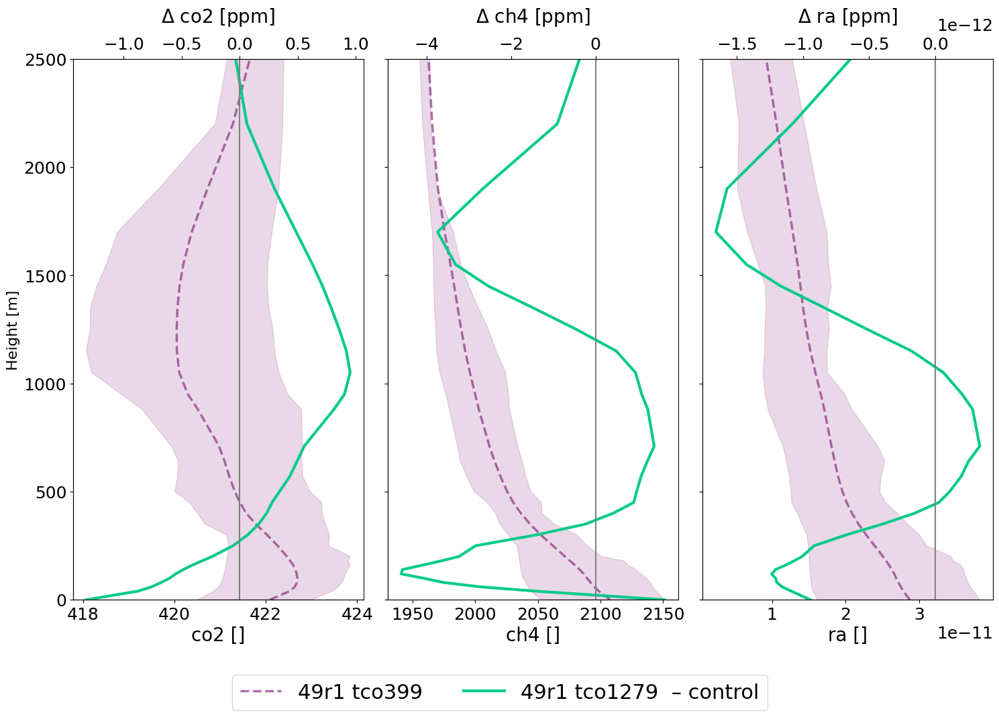

In [21]:


time_selection = "day"   # options: "day", "night", "all"

if time_selection == "day":
    daytime = day_hours
elif time_selection == "night":
    daytime = night_hours
# Variables

ds     = IFS['cabauw']['z']
plot_exps = ['ctrl','dryMF','ctrl_9km','TKEv2']

vars = ['T', 'q', 'u', 'v', 'co2']
vars = ['co2','ch4','ra']

# --- Select time based on day/night ---
if time_selection == "day":
    ds_ctrl     = ds[plot_exps[0]].sel(time=ds[plot_exps[0]]['time'].dt.hour.isin(range(daytime[0],daytime[1])))  # C
elif time_selection == "night":
    ds_ctrl     = ds[plot_exps[0]].sel(time=~ds[plot_exps[0]]['time'].dt.hour.isin(range(daytime[0],daytime[1]))) # 
else:
    ds_ctrl = ds[plot_exps[0]]

fig, axes = plt.subplots(1, len(vars), figsize=(5 * len(vars), 10), sharey=True)

if len(vars) == 1:
    axes = [axes]

# Loop over variables
for i, (ax, var) in enumerate(zip(axes, vars)):
    ax2 = ax.twiny()  # Secondary x-axis for Δ profiles
    for ide, (exp, _, label,color) in enumerate(exp_names):
        if exp not in plot_exps:
            continue
        
        

        # --- Select time based on day/night ---
        # if time_selection == "day":
        #     ds_exp     = ds[exp].sel(time=ds[exp]['time'].dt.hour.isin(range(daytime[0],daytime[1])))  # 06–17 UTC
        # elif time_selection == "night":
        #     ds_exp     = ds[exp].sel(time=~ds[exp]['time'].dt.hour.isin(range(daytime[0],daytime[1]))) # 18–05 UTC
        # else:
        #     ds_exp =  ds[exp]

        ds_exp     = ds[exp].sel(time=ds_ctrl['time'])  # 06–17 UTC
        if exp =='TKE':
            ds_exp=ds_exp.sel(height=slice(110,None))
        day_data = ds_exp[var]
        ctrl_data = ds_ctrl[var]
        if var =='ch4':
            day_data = concentration_to_ppm('ch4',day_data)
            ctrl_data = concentration_to_ppm('ch4',ctrl_data)
        elif var =='ra':
            day_data = concentration_to_ppm('ra',day_data)
            ctrl_data = concentration_to_ppm('ra',ctrl_data)



        if ide == 0:
            # CONTROL: mean + IQR shading
            q25 = day_data.chunk({'time': -1}).quantile(0.25, dim='time')
            q75 = day_data.chunk({'time': -1}).quantile(0.75, dim='time')
            mean_profile = day_data.mean('time')
            ax.plot(mean_profile, mean_profile['height'], label=label, color=color, lw=2.5,ls='--',alpha=0.6)
            ax.fill_betweenx(mean_profile['height'], q25, q75, color=color, alpha=0.16)
        else:
            # ax.plot(day_data.mean('time'), day_data['height'], label=label, color=color, lw=2)
            # OTHER: Δ vs control on secondary x-axis
            delta = (day_data - ctrl_data).mean('time')
            ax2.plot(delta, delta['height'], ls='-', lw=3, label=f"{label} – control", color=color)

    # Label and axis formatting
    
    units = getattr(ctrl_data, 'units', '')
    var_long = var
    if var =='t': var_long='T'

    ax.set_xlabel(f"{var_long} [{units}]", fontsize=20)
    # ax.set_title(var_long, fontsize=18)
    # ax.grid(True)

    if i == 0:
        ax.set_ylabel("Height [m]", fontsize=16)
        # Fix 2: combine legends from both axes
        handles_ax, labels_ax = ax.get_legend_handles_labels()
        handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
        fig.legend(handles_ax + handles_ax2, labels_ax + labels_ax2,
           loc='lower center', bbox_to_anchor=(0.5, -0.08),
           ncol=4, fontsize=22, frameon=True)
    else:
        ax.set_ylabel("")

    # Secondary axis formatting
    ax2.axvline(0, color='grey', lw=1.5)
    # ax2.set_xlabel(r'$\Delta$ ' + var_long + f' [{units}]', fontsize=20, labelpad=15)
    ax2.set_xlabel(r'$\Delta$ ' + var_long + f' [ppm]', fontsize=20, labelpad=15)

    ax2.spines['right'].set_visible(False)

    # Limits and range
    ax.set_ylim([0, 2500])
    

plt.tight_layout()
plt.subplots_adjust(bottom=0.1)  # Add space for the legend

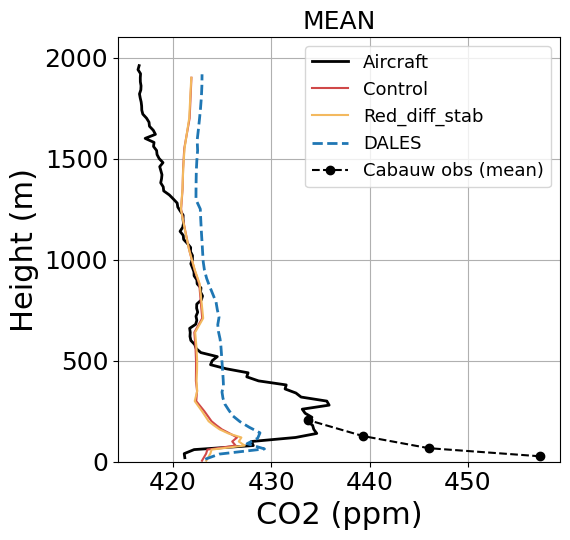

In [ ]:

# ── Mean CO2 profile (aircraft + IFS + DALES) ─────────────────────────────────
# Standalone single-panel version of the MEAN panel from cell 31.

# --- same settings as cell 31 ---
plot_exps = ['ctrl_49r2b', 'ctrl_9km', 'half_diff_stable']
site_key  = 'loobos'

dales_ds = None
try:
    dales_ds = dales_3d_loobos
except NameError:
    dales_ds = None

dales_co2_var = None
if dales_ds is not None:
    preferred = ['sv004_ppm', 'sv003_ppm', 'sv002_ppm', 'sv001_ppm']
    for v in preferred:
        if v in dales_ds.data_vars:
            dales_co2_var = v
            break
    if dales_co2_var is None:
        for v in dales_ds.data_vars:
            if not str(v).endswith('_ppm'):
                continue
            ln = str(dales_ds[v].attrs.get('long_name', '')).lower()
            if 'carbon dioxide' in ln or ln == 'carbon dioxide':
                dales_co2_var = v
                break

# Common altitude grid
z_common = np.arange(0, 2101, 20)

fig_mean, ax = plt.subplots(figsize=(5.8, 5.5))

# ── Aircraft mean ──────────────────────────────────────────────────────────────
aircraft_profiles = []
leg_alt_ranges    = {}

for leg in leg_names:
    sel_air = ds_loobos['Aircraft_co2_mol'].sel(date=slice(legs[leg][0], legs[leg][1]))
    alt = np.asarray(sel_air['Alt'].values)
    co2 = np.asarray(sel_air['CO2_7815'].values)

    mask = np.isfinite(alt) & np.isfinite(co2)
    if mask.sum() < 2:
        continue

    alt_s = alt[mask]
    co2_s = co2[mask]
    order  = np.argsort(alt_s)
    alt_s  = alt_s[order]
    co2_s  = co2_s[order]

    leg_alt_ranges[leg] = (float(np.nanmin(alt_s)), float(np.nanmax(alt_s)))

    interp = np.interp(z_common, alt_s, co2_s, left=np.nan, right=np.nan)
    aircraft_profiles.append(interp)

if len(aircraft_profiles) > 0:
    arr   = np.vstack(aircraft_profiles)
    count = np.sum(np.isfinite(arr), axis=0)
    with np.errstate(invalid='ignore', divide='ignore'):
        mean_aircraft = np.nansum(arr, axis=0) / count
    mean_aircraft = np.where(count > 0, mean_aircraft, np.nan)
    ax.plot(mean_aircraft, z_common, color='k', lw=2.0, label='Aircraft')

# ── IFS mean ──────────────────────────────────────────────────────────────────
for exp, exp_longname, label, color in exp_names:
    if exp not in plot_exps:
        continue

    leg_co2 = []
    for leg in leg_names:
        if leg not in leg_alt_ranges:
            continue
        zmin, zmax = leg_alt_ranges[leg]
        ds_exp = (
            IFS[site_key]['z'][exp]
            .sel(time=midd_times[leg], method='nearest')
            .sel(height=slice(0, 2200))
        )
        co2_leg = ds_exp['co2'].where(
            (ds_exp['height'] >= zmin) & (ds_exp['height'] <= zmax)
        )
        leg_co2.append(co2_leg)

    if len(leg_co2) > 0:
        mean_ifs = xr.concat(leg_co2, dim='leg').mean('leg', skipna=True)
        mean_ifs.plot(ax=ax, y='height', c=color, label=label, add_legend=False)

# ── DALES mean ────────────────────────────────────────────────────────────────
if (dales_ds is not None) and (dales_co2_var is not None):
    leg_dales = []
    for leg in leg_names:
        if leg not in leg_alt_ranges:
            continue
        zmin, zmax = leg_alt_ranges[leg]
        try:
            dales_leg = (
                dales_ds[dales_co2_var]
                .sel(time=midd_times[leg], method='nearest')
                .sel(zt=slice(0, 2200))
            )
            dales_leg = dales_leg.where((dales_leg['zt'] >= zmin) & (dales_leg['zt'] <= zmax))
            leg_dales.append(dales_leg)
        except Exception:
            pass

    if len(leg_dales) > 0:
        mean_dales = xr.concat(leg_dales, dim='leg').mean('leg', skipna=True)
        ax.plot(mean_dales.values, mean_dales['zt'].values,
                color='C0', ls='--', lw=2.0, label='DALES')

# ── Cabauw tower CO2 (mean over leg mid-times) ────────────────────────────────
obs_ds_cabauw   = ds_cabauw['Cabauw_CO2_May2022']
_cabauw_heights = np.array([27, 67, 127, 207])
obs_tol_mean    = pd.Timedelta('38min')

obs_cabauw_per_leg = []
for leg in leg_names:
    t_target  = pd.Timestamp(midd_times[leg])
    obs_times = pd.DatetimeIndex(obs_ds_cabauw['time'].values)
    dt_vals   = np.abs(obs_times - t_target)
    idx       = int(dt_vals.argmin())
    if dt_vals[idx] <= obs_tol_mean:
        obs_vals = np.array([float(obs_ds_cabauw[f'co2_{z}m'].isel(time=idx).values)
                             for z in _cabauw_heights])
        obs_cabauw_per_leg.append(obs_vals)

if len(obs_cabauw_per_leg) > 0:
    obs_cabauw_mean = np.nanmean(obs_cabauw_per_leg, axis=0)
    ax.plot(obs_cabauw_mean, _cabauw_heights, 'ko--', lw=1.5, ms=6,
            label='Cabauw obs (mean)', zorder=6)

ax.set_title('MEAN', fontsize=18)
ax.set_xlabel('CO2 (ppm)')
ax.set_ylabel('Height (m)')
ax.set_ylim(0, 2100)
ax.grid(True)
ax.legend(fontsize=13)
fig_mean.tight_layout()


In [ ]:
# ── Combined publication figure: CO2 + qt + θ profiles (Day / Night) ──────────
# Layout : 3 rows × 2 columns
#   row 0 : CO2  — aircraft observations   (solid black)
#   row 1 : qt   — radiosonde observations (dashed black)
#   row 2 : θ    — radiosonde observations (dashed black)
# ctrl_49r2b is drawn thicker than other experiments.
# half_diff_stable is only shown in row 0 (CO2).

# --- same settings as cell 31 ---

# ── Styling constants ─────────────────────────────────────────────────────────
CTRL_EXP  = 'ctrl_49r2b'
CO2_EXPS  = ['ctrl_49r2b', '9km_49r2b', 'half_diff_stable','short_tail_ABL']  # row 0 only
CO2_EXPS  = ['ctrl_49r2b', '9km_49r2b','short_tail_ABL']  # row 0 only
MET_EXPS  = ['ctrl_49r2b', '9km_49r2b']                       # rows 1–2
site_key  = 'loobos'
LW_CTRL   = 2.5    # control experiment
LW_OTHER  = 1.5    # other experiments
LW_OBS    = 2.0    # observations
MAX_H     = 1900   # max plotted height (m)
FS        = 11     # base font size
FS_TITLE  = 12
FS_PANEL  = 12
# Common altitude grid
z_common = np.arange(0, 2101, 20)

# Radiosonde variable maps
_rv_obs  = {'qt': 'q',     'th': 'theta'}
_rv_ifs  = {'qt': 'q',     'th': 'th'}
_rfac    = {'qt': 1000,    'th': 1}
_rxlab   = {'qt': r'$q_t$ (g kg$^{-1}$)', 'th': r'$\theta$ (K)'}

# ── Column groupings ──────────────────────────────────────────────────────────
legs_by_col  = [day_legs,        night_legs]
radio_by_col = [day_radio_times, night_radio_times]
col_titles_p = [
    f'Day  ({day_hours[0]:02d}–{day_hours[1]:02d} h LT)',
    f'Night  (h<{night_hours[0]:02d} or h≥{night_hours[1]:02d} LT)',
]

# ── DALES CO2 variable selection ─────────────────────────────────────────────
dales_ds = None
try:
    dales_ds = dales_3d_loobos
except NameError:
    dales_ds = None
dales_co2_var = None
if dales_ds is not None:
    preferred = ['sv004_ppm', 'sv003_ppm', 'sv002_ppm', 'sv001_ppm']
    for v in preferred:
        if v in dales_ds.data_vars:
            dales_co2_var = v
            break
    if dales_co2_var is None:
        for v in dales_ds.data_vars:
            if not str(v).endswith('_ppm'):
                continue
            ln = str(dales_ds[v].attrs.get('long_name', '')).lower()
            if 'carbon dioxide' in ln or ln == 'carbon dioxide':
                dales_co2_var = v
                break

# ── Figure ────────────────────────────────────────────────────────────────────
fig_pub, axes_pub = plt.subplots(3, 2, figsize=(10, 15), sharey=True)

# ─────────────────────────────────────────────────────────────────────────────
# ROW 0 : CO2  (aircraft, solid black line)
# ─────────────────────────────────────────────────────────────────────────────
for icol in range(2):
    ax       = axes_pub[0, icol]
    legs_sub = legs_by_col[icol]

    # Aircraft mean
    _airprof  = []
    _alt_rngs = {}
    for leg in legs_sub:
        _sa  = ds_loobos['Aircraft_co2_mol'].sel(date=slice(legs[leg][0], legs[leg][1]))
        _alt = np.asarray(_sa['Alt'].values)
        _co2 = np.asarray(_sa['CO2_7815'].values)
        _msk = np.isfinite(_alt) & np.isfinite(_co2)
        if _msk.sum() < 2:
            continue
        _aa = _alt[_msk][np.argsort(_alt[_msk])]
        _ca = _co2[_msk][np.argsort(_alt[_msk])]
        _alt_rngs[leg] = (float(_aa.min()), float(_aa.max()))
        _airprof.append(np.interp(z_common, _aa, _ca, left=np.nan, right=np.nan))

    if _airprof:
        _arr = np.vstack(_airprof)
        _cnt = np.sum(np.isfinite(_arr), axis=0)
        with np.errstate(invalid='ignore', divide='ignore'):
            _mean_air = np.nansum(_arr, axis=0) / _cnt
        ax.plot(np.where(_cnt > 0, _mean_air, np.nan), z_common,
                color='grey', lw=LW_OBS, ls='-',
                label=f'Aircraft  (n={len(_airprof)})')

    # IFS mean — CO2 only (incl. half_diff_stable)
    for exp, exp_longname, label, color in exp_names:
        if exp not in CO2_EXPS:
            continue
        lw = LW_CTRL if exp == CTRL_EXP else LW_OTHER
        _lco2 = []
        for leg in legs_sub:
            if leg not in _alt_rngs:
                continue
            _zmin, _zmax = _alt_rngs[leg]
            _zmin = 0
            _dse = (IFS[site_key]['z'][exp]
                    .sel(time=midd_times[leg], method='nearest')
                    .sel(height=slice(0, 2200)))
            _lco2.append(_dse['co2'].where(
                (_dse['height'] >= _zmin) & (_dse['height'] <= _zmax)
            ))
        if _lco2:
            _mifs = xr.concat(_lco2, dim='leg').mean('leg', skipna=True)
            ax.plot(_mifs.values, _mifs['height'].values,
                    color=color, lw=lw, label=label)
            _blh_vals = []
            for leg in legs_sub:
                if leg not in _alt_rngs:
                    continue
                try:
                    _srf = IFS[site_key]['srf'][exp].sel(time=midd_times[leg], method='nearest')
                    _blh_vals.append(float(_srf['blh'].values))
                except Exception:
                    pass
            if _blh_vals:
                if exp in MET_EXPS:
                    ax.axhline(np.nanmean(_blh_vals), color=color, lw=1)

    # DALES mean (if available)
    if (dales_ds is not None) and (dales_co2_var is not None):
        _lda = []
        for leg in legs_sub:
            if leg not in _alt_rngs:
                continue
            _zmin, _zmax = _alt_rngs[leg]
            _zmin = 0
            try:
                _dl = (dales_ds[dales_co2_var]
                       .sel(time=midd_times[leg], method='nearest')
                       .sel(zt=slice(0, 2200)))
                _lda.append(_dl.where((_dl['zt'] >= _zmin) & (_dl['zt'] <= _zmax)))
            except Exception:
                pass
        if _lda:
            _mda = xr.concat(_lda, dim='leg').mean('leg', skipna=True)
            ax.plot(_mda.values, _mda['zt'].values,
                    color='C0', ls='--', lw=LW_CTRL, label='DALES')

    # Surface instruments — black dots averaged over the same leg time windows
    loobos_tower_height  = 30   # m  (Air_Quality tower)
    loobos_fluxes_height = 10   # m  (Flux tower)
    loobos_air_samples_height = 5   # m  (Air samples)
    _surf_sources = [
        (ds_loobos['Air_Quality']['co2_mixing_ratio'], loobos_tower_height,  'Tower CO$_2$ (30 m)','d'),
        # (ds_loobos['Fluxes']['co2_mole_fraction'],     loobos_fluxes_height, 'Flux tower CO$_2$ (10 m)','o'),
        (ds_loobos['airsamples_O2_CO2']['CO2.pic'], loobos_air_samples_height, 'Air samples CO$_2$ (5 m)','s'),
    ]
    for _da, _h, _lbl, _marker in _surf_sources:
        _per_leg = []
        for leg in legs_sub:
            try:
                _t0 = pd.Timestamp(legs[leg][0]) - pd.Timedelta(minutes=10)
                _t1 = pd.Timestamp(legs[leg][1]) + pd.Timedelta(minutes=10)
                _seg = _da.sel(time=slice(_t0, _t1))
                _val = float(_seg.mean(skipna=True).values)
                if np.isfinite(_val):
                    _per_leg.append(_val)
            except Exception:
                pass
        if _per_leg:
            ax.plot(float(np.nanmean(_per_leg)), _h,
                    _marker, c='grey', ms=7, zorder=5,
                    label=_lbl #if icol == 0 else '_nolegend_'
                    )

    ax.set_xlabel('CO$_2$ (ppm)', fontsize=FS)
    ax.set_xlim(416, 460)
    ax.grid(True, lw=0.5, alpha=0.6)

# ─────────────────────────────────────────────────────────────────────────────
# ROWS 1–2 : qt and θ  (radiosonde, dashed black line)
# ─────────────────────────────────────────────────────────────────────────────
for ivar, var in enumerate(['qt', 'th']):
    var_obs = _rv_obs[var]
    var_ifs = _rv_ifs[var]
    fac     = _rfac[var]

    for icol in range(2):
        ax   = axes_pub[ivar + 1, icol]
        tset = radio_by_col[icol]

        if tset:
            # Radiosonde mean (dashed black)
            _rs   = loobos_radio.sel(time=tset).sel(Height=slice(0, MAX_H))
            _mrad = fac * _rs[var_obs].mean('time')
            ax.plot(_mrad, _rs['Height'],
                    color='grey', lw=LW_OBS, ls='--',
                    label=f'Radiosonde  (n={len(tset)})')

            # IFS mean — masked to valid radiosonde range per time
            for exp, exp_longname, label, color in exp_names:
                if exp not in MET_EXPS:
                    continue
                lw = LW_CTRL if exp == CTRL_EXP else LW_OTHER
                _lmod = []
                for t in tset:
                    _rt  = loobos_radio.sel(time=t).sel(Height=slice(0, MAX_H))
                    _ov  = _rt[var_obs].values
                    _hv  = _rt['Height'].values
                    _vld = np.isfinite(fac * _ov)
                    if _vld.sum() < 2:
                        continue
                    _zmin = float(_hv[_vld].min())
                    _zmax = float(_hv[_vld].max())
                    _mt   = (IFS['loobos']['z'][exp]
                              .sel(time=t, method='nearest')
                              .sel(height=slice(0, MAX_H)))
                    _lmod.append(_mt[var_ifs].where(
                        (_mt['height'] >= _zmin) & (_mt['height'] <= _zmax)
                    ))
                if _lmod:
                    _mm = xr.concat(_lmod, dim='time').mean('time', skipna=True)
                    ax.plot(_mm.values, _mm['height'].values,
                            color=color, lw=lw, label=label)
                    _blh_ts = []
                    for t in tset:
                        try:
                            _srf = IFS['loobos']['srf'][exp].sel(time=t, method='nearest')
                            _blh_ts.append(float(_srf['blh'].values))
                        except Exception:
                            pass
                    if _blh_ts:
                        ax.axhline(np.nanmean(_blh_ts), color=color, lw=1)

        ax.set_xlabel(_rxlab[var], fontsize=FS)
        ax.grid(True, lw=0.5, alpha=0.6)

# ─────────────────────────────────────────────────────────────────────────────
# Column titles, y-labels, panel letters, legends
# ─────────────────────────────────────────────────────────────────────────────
for icol in range(2):
    axes_pub[0, icol].set_title(col_titles_p[icol], fontsize=FS_TITLE, fontweight='bold')

for irow in range(3):
    axes_pub[irow, 0].set_ylabel('Height (m)', fontsize=FS)
    for icol in range(2):
        ax     = axes_pub[irow, icol]
        letter = 'abcdef'[irow * 2 + icol]
        ax.set_ylim(0, MAX_H)
        ax.tick_params(labelsize=10)
        ax.text(0.03, 0.97, f'({letter})', transform=ax.transAxes,
                fontsize=FS_PANEL, fontweight='bold', va='top', ha='left')
        if irow < 2:
            ax.legend(fontsize=9, loc='best', framealpha=0.85,
                      edgecolor='0.7')

import os
os.makedirs(dir_out, exist_ok=True)
fig_pub.tight_layout()
plt.savefig(f'{dir_out}/mean_profiles_loobos_day_night.png', dpi=250, bbox_inches='tight')
plt.show()


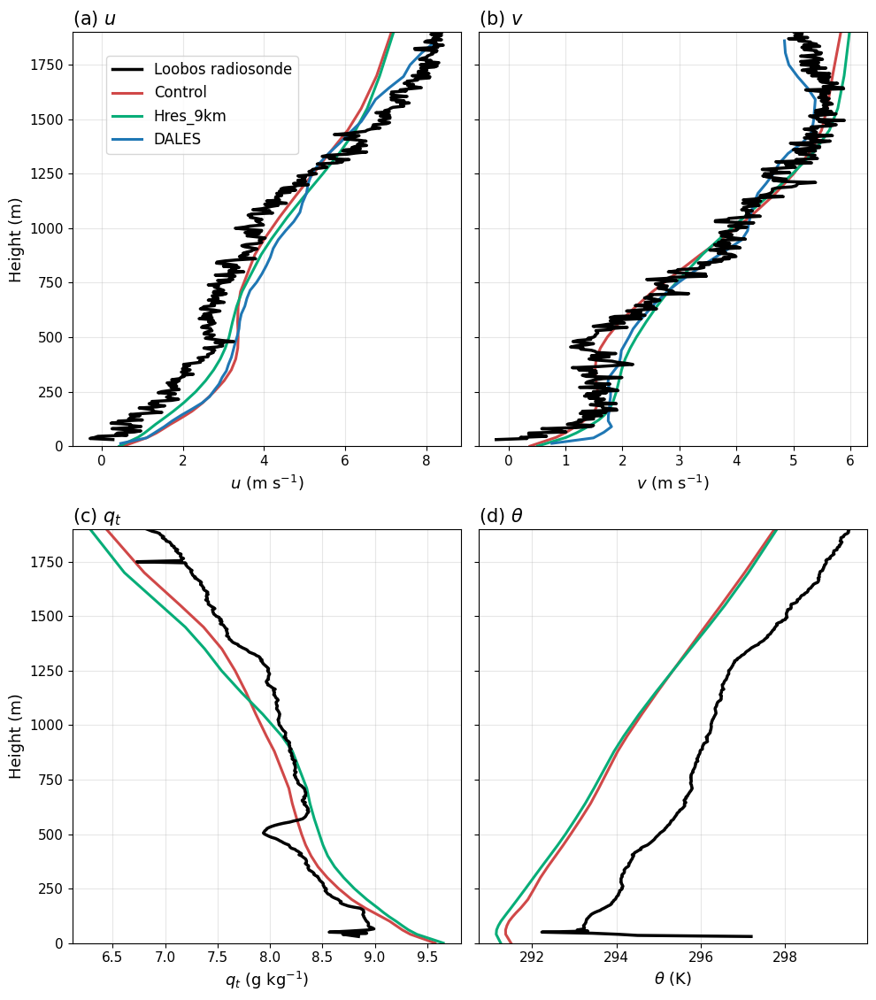

In [32]:
# a 2x2 plot with mean profiles from radiosondes at Loobos and corresponding mean profiles of Control
# take example from cell below
vars = ['u', 'v', 'qt', 'th']
plot_exps = ['ctrl_49r2b','9km_49r2b']   # only Control experiment

max_y = 1900

# --- pretty labels for titles / x-labels ---
var_titles = {
    'u': r'$u$',
    'v': r'$v$',
    'qt': r'$q_t$',
    'th': r'$\theta$'
}

xlabels = {
    'u': r'$u$ (m s$^{-1}$)',
    'v': r'$v$ (m s$^{-1}$)',
    'qt': r'$q_t$ (g kg$^{-1}$)',
    'th': r'$\theta$ (K)'
}

panel_labels = ['(a)', '(b)', '(c)', '(d)']

fig, axes = plt.subplots(2, 2, figsize=(10, 12), sharey=True)
axes = axes.flatten()

# select times of interest from radiosondes
times = loobos_radio.time.values

legend_handles = None
legend_labels = None

for ivar, var in enumerate(vars):
    ax = axes[ivar]

    # --- variable mapping ---
    if var == 'qt':
        var_obs = 'q'
        var_ifs = 'q'
        factor = 1000      # apply ONLY to radiosonde
    elif var == 'th':
        var_obs = 'theta'
        var_ifs = var
        factor = 1
    else:
        var_obs = var
        var_ifs = var
        factor = 1

    # --- radiosonde mean ---
    radio_sel = loobos_radio.sel(time=times).sel(Height=slice(0, max_y))
    mean_radio = factor * radio_sel[var_obs].mean("time")
    height_radio = radio_sel["Height"]

    # --- IFS mean ---
    exp_handles = []
    exp_labels = []
    for  (exp, exp_longname, label, color) in exp_names:
        if exp not in plot_exps:
            continue
        model_sel = IFS['loobos']['z'][exp].sel(time=times, method='nearest').sel(height=slice(0, max_y))
        mean_model = model_sel[var_ifs].mean("time")   # no factor for model
        height_model = model_sel["height"]
        l, = ax.plot(mean_model, height_model, lw=2.2, color=color, label=label)
        exp_handles.append(l)
        exp_labels.append(label)

    # --- DALES mean ---
    if var in ['th','ta']:
        pass
        # dales_sel = dales_ta_loobos.sel(time=times, method='nearest').sel(zt=slice(0, max_y))
        # mean_dales = dales_sel[var].mean("time")  
        # height_dales = dales_sel["zt"]
    elif var in ['qt',]:
        pass
        # dales_sel = dales_qt_loobos.sel(time=times, method='nearest').sel(zt=slice(0, max_y))
        # mean_dales = factor*dales_sel[var].mean("time")  *np.nan
        # height_dales = dales_sel["zt"]
    else:
        dales_sel = dales_3d_loobos.sel(time=times, method='nearest').sel(zt=slice(0, max_y))
        mean_dales = dales_sel[var].mean("time") 
        height_dales = dales_sel["zt"]
        l3, = ax.plot(mean_dales, height_dales, lw=2.2, color='C0', label='DALES')

    # --- plot mean profiles ---
    l1, = ax.plot(mean_radio, height_radio, lw=2.5, color='k', label='Loobos radiosonde')
    

    # save handles once for global legend
    if legend_handles is None:
        legend_handles = [l1] + exp_handles + [l3]
        legend_labels = ['Loobos radiosonde'] + exp_labels + ['DALES']

    # --- styling ---
    ax.set_xlabel(xlabels[var], fontsize=13)
    ax.set_title(f"{panel_labels[ivar]} {var_titles[var]}", loc='left', fontsize=15)
    ax.grid(True, alpha=0.3)
    ax.set_ylim(0, max_y)
    ax.tick_params(labelsize=11)

# y-label only on left column
axes[0].set_ylabel('Height (m)', fontsize=13)
axes[2].set_ylabel('Height (m)', fontsize=13)

# --- single legend for whole figure ---
fig.legend(
    legend_handles,
    legend_labels,
    # loc='upper center',
    ncol=1,
    fontsize=12,
    frameon=True,
    bbox_to_anchor=(0.35, 0.9)
)

fig.tight_layout(rect=[0, 0, 1, 0.95])
# fig.savefig(f'{dir_out}/mean_profiles_loobos_sondes.png', dpi=300)
plt.show()


/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_751353/7898074.py:66: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_751353/7898074.py:66: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_751353/7898074.py:66: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_751353/7898074.py:66: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_751353/7898074.py:66: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.39392659/ipykernel_7

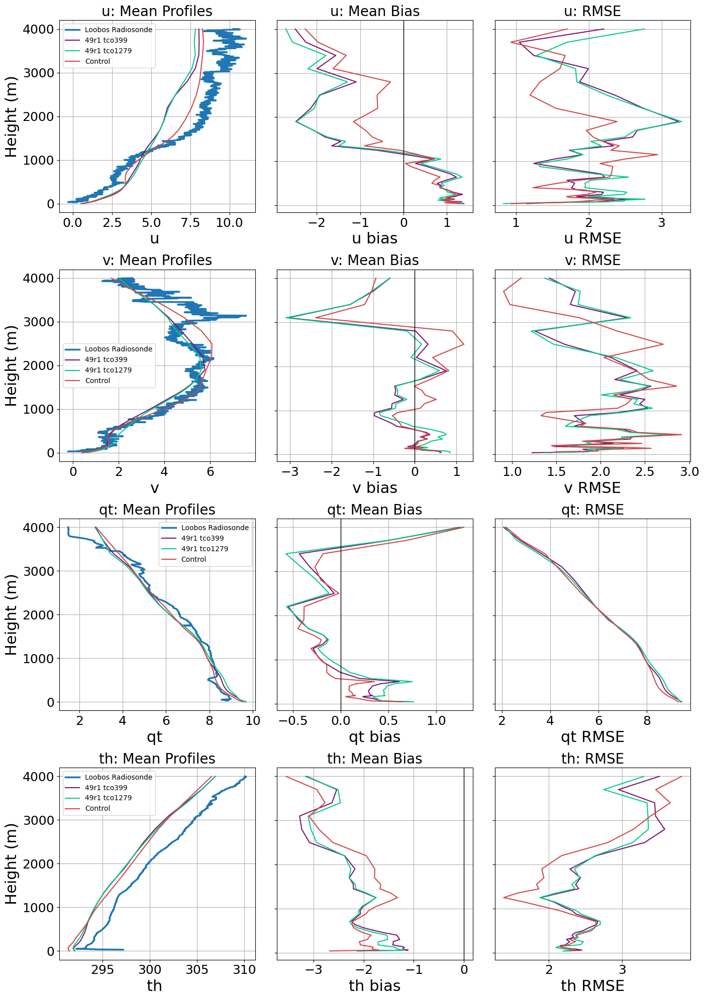

In [22]:
vars = ['u','v','qt','th']
plot_exps = ['ctrl','TKEv2','reorder','ctrl_9km']  # experiments to plot
plot_exps = ['ctrl','TKEv2','ctrl_9km','ctrl_49r2b']  # experiments to plot

n_vars = len(vars)
fig, axes = plt.subplots(n_vars, 3, figsize=(14, 5*n_vars), sharey=False)
# if only one variable, axes is 1D; force 2D indexing
if n_vars == 1:
    axes = axes[np.newaxis, :]

for ivar, var in enumerate(vars):
    # --- variable mapping ---
    if var == 'qt':
        var_obs = 'q'
        var_ifs = 'q'
        factor = 1000
    elif var == 'th':
        var_obs = 'theta'
        var_ifs =  var
        factor=1
    else:
        var_obs = var
        var_ifs = var
        factor = 1

    # select times of interest
    times = loobos_radio.time.values

    # --- radiosonde mean ---
    radio_sel = loobos_radio.sel(time=times).sel(Height=slice(0, 4000))
    mean_radio = factor*radio_sel[var_obs].mean("time")
    height_radio = radio_sel["Height"]

    # --- axes for this variable ---
    ax_mean, ax_bias, ax_rmse = axes[ivar]

    lines, labels = [], []

    # --- mean profile ---
    l1, = ax_mean.plot(mean_radio, height_radio, lw=2.5, color="C0")
    lines.append(l1)
    labels.append("Loobos Radiosonde")

    for  (exp, exp_longname, label, color) in exp_names:
        if exp not in plot_exps:
            continue

        # select same times for model
        model_sel = IFS['loobos']['z'][exp].sel(time=times, method='nearest').sel(height=slice(0, 4000))
        mean_model = model_sel[var_ifs].mean("time")
        height_model = model_sel["height"]

        # --- mean profile ---
        line, = ax_mean.plot(mean_model, height_model, linestyle="-", color=color)
        lines.append(line)
        labels.append(label)

        # --- bias ---
        radio_interp = np.interp(height_model, height_radio, mean_radio)
        bias = mean_model - radio_interp
        ax_bias.plot(bias, height_model, linestyle="-", color=color)

        # --- RMSE ---
        obs_on_model_grid = radio_sel[var_obs].interp(Height=height_model)
        diffs = model_sel[var_ifs].values - obs_on_model_grid.values
        rmse = np.sqrt(np.nanmean(diffs**2, axis=0))
        ax_rmse.plot(rmse, height_model, linestyle="-", color=color)

    # --- style axes ---
    ax_mean.set_title(f"{var}: Mean Profiles", fontsize=20)
    ax_mean.set_xlabel(f"{var} ")
    ax_mean.set_ylabel("Height (m)")
    ax_mean.grid(True)

    ax_bias.set_title(f"{var}: Mean Bias", fontsize=20)
    ax_bias.set_xlabel(f"{var} bias")
    ax_bias.axvline(0, color="k", lw=1)
    ax_bias.set_yticklabels('')
    ax_bias.grid(True)

    ax_rmse.set_title(f"{var}: RMSE", fontsize=20)
    ax_rmse.set_xlabel(f"{var} RMSE")
    ax_rmse.grid(True)
    ax_rmse.set_yticklabels('')

    ax_mean.legend(lines, labels, loc="best", fontsize=10)

fig.tight_layout()
plt.show()

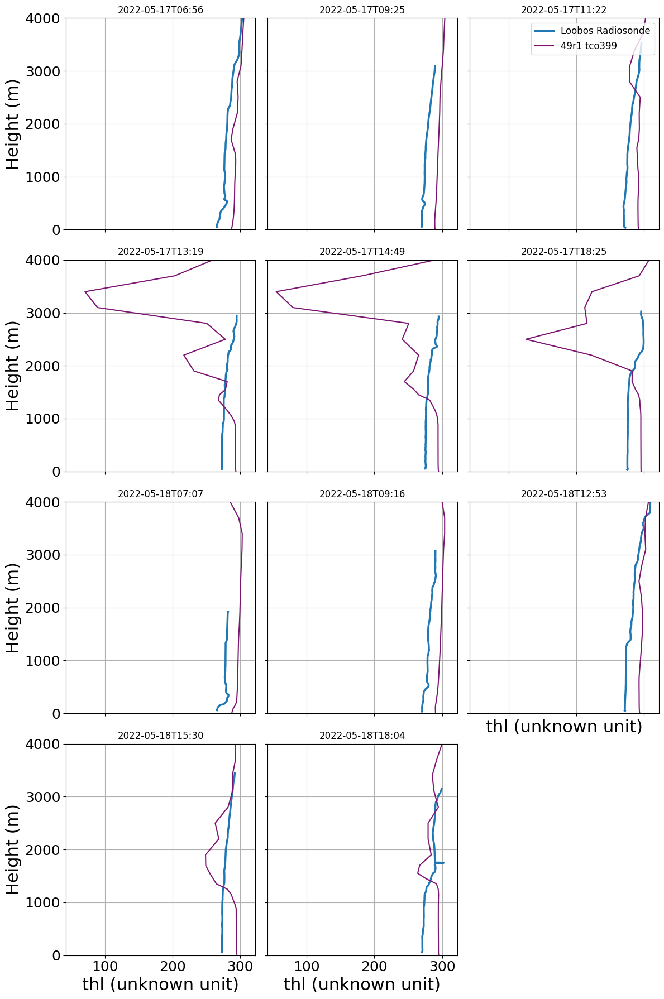

In [23]:
var = 'thl'
plot_input = False   # toggle input profile
plot_exps = ['ctrl','TKE']  # experiments to plot

# define mapping for observed vs model variables
if var == 'thl':
    var_obs = 'theta_lw'
    var_ifs =  var
elif var == 'th':
    var_obs = 'theta'
    var_ifs =  var
else:
    var_obs = var
    var_ifs = var
if var == 'q':
    factor = 1000
else: 
    factor = 1


times = loobos_radio.time.values
n_times = len(times)
nrows, ncols = 4, 3

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 18), sharex=True, sharey=True)
axes = axes.flatten()

lines, labels = [], []

for i, t in enumerate(times):
    ax = axes[i]
    
    # --- radiosonde profile ---
    profile = loobos_radio.sel(time=t).sel(Height=slice(0, 4000))
    l1, = ax.plot(factor*profile[var_obs], profile["Height"], lw=2.5, color='C0')
    
    # --- optional input profile ---
    if plot_input:
        t_nearest = input.time.sel(time=t, method="nearest")
        input_profile = input.sel(time=t_nearest).sel(z=slice(0, 4000))
        unit = input_profile[var].attrs.get("units", "unknown unit")
        l2, = ax.plot(input_profile[var], input_profile["z"], linestyle="--", color='C1')
    else:
        unit = "unknown unit"
        l2 = None
    
    # --- IFS experiments ---
    t_nearest_ifs = IFS['loobos']['z']['ctrl'].time.sel(time=t, method="nearest")
    for exp, exp_longname, label, color in exp_names:
        if exp not in plot_exps:   # skip if not in chosen list
            continue
        loobos_profile = IFS['loobos']['z'][exp].sel(time=t_nearest_ifs).sel(height=slice(0, 4000))
        line, = ax.plot(
            loobos_profile[var_ifs], 
            loobos_profile["height"], 
            linestyle="-", 
            color=color,  # cycle through colors
        )
        if i == 0:  # collect legend entries once
            lines.append(line)
            labels.append(label)
    
    # --- collect radiosonde & input once ---
    if i == 0:
        lines.insert(0, l1)
        labels.insert(0, "Loobos Radiosonde")
        if plot_input:
            lines.insert(1, l2)
            labels.insert(1, "Input for Cabauw")
    
    # style
    ax.set_title(np.datetime_as_string(t, unit='m'), fontsize=12)
    ax.grid(True)
    ax.set_ylim(-1, 4000) 
    # ax.set_xlim(190, 320) 
    
    if i % ncols == 0:
        ax.set_ylabel("Height (m)")
    if i >= nrows*(ncols-1):
        ax.set_xlabel(f"{var} ({unit})")

# remove unused subplots
for j in range(i+1, nrows*ncols):
    fig.delaxes(axes[j])

# put legend inside top-right panel
axes[2].legend(lines, labels, loc='upper right', fontsize=12)

fig.tight_layout()
plt.show()

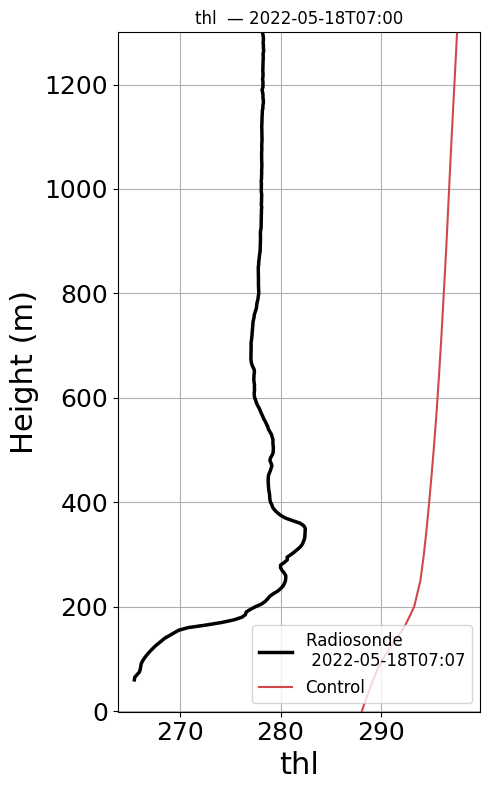

In [33]:
var = 'thl'
plot_exps = ['ctrl_49r2b']   # experiments to overlay
time_sel  = '2022-05-18 07:00:00'

# variable mapping
if var == 'thl':
    var_obs = 'theta_lw'
    var_ifs = var
elif var == 'th':
    var_obs = 'theta'
    var_ifs = var
else:
    var_obs = var
    var_ifs = var
factor = 1000 if var == 'q' else 1

t_sel = np.datetime64(time_sel)

# nearest radiosonde time
t_radio = loobos_radio.time.sel(time=t_sel, method='nearest').values

# nearest IFS time
t_ifs = IFS['loobos']['z']['ctrl_49r2b'].time.sel(time=t_sel, method='nearest').values

fig, ax = plt.subplots(figsize=(5, 8))

# --- radiosonde ---
profile = loobos_radio.sel(time=t_radio).sel(Height=slice(0, 1600))
l_radio, = ax.plot(factor * profile[var_obs], profile['Height'],
                   lw=2.5, color='k', label=f'Radiosonde \n {np.datetime_as_string(t_radio, unit="m")}')

# --- IFS experiments ---
for exp, exp_longname, label, color in exp_names:
    if exp not in plot_exps:
        continue
    loobos_profile = IFS['loobos']['z'][exp].sel(time=t_ifs).sel(height=slice(0, 1600))
    ax.plot(loobos_profile[var_ifs], loobos_profile['height'],
            linestyle='-', color=color, label=label)

ax.set_xlabel(f'{var}')
ax.set_ylabel('Height (m)')
ax.set_ylim(-1, 1300)
ax.set_title(f'{var}  — {np.datetime_as_string(t_ifs, unit="m")}', fontsize=12)
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()


Plotting leg1 around 2022-05-17 06:35:00
Plotting leg2 around 2022-05-17 07:05:00
Plotting leg3 around 2022-05-17 08:25:00
Plotting leg4 around 2022-05-17 12:00:00
Plotting leg5 around 2022-05-17 12:22:30
Plotting leg7 around 2022-05-18 06:37:30
Plotting leg8 around 2022-05-18 06:55:00
Plotting leg9 around 2022-05-18 08:02:30
Plotting leg10 around 2022-05-18 11:46:30
Plotting leg11 around 2022-05-18 12:09:00
Plotting leg12 around 2022-05-18 13:57:30


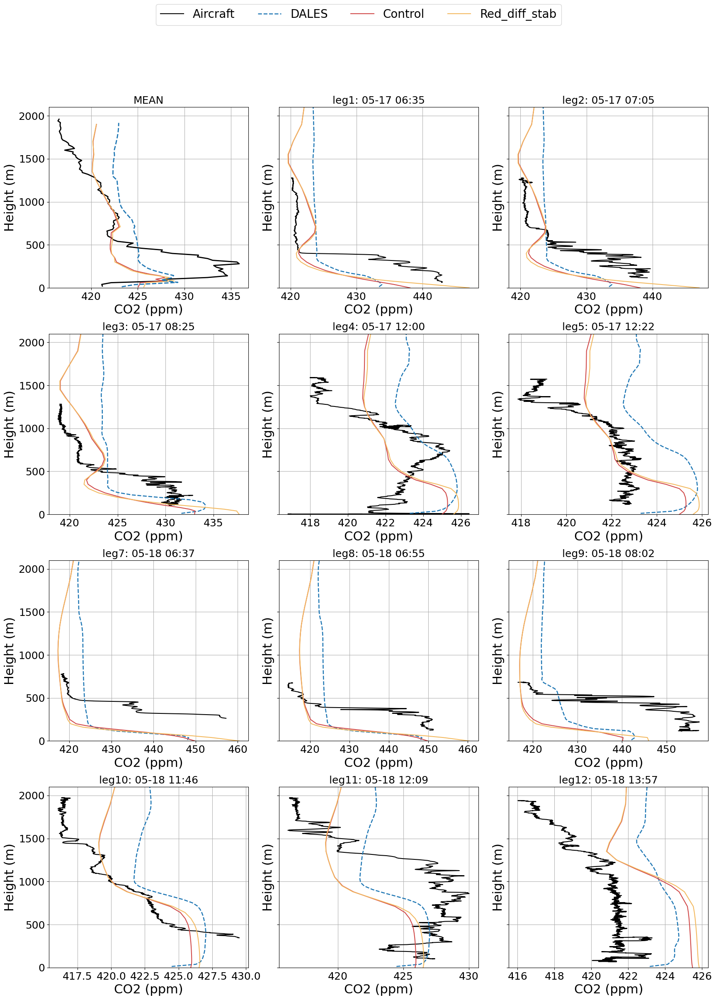

In [34]:
# plot the CO2 profile for all legs in one multi-panel figure
# - exclude leg6
# - add a top-left panel with mean profiles over all remaining legs
# - include DALES profile (if available)
# - include NEMO ensemble envelope as shaded band (if available)

# plot_exps = ['ctrl', 'ctrl_9km', 'TKEv2','ctrl_49r2b']
plot_exps = ['ctrl_49r2b','ctrl_9km','half_diff_stable']
plot_spp_exps = ['SPP_all',]
plot_spp_exps = ['']

site_key = 'loobos'

panel_names = ['MEAN'] + leg_names
n_panels = len(panel_names)

ncols = 3 if n_panels > 4 else (2 if n_panels > 1 else 1)
nrows = int(np.ceil(n_panels / ncols))

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(5.8 * ncols, 5.5 * nrows),
    sharex=False,
    sharey=True,
)
axes = np.atleast_1d(axes).ravel()

# Common altitude grid for averaging aircraft profiles
z_common = np.arange(0, 2101, 20)

# NEMO CO2 variable name (match cell 28)
nemo_var = 'co2_ppm'

# NEMO metadata (label/color)
nemo_label_by_exp = {}
nemo_color_by_exp = {}
for _exp in nemo_exp_names:
    if len(_exp) >= 4:
        exp, _, label, color = _exp[:4]
        nemo_label_by_exp[exp] = label
        nemo_color_by_exp[exp] = color

# Pick DALES dataset + CO2 variable (best-effort)
dales_ds = None
try:
    dales_ds = dales_3d_loobos
except NameError:
        dales_ds = None

dales_co2_var = None
if dales_ds is not None:
    preferred = ['sv004_ppm', 'sv003_ppm', 'sv002_ppm', 'sv001_ppm']
    for v in preferred:
        if v in dales_ds.data_vars:
            dales_co2_var = v
            break
    if dales_co2_var is None:
        # fallback: any ppm variable tagged as carbon dioxide
        for v in dales_ds.data_vars:
            if not str(v).endswith('_ppm'):
                continue
            ln = str(dales_ds[v].attrs.get('long_name', '')).lower()
            if 'carbon dioxide' in ln or ln == 'carbon dioxide':
                dales_co2_var = v
                break

for i, panel in enumerate(panel_names):
    ax = axes[i]

    if panel == 'MEAN':
        # Mean aircraft profile across legs (excluding leg6)
        aircraft_profiles = []
        leg_alt_ranges = {}

        for leg in leg_names:
            sel_air = ds_loobos['Aircraft_co2_mol'].sel(date=slice(legs[leg][0], legs[leg][1]))
            alt = np.asarray(sel_air['Alt'].values)
            co2 = np.asarray(sel_air['CO2_7815'].values)

            mask = np.isfinite(alt) & np.isfinite(co2)
            if mask.sum() < 2:
                continue

            alt_s = alt[mask]
            co2_s = co2[mask]
            order = np.argsort(alt_s)
            alt_s = alt_s[order]
            co2_s = co2_s[order]

            # Save observed altitude range for this leg
            leg_alt_ranges[leg] = (float(np.nanmin(alt_s)), float(np.nanmax(alt_s)))

            # np.interp requires ascending x; outside range -> NaN
            interp = np.interp(z_common, alt_s, co2_s, left=np.nan, right=np.nan)
            aircraft_profiles.append(interp)

        if len(aircraft_profiles) > 0:
            arr = np.vstack(aircraft_profiles)
            count = np.sum(np.isfinite(arr), axis=0)
            with np.errstate(invalid='ignore', divide='ignore'):
                mean_aircraft = np.nansum(arr, axis=0) / count
            mean_aircraft = np.where(count > 0, mean_aircraft, np.nan)
            ax.plot(mean_aircraft, z_common, color='k', lw=2.0)

        # Mean IFS profiles across legs (nearest to each leg mid-time)
        # IMPORTANT: for each leg, mask the model profile outside that leg's observed altitude range
        for exp, exp_longname, label, color in exp_names:
            if exp not in plot_exps:
                continue

            leg_co2 = []
            for leg in leg_names:
                if leg not in leg_alt_ranges:
                    continue

                zmin, zmax = leg_alt_ranges[leg]
                ds_exp = (
                    IFS[site_key]['z'][exp]
                    .sel(time=midd_times[leg], method='nearest')
                    .sel(height=slice(0, 2200))
                )

                co2_leg = ds_exp['co2'].where((ds_exp['height'] >= zmin) & (ds_exp['height'] <= zmax))
                leg_co2.append(co2_leg)

            if len(leg_co2) > 0:
                mean_ifs = xr.concat(leg_co2, dim='leg').mean('leg', skipna=True)
                mean_ifs.plot(
                    ax=ax,
                    y='height',
                    c=color,
                    add_legend=False,
                )

        # Mean NEMO envelope across legs (if available)
        for nemo_exp in plot_spp_exps:
            nemo_ds_z = IFS_nemo.get(site_key, {}).get('z', {}).get(nemo_exp, None)
            if nemo_ds_z is None or nemo_var not in nemo_ds_z:
                continue

            nemo_color = nemo_color_by_exp.get(nemo_exp, 'grey')
            nemo_label = nemo_label_by_exp.get(nemo_exp, 'NEMO')

            leg_min = []
            leg_max = []
            for leg in leg_names:
                if leg not in leg_alt_ranges:
                    continue
                zmin, zmax = leg_alt_ranges[leg]

                try:
                    nemo_leg = (
                        nemo_ds_z[nemo_var]
                        .sel(height=slice(0, 2200))
                        .sel(time=midd_times[leg], method='nearest')
                    )
                except Exception:
                    continue

                if 'number' not in nemo_leg.dims:
                    continue

                min_leg = nemo_leg.min('number').where((nemo_leg['height'] >= zmin) & (nemo_leg['height'] <= zmax))
                max_leg = nemo_leg.max('number').where((nemo_leg['height'] >= zmin) & (nemo_leg['height'] <= zmax))
                leg_min.append(min_leg)
                leg_max.append(max_leg)

            if len(leg_min) > 0:
                mean_min = xr.concat(leg_min, dim='leg').mean('leg', skipna=True)
                mean_max = xr.concat(leg_max, dim='leg').mean('leg', skipna=True)
                ax.fill_betweenx(
                    mean_min['height'],
                    mean_min.values,
                    mean_max.values,
                    color=nemo_color,
                    alpha=0.16,
                    label=nemo_label,
                )

        # Mean DALES profile across legs (if available), masked to each leg observed altitude range
        if (dales_ds is not None) and (dales_co2_var is not None):
            leg_dales = []
            for leg in leg_names:
                if leg not in leg_alt_ranges:
                    continue
                zmin, zmax = leg_alt_ranges[leg]

                try:
                    dales_leg = dales_ds[dales_co2_var].sel(time=midd_times[leg], method='nearest').sel(zt=slice(0, 2200))
                    dales_leg = dales_leg.where((dales_leg['zt'] >= zmin) & (dales_leg['zt'] <= zmax))
                    leg_dales.append(dales_leg)
                except Exception:
                    pass

            if len(leg_dales) > 0:
                mean_dales = xr.concat(leg_dales, dim='leg').mean('leg', skipna=True)
                ax.plot(mean_dales.values, mean_dales['zt'].values, color='C0', ls='--', lw=2.0)

        ax.set_title('MEAN',fontsize=18)
        ax.set_xlabel('CO2 (ppm)')
        ax.set_ylabel('Height (m)')

    else:
        leg = panel
        midd_time_of_leg = midd_times[leg]
        print(f"Plotting {leg} around {midd_time_of_leg}")

        # Aircraft profile for this leg
        sel_air = ds_loobos['Aircraft_co2_mol'].sel(date=slice(legs[leg][0], legs[leg][1]))
        ax.plot(sel_air['CO2_7815'], sel_air['Alt'], color='k', lw=1.5, label='Aircraft')

        # DALES profile near the mid-time of the leg (optional)
        if (dales_ds is not None) and (dales_co2_var is not None):
            alt = np.asarray(sel_air['Alt'].values)
            co2 = np.asarray(sel_air['CO2_7815'].values)
            mask = np.isfinite(alt) & np.isfinite(co2)
            if mask.sum() >= 2:
                zmin, zmax = float(np.nanmin(alt[mask])), float(np.nanmax(alt[mask]))
                try:
                    dales_sel = dales_ds[dales_co2_var].sel(time=midd_time_of_leg, method='nearest').sel(zt=slice(0, 2200))
                    # dales_sel = dales_sel.where((dales_sel['zt'] >= zmin) & (dales_sel['zt'] <= zmax))
                    ax.plot(dales_sel.values, dales_sel['zt'].values, color='C0', ls='--', lw=1.8, label='DALES')
                except Exception:
                    pass

        # IFS profiles near the mid-time of the leg
        for exp, exp_longname, label, color in exp_names:
            if exp in plot_exps:
                ds_exp = (
                    IFS[site_key]['z'][exp]
                    .sel(time=midd_time_of_leg, method='nearest')
                    .sel(height=slice(0, 2200))
                )
                ds_exp['co2'].plot(
                    ax=ax,
                    y='height',
                    label=label,
                    c=color,
                    add_legend=False,
                )

        # NEMO envelope (min/max over ensemble members)
        for nemo_exp in plot_spp_exps:
            nemo_ds_z = IFS_nemo.get(site_key, {}).get('z', {}).get(nemo_exp, None)
            if nemo_ds_z is None or nemo_var not in nemo_ds_z:
                continue

            try:
                nemo_sel = (
                    nemo_ds_z[nemo_var]
                    .sel(height=slice(0, 2200))
                    .sel(time=midd_time_of_leg, method='nearest')
                )
            except Exception:
                continue

            if 'number' not in nemo_sel.dims:
                continue

            nemo_color = nemo_color_by_exp.get(nemo_exp, 'grey')
            nemo_label = nemo_label_by_exp.get(nemo_exp, 'NEMO')

            min_nemo = nemo_sel.min('number')
            max_nemo = nemo_sel.max('number')
            ax.fill_betweenx(
                min_nemo['height'],
                min_nemo.values,
                max_nemo.values,
                color=nemo_color,
                alpha=0.16,
                label=nemo_label,
            )

        ax.set_title(f"{leg}: {str(midd_time_of_leg)[5:-3]}",fontsize=18)
        ax.set_xlabel('CO2 (ppm)')
        ax.set_ylabel('Height (m)')

    ax.grid(True)
    ax.set_ylim(0, 2100)

# Hide unused panels (if any)
for j in range(n_panels, len(axes)):
    axes[j].set_visible(False)

# One shared legend for the whole figure
legend_items = {}
for ax in axes[:n_panels]:
    h, l = ax.get_legend_handles_labels()
    for handle, label in zip(h, l):
        legend_items[label] = handle

fig.legend(
    legend_items.values(),
    legend_items.keys(),
    ncol=4,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.1),
    fontsize=20,
)

fig.tight_layout()

# fig.savefig(f'{dir_out}/CO2_profiles_loobos_plane.png', dpi=300)


# fig.suptitle('CO2 profiles per leg (aircraft vs IFS)', y=1.006)
# fig.tight_layout(rect=(0, 0, 0.92, 0.98))


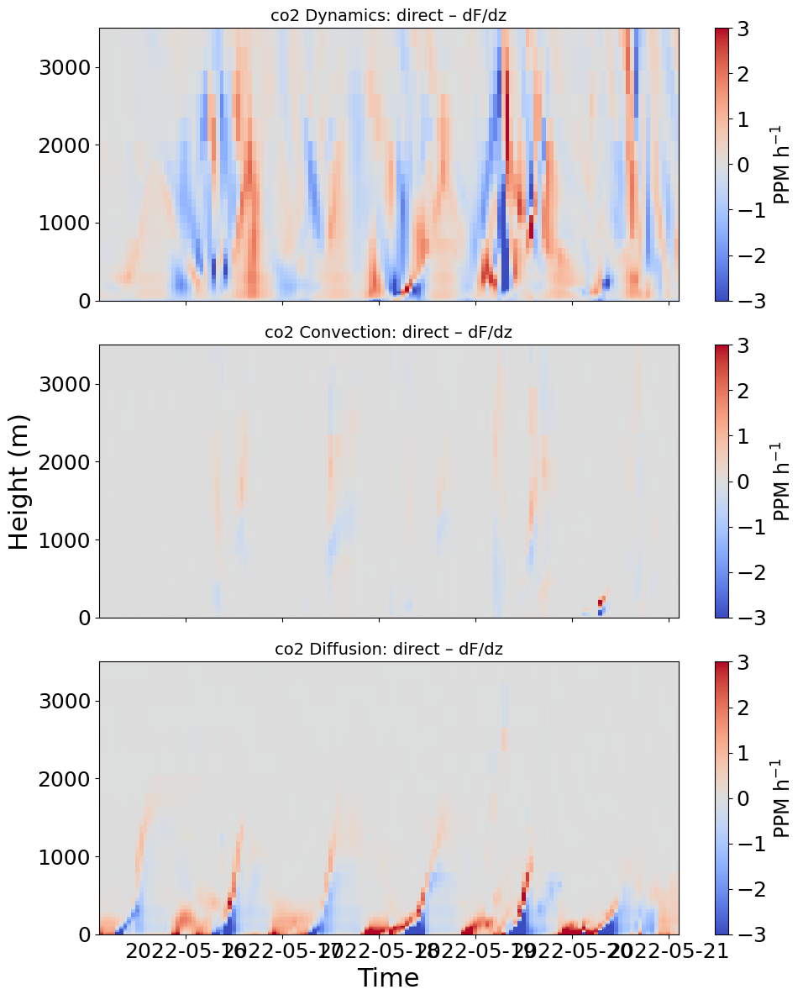

In [26]:
# ===============================
# User options
# ===============================
var = "co2"
plot_exps = ['ctrl',]      # experiments to plot
ylim = 3500

# ===============================
# Figure with 3 rows
# ===============================
fig, axes = plt.subplots(
    nrows=3, ncols=1, figsize=(10, 12), sharex=True, sharey=True
)

titles = [
    f"{var} Dynamics: direct – dF/dz",
    f"{var} Convection: direct – dF/dz",
    f"{var} Diffusion: direct – dF/dz",
]

for ii, (exp, exp_longname, label,_) in enumerate(exp_names):
    if exp not in plot_exps:
        continue

    # full dataset over time
    ds = IFS['slab']['z'][exp]

    time = ds["time"]
    height = ds["height"]

    # -------------------------------------
    # Direct tendencies
    # -------------------------------------
    tend_dyn  = ds[f'd{var}dt_dyn']     # (time, height)
    tend_conv = ds[f'd{var}dt_conv']
    tend_diff = ds[f'd{var}dt_diff']

    unit = ds[f'd{var}dt_dyn'].units
    # -------------------------------------
    # Compute ∂F/∂z from fluxes
    # multiply by 1000 as you did
    # -------------------------------------
    dFdz_dyn  =  ds[f'{var}flx_dyn' ].differentiate('height') # *1000
    dFdz_conv =  ds[f'{var}flx_conv'].differentiate('height') # *1000
    dFdz_diff =  ds[f'{var}flx_diff'].differentiate('height') # *1000

    # -------------------------------------
    # Differences (direct – diagnosed)
    # Shapes: (time, height)
    # -------------------------------------
    diff_dyn  = tend_dyn  - dFdz_dyn
    diff_conv = tend_conv - dFdz_conv
    diff_diff = tend_diff - dFdz_diff
    # diff_diff =  dFdz_diff


    diff_fields = [diff_dyn, diff_conv, diff_diff]

    # -------------------------------------
    # Plot each component in a subplot
    # -------------------------------------
    for ax, field, title in zip(axes, diff_fields, titles):

        pcm = ax.pcolormesh(
            time, height, field.T,
            shading='auto',
            cmap='coolwarm',
            vmin=-3,
            vmax=3
        )

        ax.set_title(title, fontsize=14)
        ax.set_ylim([0, ylim])

        # add colourbar to each row
        cbar = fig.colorbar(pcm, ax=ax, orientation='vertical')
        cbar.set_label(f"{unit}",fontsize=17)

# -------------------------------------
# Shared axis labels
# -------------------------------------
axes[-1].set_xlabel("Time")
axes[1].set_ylabel("Height (m)")

plt.tight_layout()
plt.show()


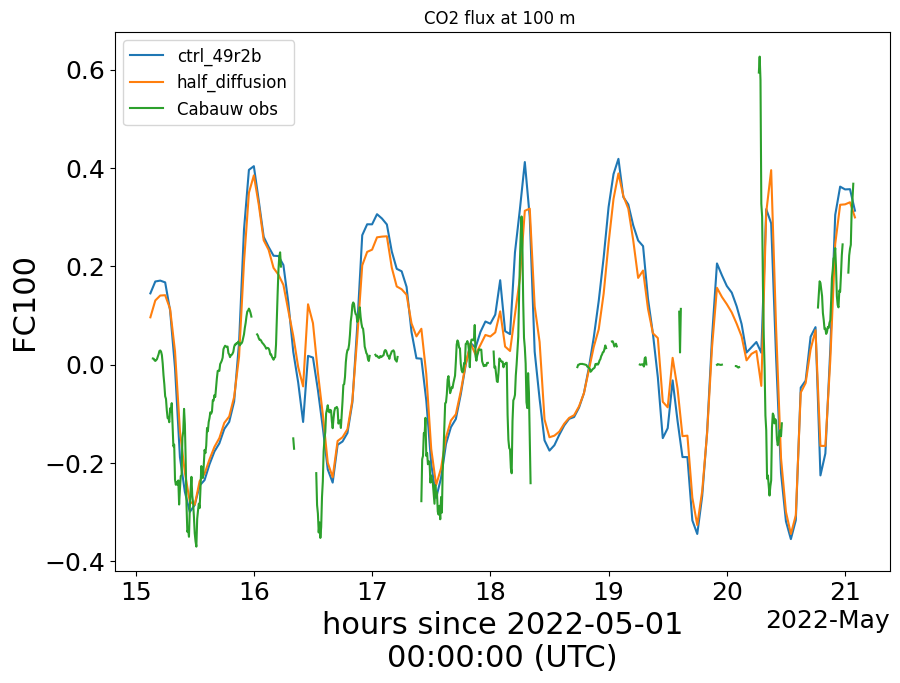

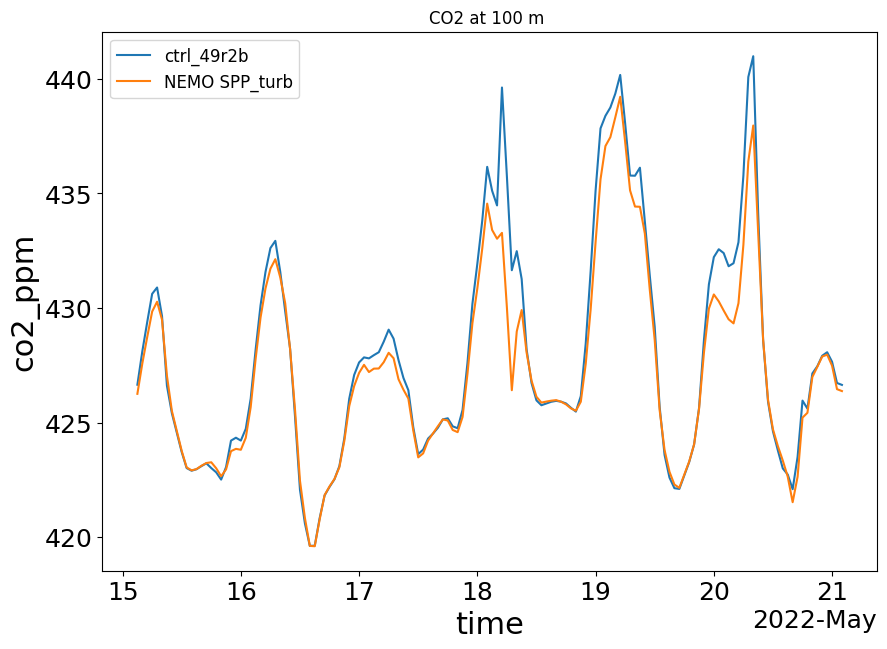

In [109]:
obs_flx_100 = mfun.concentration_to_ppm('co2',ds_cabauw['obs_tower_flx']['FC100']*10**-6)

plot_exps = ['ctrl_49r2b','half_diffusion']  # experiments to plot


plt.figure()
for exp in plot_exps:
     ds = IFS['cabauw']['z'][exp].sel(height=100, method='nearest')
     (-ds['co2flx_diff'] + ds['co2flx_conv']).plot(label=exp)
obs_flx_100.plot(label='Cabauw obs')
plt.title('CO2 flux at 100 m ')
plt.legend()

plot_exps = ['ctrl_49r2b']  # experiments to plot

plt.figure()
for exp in plot_exps:
     ds = IFS['cabauw']['z'][exp].sel(height=100, method='nearest')
     (ds['co2']).plot(label=exp)
IFS_nemo['cabauw']['z']['SPP_turb']['co2_ppm'].sel(number=0,height=100, method='nearest').plot(label='NEMO SPP_turb')
plt.title('CO2 at 100 m ')
plt.legend()

In [35]:
for height in cabauw_heights:
    co2 = ds_cabauw['Cabauw_CO2_May2022'][f'co2_{height}m'].sortby('time')

    # Compute differences and time steps (in hours)
    dco2 = co2.diff('time')
    dt_hours = co2['time'].diff('time') / np.timedelta64(1, 'h')

    # Mask out time steps longer than 1 hour
    valid = dt_hours <= 1.0
    dco2dt = xr.where(valid, dco2 / dt_hours, np.nan)

    # Assign midpoint time coordinates and attributes
    dco2dt = dco2dt.assign_coords(time=co2['time'][1:])
    dco2dt.name = f'dco2dt_{height}'
    dco2dt.attrs['units'] = 'ppm h⁻¹'

    ds_cabauw['Cabauw_CO2_May2022'][dco2dt.name] = dco2dt


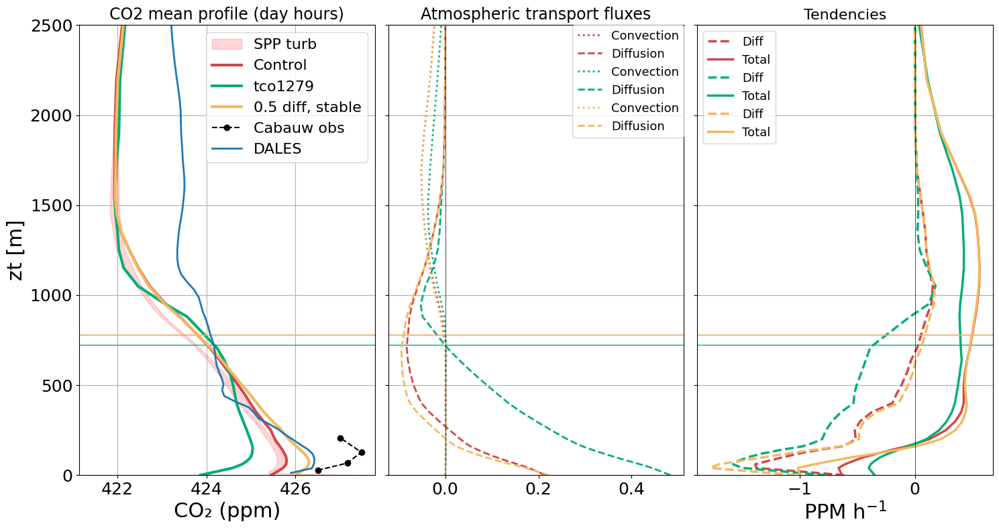

In [99]:
### Flux profiles and Budgets (domain or site) ###
var = 'co2'
# plot_exps = ['ctrl','ctrl_9km','TKE']  # experiments to plot
plot_exps = ['ctrl_49r2b','half_diff_stable','9km_49r2b']  # experiments to plot

# SPP (ensemble) shaded envelope (min/max over members)
plot_spp_exps = ['SPP_all']
plot_spp_exps = ['SPP_turb']

spp_var = 'co2_ppm'  # match the updated example cell

site_key = 'cabauw'   # e.g. 'slab' or 'cabauw'
plot_dales = True  # set False if not desired
time_selection = "day"   # options: "day", "night", "all"

if time_selection == "day":
    daytime = day_hours
elif time_selection == "night":
    daytime = night_hours

ylim = 2500

# --------------------------------------------
# If Cabauw, load and subset observations
# --------------------------------------------
if site_key == 'cabauw':
    obs_ds = ds_cabauw['Cabauw_CO2_May2022']
    obs_flx = mfun.concentration_to_ppm('co2',-ds_cabauw['obs_tower_flx'][['FC005','FC060','FC100','FC180']]*10**-6)

    
    # Filter obs time by day/night
    if time_selection == "day":
        obs_ds = obs_ds.sel(time=obs_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        obs_flx = obs_flx.sel(time=obs_flx['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        if plot_dales:
            ds_dales = dales_cabauw.sel(time=dales_cabauw['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        
    elif time_selection == "night":
        obs_ds = obs_ds.sel(time=~obs_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        obs_flx = obs_flx.sel(time=~obs_flx['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        if plot_dales:
            ds_dales = dales_cabauw.sel(time=~dales_cabauw['time'].dt.hour.isin(range(daytime[0], daytime[1])))

    obs_time = obs_ds['time']

# --------------------------------------------
# Prepare figure
# --------------------------------------------
fig, axes = plt.subplots(ncols=3, figsize=(15, 8), sharey=True)

spp_plotted = False

# --------------------------------------------
# Loop through experiments
# --------------------------------------------
for exp, exp_longname, label,color in exp_names:
    if exp not in plot_exps:
        continue

    # Load data for the chosen site
    ds = IFS[site_key]['z'][exp]
    ds_srf = IFS[site_key]['srf'][exp]

    # Apply day/night filter
    if time_selection == "day":
        ds = ds.sel(time=ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        ds_srf = ds_srf.sel(time=ds_srf['time'].dt.hour.isin(range(daytime[0], daytime[1])))
    elif time_selection == "night":
        ds = ds.sel(time=~ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        ds_srf = ds_srf.sel(time=~ds_srf['time'].dt.hour.isin(range(daytime[0], daytime[1])))

    # Restrict to common times with observations (Cabauw only)
    if site_key == 'cabauw' and plot_dales:
        common_times = np.intersect1d(
            np.intersect1d(ds['time'].values, obs_time.values),
            ds_dales['time'].values)
        ds = ds.sel(time=common_times)
        ds_srf = ds_srf.sel(time=common_times)
        ds_dales = ds_dales.sel(time=common_times)
    elif site_key == 'cabauw':
        common_times = np.intersect1d(ds['time'].values, obs_time.values)
        ds = ds.sel(time=common_times)
        ds_srf = ds_srf.sel(time=common_times)

    # --- Add SPP shaded envelope once (concentration subplot) ---
    if (not spp_plotted) and len(plot_spp_exps) > 0:
        spp_exp = plot_spp_exps[0]
        spp_ds = IFS_nemo.get(site_key, {}).get('z', {}).get(spp_exp, None)
        if spp_ds is not None and (spp_var in spp_ds):
            # Apply same day/night filter + common-times selection
            if time_selection == "day":
                spp_ds = spp_ds.sel(time=spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            elif time_selection == "night":
                spp_ds = spp_ds.sel(time=~spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            if site_key == 'cabauw':
                spp_ds = spp_ds.sel(time=common_times)
            # Compute time-mean profile for each member, then envelope over members
            spp_mean = spp_ds[spp_var].sel(height=slice(0, ylim)).mean('time')
            if 'number' in spp_mean.dims:
                spp_min = spp_mean.min('number')
                spp_max = spp_mean.max('number')
                spp_color = next((t[3] for t in nemo_exp_names if len(t) >= 4 and t[0] == spp_exp), 'grey')
                spp_label = next((t[2] for t in nemo_exp_names if len(t) >= 3 and t[0] == spp_exp), 'SPP')
                axes[0].fill_betweenx(
                    spp_min['height'].values,
                    spp_min.values,
                    spp_max.values,
                    color=spp_color,
                    alpha=0.16,
                    label=spp_label,
                )
                spp_plotted = True

######
    dales_time = dales_cabauw['time']
    # Find common times with obs_ds
    common_times_dales = np.intersect1d(obs_ds['time'].values, dales_time.values)
######

    # --- 1️⃣ Concentration profile ---
    ds[var].mean('time').plot(
        y='height', ax=axes[0], label=f'{label}', color=color, lw=3,
    )
    axes[0].axhline(ds_srf['blh'].mean('time'), color=color, lw=1,)

    # --- 2️⃣ Flux profiles ---
    axes[1].axhline(ds_srf['blh'].mean('time'), color=color, lw=1,)
    ds[f'{var}flx_conv'].mean('time').plot(
        y='height', ax=axes[1], label='Convection', color=color, linestyle=':', lw=2,
    )
    ds[f'{var}flx_diff'].mean('time').plot(
        y='height', ax=axes[1], label='Diffusion', color=color, linestyle='--', lw=2,
    )
    # ds[f'{var}flx_dyn'].mean('time').plot(
    #     y='height', ax=axes[1], label='Dynamics', color=color, linestyle=':', lw=3,
    # )

    # --- 3️⃣ Tendencies ---
    axes[2].axhline(ds_srf['blh'].mean('time'), color=color, lw=1,)
    # ds[f'd{var}dt_conv'].mean('time').plot(
    #     y='height', ax=axes[2], label='Conv', color=color, linestyle='--', lw=2.5,
    # )
    ds[f'd{var}dt_diff'].mean('time').plot(
        y='height', ax=axes[2], label='Diff', color=color, linestyle='--', lw=2.5,
    )
    (ds[f'd{var}dt_diff']+ds[f'd{var}dt_conv']+ds[f'd{var}dt_dyn']).mean('time').plot(
        y='height', ax=axes[2], label='Total', color=color, linestyle='-', lw=2.5,
    )
    # ds[f'd{var}dt_dyn'].mean('time').plot(
    #     y='height', ax=axes[2], label='Dyn', color=color, linestyle=':', lw=3,
    # )

# --------------------------------------------
# Plot observations (Cabauw only)
# --------------------------------------------
if site_key == 'cabauw':
    obs_mean = obs_ds.sel(time=common_times).mean('time')

    # --- Concentration (ppm) ---
    obs_conc = np.array([obs_mean[f'co2_{z}m'].values for z in cabauw_heights])
    axes[0].plot(obs_conc, cabauw_heights, 'ko--', label='Cabauw obs', zorder=5)

    # --- Tendencies (ppm h⁻¹), if available ---
    tend_vars = [f'dco2dt_{z}' for z in cabauw_heights if f'dco2dt_{z}' in obs_mean]
    if tend_vars:
        obs_tend = np.array([obs_mean[v].values for v in tend_vars])
        tend_heights = [int(v.split('_')[-1].replace('m', '')) for v in tend_vars]
        axes[2].plot(obs_tend, tend_heights, 'ko--', label='Cabauw obs', zorder=5)

    # axes[1].scatter(obs_flx['FC005'].sel(time=common_times).mean(dim='time').values, 5, color='k', zorder=5, s=50)
    # axes[1].scatter(obs_flx['FC060'].sel(time=common_times).mean(dim='time').values, 60, color='k', zorder=5, s=50)
    # axes[1].scatter(obs_flx['FC100'].sel(time=common_times).mean(dim='time').values, 100, color='k', zorder=5, s=50)
    # axes[1].scatter(obs_flx['FC180'].sel(time=common_times).mean(dim='time').values, 180, color='k', zorder=5, s=50)

# --------------------------------------------
# Optionally include DALES
# --------------------------------------------
if site_key == 'cabauw' and plot_dales:
    # Subset DALES to these times
    dales_ppm = ds_dales['sv004_ppm'].mean('time')
    # Plot DALES line in the concentration subplot
    dales_ppm.plot(ax=axes[0],y='zt', lw=2, label='DALES')

# --------------------------------------------
# Axis styling and titles
# --------------------------------------------
unit_tend = ds[f'd{var}dt_tot'].attrs.get("units", " ")
unit_flx  = ds[f'{var}flx_conv'].attrs.get("units", " ")

# Concentration
axes[0].set_ylim([0, ylim])
axes[0].set_xlabel('CO₂ (ppm)')
axes[0].legend(fontsize=16, loc='upper right')
axes[0].grid()
axes[0].set_title(f'{var.upper()} mean profile ({time_selection} hours)', fontsize=17)

# Fluxes
axes[1].axvline(0, c='k', lw=0.5)
axes[1].set_ylim([0, ylim])
axes[1].set_xlabel(unit_flx)
axes[1].grid(axis='y')
axes[1].set_ylabel('')
axes[1].set_title('Atmospheric transport fluxes', fontsize=17)
axes[1].legend(
    fontsize=13,
    loc='upper right',
    # bbox_to_anchor=(-0.25, 0.65),
    borderaxespad=0.0,
)

# Tendencies
axes[2].axvline(0, c='k', lw=0.5)
axes[2].set_ylim([0, ylim])
axes[2].set_xlabel(unit_tend)
axes[2].legend(fontsize=13)
axes[2].set_ylabel('')
axes[2].grid(axis='y')
axes[2].set_title('Tendencies', fontsize=16)

plt.tight_layout()
# plt.savefig(f'{dir_out}/co2_profiles_{site_key}_{time_selection}.png', dpi=300)
plt.show()



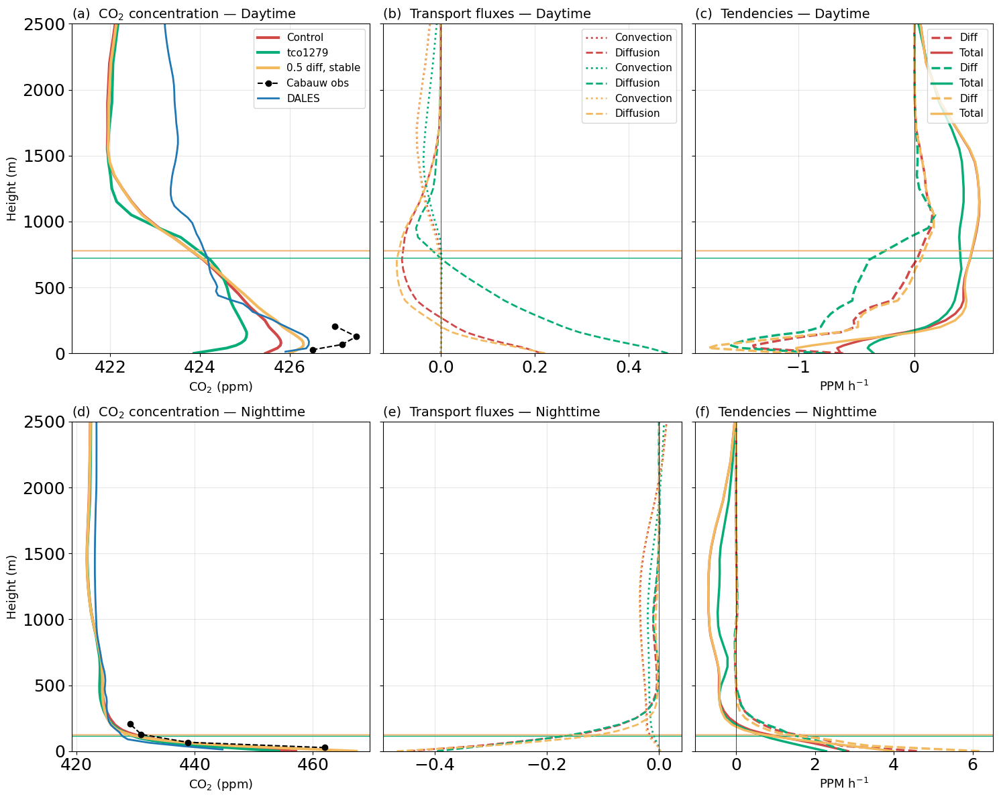

In [ ]:
### Flux profiles and Budgets — Day (top) & Night (bottom) ###
var = 'co2'
plot_exps = ['ctrl_49r2b','half_diff_stable','half_diff_unstable','9km_49r2b']

plot_spp_exps = []
spp_var = 'co2_ppm'

site_key = 'cabauw'
plot_dales = True
ylim = 2500

row_configs = [
    ("Daytime",  "day",   day_hours),
    ("Nighttime","night", night_hours),
]

panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

# --- 2x3 figure ---
fig, all_axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), sharey=True)

for irow, (row_title, time_selection, daytime) in enumerate(row_configs):
    axes = all_axes[irow]

    # --- Filter observations for this row ---
    if site_key == 'cabauw':
        obs_ds_row = ds_cabauw['Cabauw_CO2_May2022']
        obs_flx_row = mfun.concentration_to_ppm(
            'co2', -ds_cabauw['obs_tower_flx'][['FC005','FC060','FC100','FC180']] * 10**-6)

        if time_selection == "day":
            obs_ds_row  = obs_ds_row.sel(time=obs_ds_row['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            obs_flx_row = obs_flx_row.sel(time=obs_flx_row['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            if plot_dales:
                ds_dales_row = dales_cabauw.sel(time=dales_cabauw['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        elif time_selection == "night":
            obs_ds_row  = obs_ds_row.sel(time=~obs_ds_row['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            obs_flx_row = obs_flx_row.sel(time=~obs_flx_row['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            if plot_dales:
                ds_dales_row = dales_cabauw.sel(time=~dales_cabauw['time'].dt.hour.isin(range(daytime[0], daytime[1])))

        obs_time = obs_ds_row['time']

    spp_plotted = False

    # --- Loop through experiments ---
    for exp, exp_longname, label, color in exp_names:
        if exp not in plot_exps:
            continue

        ds = IFS[site_key]['z'][exp]
        ds_srf = IFS[site_key]['srf'][exp]

        if time_selection == "day":
            ds     = ds.sel(time=ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            ds_srf = ds_srf.sel(time=ds_srf['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        elif time_selection == "night":
            ds     = ds.sel(time=~ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
            ds_srf = ds_srf.sel(time=~ds_srf['time'].dt.hour.isin(range(daytime[0], daytime[1])))

        if site_key == 'cabauw' and plot_dales:
            common_times = np.intersect1d(
                np.intersect1d(ds['time'].values, obs_time.values),
                ds_dales_row['time'].values)
            ds     = ds.sel(time=common_times)
            ds_srf = ds_srf.sel(time=common_times)
            ds_dales_row = ds_dales_row.sel(time=common_times)
        elif site_key == 'cabauw':
            common_times = np.intersect1d(ds['time'].values, obs_time.values)
            ds     = ds.sel(time=common_times)
            ds_srf = ds_srf.sel(time=common_times)

        # SPP envelope
        if (not spp_plotted) and len(plot_spp_exps) > 0:
            spp_exp = plot_spp_exps[0]
            spp_ds = IFS_nemo.get(site_key, {}).get('z', {}).get(spp_exp, None)
            if spp_ds is not None and (spp_var in spp_ds):
                if time_selection == "day":
                    spp_ds = spp_ds.sel(time=spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
                elif time_selection == "night":
                    spp_ds = spp_ds.sel(time=~spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
                if site_key == 'cabauw':
                    spp_ds = spp_ds.sel(time=common_times)
                spp_mean = spp_ds[spp_var].sel(height=slice(0, ylim)).mean('time')
                if 'number' in spp_mean.dims:
                    spp_min = spp_mean.min('number')
                    spp_max = spp_mean.max('number')
                    spp_color = next((t[3] for t in nemo_exp_names if len(t) >= 4 and t[0] == spp_exp), 'grey')
                    spp_label = next((t[2] for t in nemo_exp_names if len(t) >= 3 and t[0] == spp_exp), 'SPP')
                    axes[0].fill_betweenx(
                        spp_min['height'].values, spp_min.values, spp_max.values,
                        color=spp_color, alpha=0.16, label=spp_label)
                    spp_plotted = True

        # Concentration profile
        ds[var].mean('time').plot(
            y='height', ax=axes[0], label=f'{label}', color=color, lw=3)
        axes[0].axhline(ds_srf['blh'].mean('time'), color=color, lw=1)

        # Flux profiles
        axes[1].axhline(ds_srf['blh'].mean('time'), color=color, lw=1)
        ds[f'{var}flx_conv'].mean('time').plot(
            y='height', ax=axes[1], label='Convection', color=color, linestyle=':', lw=2)
        ds[f'{var}flx_diff'].mean('time').plot(
            y='height', ax=axes[1], label='Diffusion', color=color, linestyle='--', lw=2)

        # Tendencies
        axes[2].axhline(ds_srf['blh'].mean('time'), color=color, lw=1)
        ds[f'd{var}dt_diff'].mean('time').plot(
            y='height', ax=axes[2], label='Diff', color=color, linestyle='--', lw=2.5)
        (ds[f'd{var}dt_diff'] + ds[f'd{var}dt_conv'] + ds[f'd{var}dt_dyn']).mean('time').plot(
            y='height', ax=axes[2], label='Total', color=color, linestyle='-', lw=2.5)

    # --- Observations ---
    if site_key == 'cabauw':
        obs_mean = obs_ds_row.sel(time=common_times).mean('time')
        obs_conc = np.array([obs_mean[f'co2_{z}m'].values for z in cabauw_heights])
        axes[0].plot(obs_conc, cabauw_heights, 'ko--', label='Cabauw obs', zorder=5)

        tend_vars = [f'dco2dt_{z}' for z in cabauw_heights if f'dco2dt_{z}' in obs_mean]
        if tend_vars:
            obs_tend = np.array([obs_mean[v].values for v in tend_vars])
            tend_heights = [int(v.split('_')[-1].replace('m', '')) for v in tend_vars]
            axes[2].plot(obs_tend, tend_heights, 'ko--', label='Cabauw obs', zorder=5)

    # --- DALES ---
    if site_key == 'cabauw' and plot_dales:
        dales_ppm = ds_dales_row['sv004_ppm'].mean('time')
        dales_ppm.plot(ax=axes[0], y='zt', lw=2, label='DALES')

    # --- Axis styling ---
    unit_tend = ds[f'd{var}dt_tot'].attrs.get("units", " ")
    unit_flx  = ds[f'{var}flx_conv'].attrs.get("units", " ")

    axes[0].set_ylim([0, ylim])
    axes[0].set_xlabel('CO$_2$ (ppm)', fontsize=13)
    axes[0].grid(True, alpha=0.3)
    axes[0].set_title(
        f'{panel_labels[irow*3]}  CO$_2$ concentration \u2014 {row_title}',
        fontsize=14, loc='left')
    axes[0].set_ylabel('Height (m)', fontsize=13)

    axes[1].axvline(0, c='k', lw=0.5)
    axes[1].set_ylim([0, ylim])
    axes[1].set_xlabel(unit_flx, fontsize=13)
    axes[1].grid(True, alpha=0.3)
    axes[1].set_ylabel('')
    axes[1].set_title(
        f'{panel_labels[irow*3+1]}  Transport fluxes \u2014 {row_title}',
        fontsize=14, loc='left')

    axes[2].axvline(0, c='k', lw=0.5)
    axes[2].set_ylim([0, ylim])
    axes[2].set_xlabel(unit_tend, fontsize=13)
    axes[2].set_ylabel('')
    axes[2].grid(True, alpha=0.3)
    axes[2].set_title(
        f'{panel_labels[irow*3+2]}  Tendencies \u2014 {row_title}',
        fontsize=14, loc='left')

    # Legend only on top row
    if irow == 0:
        axes[0].legend(fontsize=11, loc='upper right')
        axes[1].legend(fontsize=11, loc='upper right')
        axes[2].legend(fontsize=11, loc='upper right')

plt.tight_layout()
fig.savefig(f'{dir_out}/co2_profiles_{site_key}_day_night.png', dpi=300)
plt.show()


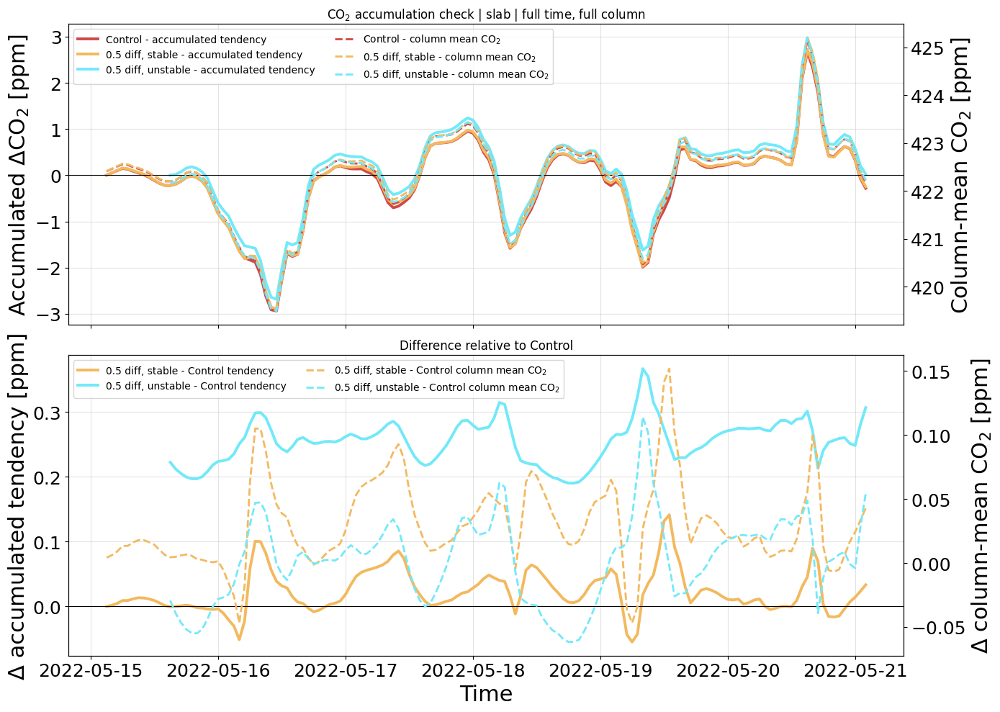

In [135]:
## plot accumulated tendencies to check that the co2 is not lost but just redistributed.

var = 'co2'
site_key = 'slab'
plot_exps = ['ctrl_49r2b','half_diff_stable','half_diff_unstable']  # experiments to plot


def vertical_mean(da, height_name='height', zmax=None):
    da_sel = da if zmax is None else da.sel({height_name: slice(0, zmax)})
    z = da_sel[height_name]
    depth = float(z.max() - z.min())
    if depth == 0:
        return da_sel.isel({height_name: 0})
    return da_sel.integrate(height_name) / depth

def accumulate_tendency(da):
    da = da.sortby('time')
    if da.sizes.get('time', 0) < 2:
        return da * 0

    dt_hours = xr.DataArray(
        da['time'].diff('time') / np.timedelta64(1, 'h'),
        coords={'time': da['time'][1:]},
        dims='time',
    )
    valid = dt_hours <= 1.5
    increments = xr.where(valid, da.isel(time=slice(1, None)) * dt_hours, 0.0)
    cumulative = xr.concat([da.isel(time=0) * 0.0, increments.cumsum('time')], dim='time')
    cumulative = cumulative.assign_coords(time=da['time'])
    return cumulative

process_specs = [
    'dco2dt_diff',
    'dco2dt_conv',
    'dco2dt_dyn',
]

def get_exp_style(exp):
    exp_label = exp
    exp_color = 'tab:blue'
    for exp_name, exp_longname, label, color in exp_names:
        if exp_name == exp:
            exp_label = label
            exp_color = color
            break
    return exp_label, exp_color

def get_column_series(exp):
    ds_exp = IFS[site_key]['z'][exp].sortby('time')
    co2_column = vertical_mean(ds_exp[var])

    component_sum = None
    for tend_name in process_specs:
        if tend_name not in ds_exp:
            continue
        column_tendency = vertical_mean(ds_exp[tend_name])
        if component_sum is None:
            component_sum = column_tendency.copy()
        else:
            component_sum = component_sum + column_tendency

    if component_sum is None:
        return None, None

    accumulated_total = accumulate_tendency(component_sum)
    return accumulated_total, co2_column

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10), sharex=True)
ax_top = axes[0]
ax_bot = axes[1]
ax_top2 = ax_top.twinx()
ax_bot2 = ax_bot.twinx()

exp_series = {}
for exp in plot_exps:
    accumulated_total, co2_column = get_column_series(exp)
    if accumulated_total is None:
        continue
    exp_series[exp] = {
        'accumulated': accumulated_total,
        'co2_column': co2_column,
    }

for exp in plot_exps:
    if exp not in exp_series:
        continue

    exp_label, exp_color = get_exp_style(exp)
    accumulated_total = exp_series[exp]['accumulated']
    co2_column = exp_series[exp]['co2_column']

    ax_top.plot(
        accumulated_total['time'],
        accumulated_total,
        color=exp_color,
        lw=2.8,
        linestyle='-',
        label=f'{exp_label} - accumulated tendency',
    )
    ax_top2.plot(
        co2_column['time'],
        co2_column,
        color=exp_color,
        lw=2.0,
        linestyle='--',
        label=f'{exp_label} - column mean CO$_2$',
    )

baseline_exp = None
if plot_exps:
    if plot_exps[0] in exp_series:
        baseline_exp = plot_exps[0]

if baseline_exp is not None:
    baseline_acc = exp_series[baseline_exp]['accumulated']
    baseline_co2 = exp_series[baseline_exp]['co2_column']
    baseline_label, _ = get_exp_style(baseline_exp)

    for exp in plot_exps[1:]:
        if exp not in exp_series:
            continue

        exp_label, exp_color = get_exp_style(exp)
        exp_acc = exp_series[exp]['accumulated']
        exp_co2 = exp_series[exp]['co2_column']

        common_time_acc = np.intersect1d(exp_acc['time'].values, baseline_acc['time'].values)
        common_time_co2 = np.intersect1d(exp_co2['time'].values, baseline_co2['time'].values)

        if len(common_time_acc) > 0:
            acc_diff = exp_acc.sel(time=common_time_acc) - baseline_acc.sel(time=common_time_acc)
            ax_bot.plot(
                acc_diff['time'],
                acc_diff,
                color=exp_color,
                lw=2.8,
                linestyle='-',
                label=f'{exp_label} - {baseline_label} tendency',
            )

        if len(common_time_co2) > 0:
            co2_diff = exp_co2.sel(time=common_time_co2) - baseline_co2.sel(time=common_time_co2)
            ax_bot2.plot(
                co2_diff['time'],
                co2_diff,
                color=exp_color,
                lw=2.0,
                linestyle='--',
                label=f'{exp_label} - {baseline_label} column mean CO$_2$',
            )

ax_top.axhline(0, color='k', lw=0.8)
ax_top.grid(True, alpha=0.35)
ax_top.set_ylabel('Accumulated ΔCO$_2$ [ppm]')
ax_top.set_title(f'CO$_2$ accumulation check | {site_key} | full time, full column')
ax_top2.set_ylabel('Column-mean CO$_2$ [ppm]')

ax_bot.axhline(0, color='k', lw=0.8)
ax_bot.grid(True, alpha=0.35)
ax_bot.set_ylabel('Δ accumulated tendency [ppm]')
ax_bot.set_xlabel('Time')
if baseline_exp is not None:
    baseline_label, _ = get_exp_style(baseline_exp)
    ax_bot.set_title(f'Difference relative to {baseline_label}')
else:
    ax_bot.set_title('Difference relative to first experiment')
ax_bot2.set_ylabel('Δ column-mean CO$_2$ [ppm]')

handles_top_1, labels_top_1 = ax_top.get_legend_handles_labels()
handles_top_2, labels_top_2 = ax_top2.get_legend_handles_labels()
ax_top.legend(handles_top_1 + handles_top_2, labels_top_1 + labels_top_2, fontsize=10, ncol=2, loc='best')

handles_bot_1, labels_bot_1 = ax_bot.get_legend_handles_labels()
handles_bot_2, labels_bot_2 = ax_bot2.get_legend_handles_labels()
ax_bot.legend(handles_bot_1 + handles_bot_2, labels_bot_1 + labels_bot_2, fontsize=10, ncol=2, loc='best')

plt.tight_layout()
plt.show()

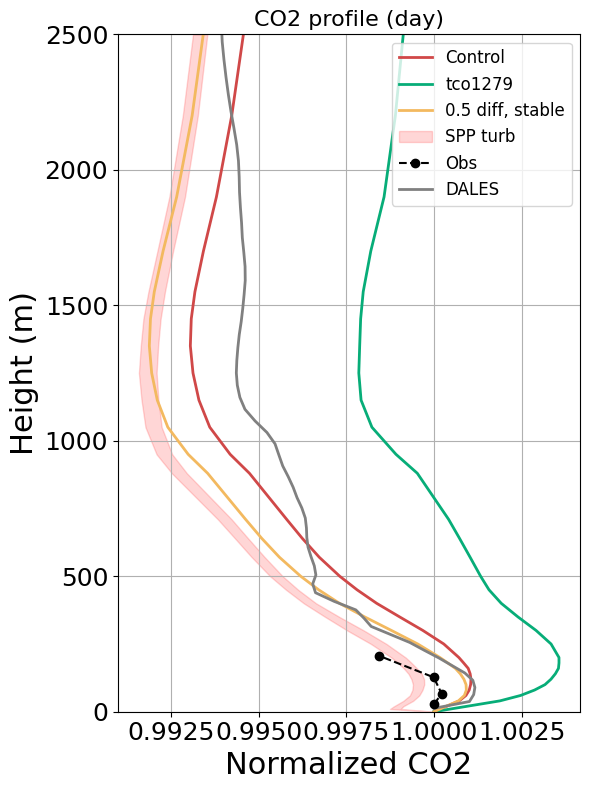

In [ ]:
# this plot shows the mean vertical profile of CO2 and its fluxes/tendencies, averaged over a chosen time period (day/night/all) and compared to Cabauw observations and DALES if available. You can customize the experiments to plot, the time selection, and whether to include DALES.
# ------------------------------
# Settings
# ------------------------------
var = 'co2'
# plot_exps = ['ctrl', 'ctrl_9km', 'TKE','dryMF','ctrl_49r2b']  # experiments to plot
# plot_exps = ['half_diff_stable','ctrl_49r2b']
plot_exps = ['ctrl_49r2b','9km_49r2b','half_diff_stable']

# SPP (ensemble) shaded envelope (min/max over members)
plot_spp_exps = ['SPP_turb']
spp_var = 'co2_ppm'

site_key = 'cabauw'
plot_dales = True
time_selection = "day"  # options: "day", "night", "all"

# Daytime/Nighttime hours
if time_selection == "day":
    daytime = day_hours
elif time_selection == "night":
    daytime = night_hours

cabauw_heights = np.array([27, 67, 127, 207])
ylim = 2500

# Colours

# ------------------------------
# Load observations
# ------------------------------
if site_key == 'cabauw':
    obs_ds = ds_cabauw['Cabauw_CO2_May2022']

    # Filter day/night
    if time_selection == "day":
        obs_ds = obs_ds.sel(time=obs_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
    elif time_selection == "night":
        obs_ds = obs_ds.sel(time=~obs_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))

    obs_time = obs_ds['time'].values

# ------------------------------
# Prepare figure
# ------------------------------
fig, ax = plt.subplots(figsize=(6, 8))

# ------------------------------
# Plot experiments
# ------------------------------
for exp,_,label,color in exp_names:
    if exp not in plot_exps:
        continue
    ds = IFS[site_key]['z'][exp]
    
    # Filter day/night
    if time_selection == "day":
        ds = ds.sel(time=ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
    elif time_selection == "night":
        ds = ds.sel(time=~ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))

    # Restrict to common times with observations
    if site_key == 'cabauw':
        common_times = np.intersect1d(ds['time'].values, obs_time)
        ds = ds.sel(time=common_times)

    # Compute mean profile
    mean_profile = ds[var].mean('time').values

    # Normalize by surface (lowest height)
    normalized_profile = mean_profile / mean_profile[0]

    # Plot
    ax.plot(normalized_profile, ds['height'].values, label=f'{label}', color=color, lw=2)

# ------------------------------
# SPP shaded envelope
# ------------------------------
if len(plot_spp_exps) > 0:
    spp_exp = plot_spp_exps[0]
    spp_ds = IFS_nemo.get(site_key, {}).get('z', {}).get(spp_exp, None)
    if spp_ds is not None and (spp_var in spp_ds):
        # Apply same day/night filter
        if time_selection == "day":
            spp_ds = spp_ds.sel(time=spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        elif time_selection == "night":
            spp_ds = spp_ds.sel(time=~spp_ds['time'].dt.hour.isin(range(daytime[0], daytime[1])))
        # Restrict to common times with observations
        if site_key == 'cabauw':
            spp_common = np.intersect1d(spp_ds['time'].values, obs_time)
            spp_ds = spp_ds.sel(time=spp_common)
        # Compute time-mean profile per member, then normalize by surface value
        spp_mean = spp_ds[spp_var].sel(height=slice(0, ylim)).mean('time')
        if 'number' in spp_mean.dims:
            spp_norm = spp_mean / spp_mean.isel(height=0)
            spp_min = spp_norm.min('number')
            spp_max = spp_norm.max('number')
            spp_color = next((t[3] for t in nemo_exp_names if len(t) >= 4 and t[0] == spp_exp), 'grey')
            spp_label = next((t[2] for t in nemo_exp_names if len(t) >= 3 and t[0] == spp_exp), 'SPP')
            ax.fill_betweenx(
                spp_min['height'].values,
                spp_min.values,
                spp_max.values,
                color=spp_color,
                alpha=0.16,
                label=spp_label,
            )

# ------------------------------
# Plot observations
# ------------------------------
if site_key == 'cabauw':
    # Take common times with IFS
    obs_common_times = np.intersect1d(obs_ds['time'].values, common_times)
    obs_mean = np.array([obs_ds[f'co2_{z}m'].sel(time=obs_common_times).mean('time').values for z in cabauw_heights])
    obs_norm = obs_mean / obs_mean[0]
    ax.plot(obs_norm, cabauw_heights, 'ko--', label='Obs', zorder=5)

# ------------------------------
# Optionally include DALES
# ------------------------------
if site_key == 'cabauw' and plot_dales:
    ds_dales_sel = dales_cabauw
    if time_selection == "day":
        ds_dales_sel = ds_dales_sel.sel(time=ds_dales_sel['time'].dt.hour.isin(range(daytime[0], daytime[1])))
    elif time_selection == "night":
        ds_dales_sel = ds_dales_sel.sel(time=~ds_dales_sel['time'].dt.hour.isin(range(daytime[0], daytime[1])))
    
    # Take common times with obs
    common_times_dales = np.intersect1d(obs_ds['time'].values, ds_dales_sel['time'].values)
    ds_dales_sel = ds_dales_sel.sel(time=common_times_dales)
    
    dales_profile = ds_dales_sel['sv004_ppm'].mean('time').values
    dales_norm = dales_profile / dales_profile[0]
    ax.plot(dales_norm, ds_dales_sel['zt'].values, lw=2, label='DALES', color='gray')

# ------------------------------
# Styling
# ------------------------------
ax.set_xlabel(f'Normalized {var.upper()}')
ax.set_ylabel('Height (m)')
ax.set_ylim([0, ylim])
ax.grid(True)
ax.legend(fontsize=12)
ax.set_title(f'{var.upper()} profile ({time_selection})', fontsize=16)

plt.tight_layout()
plt.show()


converting kg m**-2 s**-1 to PPM m/s for variable fco2nee, assumption on (surface?) density, careful!
converting kg m**-2 s**-1 to PPM m/s for variable fco2nee, assumption on (surface?) density, careful!


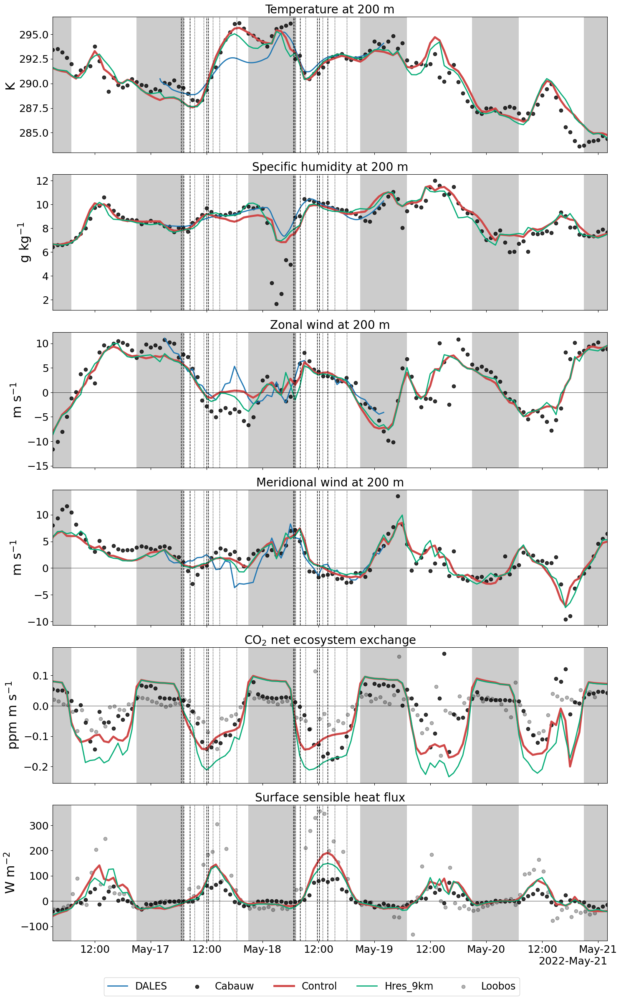

In [246]:
#####  Evolution of Standard variables at 100m at Cabauw  #####
################################################################

# add latent heat flux for an idea of surface stability 
# add shaded areas for nighttime 
# add a thick vertical line for times with flight legs (if desired)

######################################################
def nee_in_ppm(exp, var='fco2nee'):
    old_units = IFS['']['srf'][exp]['fco2nee'].attrs['units']

    # lnsp is logarithm of surface pressure, so exp(lnsp) gives surface pressure in Pa. To convert to hPa, divide by 100.
    p_surf = np.exp(IFS['cabauw']['z'][exp]['lnsp'])

    if 'kg m**-2 s**-1' in old_units:
        print(f"converting {old_units} to PPM m/s for variable {var}, assumption on (surface?) density, careful!")
        # rho = mfun.calc_rho(p_surf,ds['t'],ds['q']/1000)#kg/m3
        rho=1.245#kg/m3
        # print(f"rho near the surface: {rho.sel(height=0,method='nearest').isel(time=1).values}")
        IFS['cabauw']['srf'][exp][f'{var}_ppm'] = mfun.concentration_to_ppm('co2', IFS['cabauw']['srf'][exp][var]/rho)
        IFS['cabauw']['srf'][exp][f'{var}_ppm'].attrs['units'] = old_units.replace('kg m**-2$', 'PPM m/s')
    return IFS['cabauw']['srf'][exp][f'{var}_ppm']
######################################################

# plot_exps = [ '9km_49r2b','ctrl_49r2b','half_diff_stable']  # experiments to plot
plot_exps = ['ctrl_49r2b','9km_49r2b']  # experiments to plot

for exp in plot_exps:
    IFS['cabauw']['srf'][exp]['fco2nee_ppm']=nee_in_ppm(exp, var='fco2nee')



location = 'cabauw'
add_loobos = True
sel_z = 200 #m
# Include 'NEE' as the last variable
vars = ['T', 'q', 'u', 'v', 'co2', 'fco2nee']
vars = ['T', 'q', 'u', 'v', 'fco2nee', 'H']
fig, axes = plt.subplots(len(vars), 1, figsize=(15, 4 * len(vars)), sharex=True)

if len(vars) == 1:
    axes = [axes]

# Generate midnight ticks between t0 and t1
midnights = []
dt = t0.replace(hour=0, minute=0, second=0, microsecond=0)
while dt <= t1 + timedelta(hours=26):
    midnights.append(dt)
    dt += timedelta(days=1)


## plot DALES
# dales_ta_cabauw['ta'].sel(zt=sel_z,method='nearest').plot( ax=axes[0], label='DALES',lw=2)
(dales_prof['thl']).sel(zt=sel_z,method='nearest').plot( ax=axes[0], label='DALES',lw=2)
# (1000*dales_qt_cabauw['qt']).sel(zt=sel_z,method='nearest').plot( ax=axes[1], label='DALES',lw=2)
(1000*dales_prof['qt']).sel(zt=sel_z,method='nearest').plot( ax=axes[1], label='DALES',lw=2)
dales_cabauw['u'].sel(zt=sel_z,method='nearest').plot( ax=axes[2], label='DALES',lw=2)
dales_cabauw['v'].sel(zt=sel_z,method='nearest').plot( ax=axes[3], label='DALES',lw=2)
# dales_cabauw['sv004_ppm'].sel(zt=sel_z,method='nearest').plot( ax=axes[4], label='DALES',lw=2)
# dales_cabauw['sv004'].sel(zt=sel_z,method='nearest').plot( ax=axes[4], label='DALES')


def format_units(u):
    """Convert CF-style units to matplotlib LaTeX superscripts, e.g. m s**-1 -> m s$^{-1}$."""
    import re
    u = re.sub(r'(\w+)\*\*(-?\d+)', lambda m: m.group(1) + '$^{' + m.group(2) + '}$', u)
    return u

# Friendly display names for variable titles
_display_names = {
    'T': 'Temperature',
    'q': 'Specific humidity',
    'u': 'Zonal wind',
    'v': 'Meridional wind',
}

# Loop over all variables
for i, (ax, var) in enumerate(zip(axes, vars)):

    if var in ['fco2nee','fco2rec','fco2gpp']:
        ## plot observations
        if location == 'cabauw':
            # need to fix the units
            srf_flx_cabauw = mfun.concentration_to_ppm('co2', ds_cabauw['obs_surf_flx']['FC']/1000)
            ax.scatter(ds_cabauw['obs_surf_flx']['time'],srf_flx_cabauw/3600,
                    c='k',label=f'Cabauw',alpha=0.8)
        if add_loobos:
            srf_flx_loobos = mfun.concentration_to_ppm('co2', ds_loobos['Fluxes']['co2_flux']/1000).resample(time='1h').mean()
            ax.scatter(ds_loobos['Fluxes']['time'].resample(time='1h').mean(),srf_flx_loobos/3600,
                    c='k',label=f'Loobos',alpha=0.3)

        
        ## plot IFS
        # Surface dataset
        first_exp = plot_exps[0]
        units = 'ppm m s$^{-1}$'
        var_long = getattr(IFS['slab']['srf'][first_exp][var], 'long_name', var)
        var_long = "CO$_2$ net ecosystem exchange"

        for ide, (exp, _, label,color) in enumerate(exp_names):
            if exp not in plot_exps:
                continue
            if exp == 'ctrl_49r2b':
                lw =3.5
            else:              
                lw=2
            slab = -IFS[location]['srf'][exp][f"{var}_ppm"]
            slab.plot(x='time', ax=ax, label=label if i == 0 else None, c=color,lw=lw)

    elif var == 'H':
        ## plot observations
        if location == 'cabauw':
            ax.scatter(ds_cabauw['obs_surf_flx']['time'], ds_cabauw['obs_surf_flx']['H'],
                       c='k', label='Cabauw', alpha=0.8)
        if add_loobos:
            ax.scatter(ds_loobos['Fluxes']['time'].resample(time='1h').mean(), ds_loobos['Fluxes']['H'].resample(time='1h').mean(),
                       c='k', label='Loobos', alpha=0.3)

        ## plot IFS
        # Surface dataset (sshf: accumulated J/m2 per hour -> divide by 3600 for W/m2; sign flip for upward positive)
        units = 'W m$^{-2}$'
        var_long = 'Surface sensible heat flux'

        for ide, (exp, _, label, color) in enumerate(exp_names):
            if exp not in plot_exps:
                continue
            if exp == 'ctrl_49r2b':
                lw = 3.5
            else:
                lw = 2
            slab = -IFS[location]['srf'][exp]['sshf'] / 3600
            slab.plot(x='time', ax=ax, label=label if i == 0 else None, c=color, lw=lw)

    else:
        ## plot observations
        if location == 'cabauw':
            if var == 'co2':
                # Available Cabauw measurement heights
                heights = np.array([27, 67, 127, 207])
                # Find the height closest to sel_z
                closest_height = heights[np.abs(heights - sel_z).argmin()]
                # Dynamically select the correct variable name
                co2_var = f'co2_{closest_height}m'
                ax.scatter(ds_cabauw['Cabauw_CO2_May2022']['time'],ds_cabauw['Cabauw_CO2_May2022'][co2_var],
                           c='k',label=f'Cabauw',alpha=0.8)
            elif var == 't' or var =='T':
                closest_height = ds_cabauw['obs_tower_meteo'].sel(z=sel_z,method='nearest')['z'].values
                ax.scatter(ds_cabauw['obs_tower_meteo']['time'],ds_cabauw['obs_tower_meteo'].sel(z=closest_height)['TA'],
                           c='k',label=f'Cabauw',alpha=0.8)
            elif var == 'q':
                closest_height = ds_cabauw['obs_tower_meteo'].sel(z=sel_z,method='nearest')['z'].values
                ax.scatter(ds_cabauw['obs_tower_meteo']['time'],ds_cabauw['obs_tower_meteo'].sel(z=closest_height)['Q'],
                           c='k',label=f'Cabauw',alpha=0.8)
            elif var in ['u','v']:
                closest_height = ds_cabauw['obs_tower_meteo'].sel(z=sel_z,method='nearest')['z'].values
                ax.scatter(ds_cabauw['obs_tower_meteo']['time'],ds_cabauw['obs_tower_meteo'].sel(z=closest_height)[var],
                           c='k',
                        #    label=f'Cabauw ({closest_height}m)',
                           alpha=0.8)




        # else:  
        #     if var == 't':
        #         (ds_loobos['Meteorology']['TA_1_1_1']+273.15).plot(x='time', ax=ax, label='Obs', c='k',ls='--')
        #     elif var == 'u':
        #         (ds_loobos['Meteorology']['WS_2_1_1']).plot(x='time', ax=ax, label='Obs', c='k',ls='--')


        ## plot IFS
        # 3D (height-dependent) dataset
        first_exp = plot_exps[0]
        units = getattr(IFS['']['z'][first_exp][var], 'units', '')
        var_long = _display_names.get(var, getattr(IFS[location]['z'][first_exp][var], 'long_name', var)) + f" at {sel_z} m"

        for exp, _, label,color in exp_names:
            if exp not in plot_exps:
                continue
            if exp == 'ctrl_49r2b':
                lw =3.5
            else:              
                lw=2
            slab = IFS[location]['z'][exp][var].sel(height=sel_z, method='nearest')
            slab.plot(x='time', ax=ax, label=label if i == 0 else None, c=color,lw=lw)

    if var in ['u', 'v', 'fco2nee', 'H']:
        ax.axhline(0, color='black', linewidth=0.5)



    # Add nighttime shading (00:00–night_hours[0] and night_hours[1]–24:00)
    for dt in midnights:
        ax.axvspan(dt, dt + timedelta(hours=night_hours[0]),
                   color='grey', alpha=0.4, zorder=0, linewidth=0)
        ax.axvspan(dt + timedelta(hours=night_hours[1]), dt + timedelta(hours=24),
                   color='grey', alpha=0.4, zorder=0, linewidth=0)

    ax.set_xlim(t0 + timedelta(hours=24), t1 )
    ax.set_xlabel('')
    ax.set_ylabel(format_units(units))
    # ax.set_title(f"{var_long} at {location}", fontsize=20)
    ax.set_title(f"{var_long}", fontsize=20)

    for leg_key in midd_times:
        ax.axvline(midd_times[leg_key],c='k',ls='--',lw=1)
    for radio_time in loobos_radio['time'].values:
        ax.axvline(radio_time,c='k',ls=':',lw=1)



# Collect unique legend handles/labels from all axes and place a single shared legend
_handles, _labels = [], []
for ax in axes:
    for h, l in zip(*ax.get_legend_handles_labels()):
        if l not in _labels:
            _handles.append(h)
            _labels.append(l)
fig.legend(_handles, _labels, loc='lower center', bbox_to_anchor=(0.5, 0.0),
           ncol=min(len(_labels), 5), fontsize=17, frameon=True)

plt.tight_layout()
plt.subplots_adjust(bottom=0.06)
plt.savefig(os.path.join(dir_out, f"ctrl_timeseries_{location}_z{sel_z}m.png"), dpi=300, bbox_inches='tight')

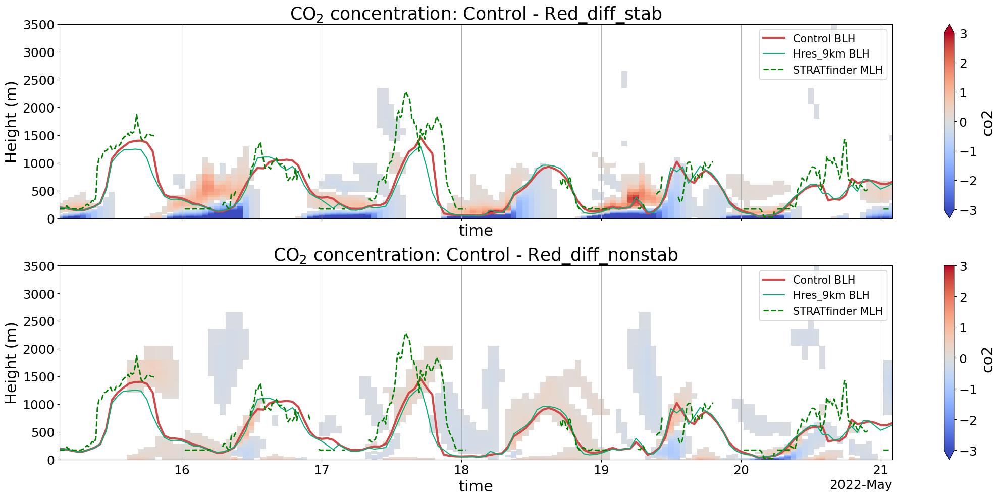

In [290]:
##############################################
#####   Difference between experiments  #####
##############################################
import matplotlib.colors as mcolors

# Experiments to compare
exp1 = 'ctrl_49r2b'
exp2 = ['half_diff_stable', 'half_diff_unstable',]

location ='cabauw'
add_loobos = False

# Variables to plot: (variable_name, plot title)
vars_to_plot = [
    # ('dco2dt_dyn',  'CO2 tendency from dynamics'),
    # ('dco2dt_conv', 'CO2 tendency from convection'),
    # ('dco2dt_diff', 'CO2 tendency from diffusion'),
    ('co2', r'CO$_2$ concentration'),
    # ('clwc', 'cloud liquid water'),
    # ('T', 'Temperature'),
]

# Colormap limits (set to None for automatic scaling)
vmin = -3
vmax = +3

n_rows = len(exp2) * len(vars_to_plot)

# Create a figure with rows equal to number of exp2 members * number of variables
fig, axes = plt.subplots(nrows=n_rows, ncols=1, figsize=(22, n_rows*4+2), sharex=True)

# Make sure axes is always iterable
if n_rows == 1:
    axes = [axes]

ax_idx = 0
# Loop through each exp2 experiment and each variable
for exp2_exp in exp2:
    for var, title in vars_to_plot:
        ax = axes[ax_idx]
        ax_idx += 1

        # Calculate difference between experiments
        data_diff = IFS[location]['z'][exp1][var] - IFS[location]['z'][exp2_exp][var]

        masked = data_diff.where(np.abs(data_diff) >= 0.1)
        cmap = plt.get_cmap("coolwarm").copy()
        cmap.set_bad("white")

        # Norm centred exactly at 0 → 0 is always white
        norm_colors = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax)

        # Plot the difference
        masked.plot(
            ax=ax,
            y='height',
            cmap=cmap,
            norm=norm_colors,
        )

        # Add boundary layer height lines for both experiments
        for blh_exp in [exp1,'9km_49r2b']:
            if blh_exp =='ctrl_49r2b':
                lw =3
            else: lw=1.5
            blh_color = next((t[3] for t in exp_names if t[0] == blh_exp), 'k')
            blh_label = next((t[2] for t in exp_names if t[0] == blh_exp), blh_exp)
            IFS[location]['srf'][blh_exp]['blh'].plot(ax=ax, x='time', c=blh_color, lw=lw, label=f'{blh_label} BLH')

        if location == 'cabauw':
            blh_cabauw['MLH'].sel(station_name='CABAUW,NETHERLANDS            ').plot(ax=ax, c='g', ls='--', lw=2, label='STRATfinder MLH')

        if add_loobos:
            ds_loobos['BLH']['BLH_radio'].plot.scatter(ax=ax, c='k', alpha=0.3, label='Radiosondes', s=100, marker='d')
            ds_loobos['BLH']['BLH_plane'].plot.scatter(ax=ax, c='k',alpha=0.3, label='Plane', s=100, marker='o')

        # Formatting
        ax.set_ylim(0, 3500)
        ax.set_xlim(
            datetime.datetime.strptime(str_time, "%Y-%m-%dT%H:%M"),
            datetime.datetime.strptime(end_time, "%Y-%m-%dT%H:%M")
        )
        ax.set_ylabel('Height (m)')
        exp1_label = next((t[2] for t in exp_names if t[0] == exp1), exp1)
        exp2_label = next((t[2] for t in exp_names if t[0] == exp2_exp), exp2_exp)
        ax.set_title(f'{title}: {exp1_label} - {exp2_label}', fontsize=25)
        ax.legend(fontsize=15)
        ax.grid(axis='x')

# Adjust layout for readability
plt.tight_layout()
plt.savefig(os.path.join(dir_out, f"diff_{exp1}_vs_{'_'.join(exp2)}.png"), dpi=300, bbox_inches='tight')


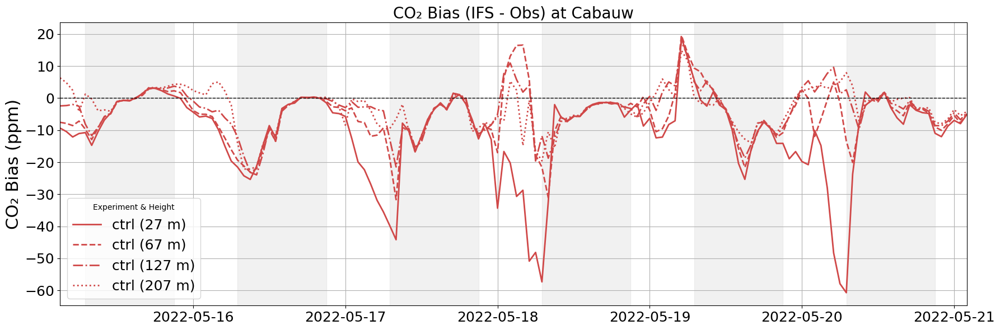

In [ ]:
# evolution of the co2 bias at cabauw and loobos
################################################################
# --------------------------------------------
# Settings
# --------------------------------------------
exps = ['ctrl']        # add/remove experiments as needed
sites = ['Cabauw']              # or ['Cabauw', 'Loobos']
sel_z = [27, 67, 127, 207]      # measurement heights to include

# Cabauw measurement heights (m)
cabauw_heights = np.array([27, 67, 127, 207])
# Loobos fixed measurement height
loobos_height = 24

# Figure setup
fig, axes = plt.subplots(nrows=len(sites), ncols=1, figsize=(18, 2+len(sites)*4), sharex=True)

# --------------------------------------------
# Loop through sites
# --------------------------------------------
for ax, site in zip(np.atleast_1d(axes), sites):

    if site == 'Cabauw':
        obs_ds = ds_cabauw['Cabauw_CO2_May2022']
        site_heights = cabauw_heights
        site_key = 'cabauw'
        selected_heights = [get_closest_height(site_heights, h) for h in sel_z]
    else:  # Loobos
        obs_ds = ds_loobos['Air_Quality']
        site_heights = np.array([loobos_height])
        site_key = 'loobos'
        selected_heights = [loobos_height]

    # Define line styles (cycled if there are more heights)
    line_styles = ['solid', 'dashed', 'dashdot', 'dotted']

    # Loop through experiments and selected heights
    for exp_i, (exp, exp_longname, label, color) in enumerate(exp_names):
        if exp not in plot_exps:
            continue
        for i, z_sel in enumerate(selected_heights):
            style = line_styles[i % len(line_styles)]
            closest_height = get_closest_height(site_heights, z_sel)

            # Select IFS values
            ifs_values = IFS[site_key]['z'][exp]['co2'].sel(height=closest_height, method='nearest')

            # Select observation values
            if site == 'Cabauw':
                obs_var = f'co2_{z_sel}m'
                obs_values = obs_ds[obs_var]
            else:
                obs_values = obs_ds['co2_mixing_ratio']

            # Extract time for both
            obs_time = obs_ds['time']
            ifs_time = IFS[site_key]['z'][exp]['time']

            # --- Select only common timestamps (no interpolation) ---
            common_times = np.intersect1d(obs_time, ifs_time)
            if len(common_times) == 0:
                print(f"⚠️ No overlapping times found for {site} - {exp} - {z_sel} m")
                continue
            # Select common times in both datasets
            obs_common = obs_values.sel(time=common_times)
            ifs_common = ifs_values.sel(time=common_times)

            # Compute bias (IFS - OBS)
            bias = ifs_common - obs_common

            # Label for legend
            label = f"{exp} ({z_sel} m)"

            # Plot
            ax.plot(common_times, bias, label=label, color=color, linestyle=style, linewidth=2)

        # Add shaded daytime areas using observation time (only once per site)
        shade_daytime(ax, common_times)
    # Add zero reference line
    ax.axhline(0, color='k', linestyle='--', linewidth=1)

    # Formatting
    ax.set_title(f'CO₂ Bias (IFS - Obs) at {site}', fontsize=20)
    ax.set_ylabel('CO₂ Bias (ppm)')
    ax.set_xlim((datetime.datetime.strptime(str_time, "%Y-%m-%dT%H:%M"),
                 datetime.datetime.strptime(end_time, "%Y-%m-%dT%H:%M")))
    ax.legend(title="Experiment & Height", fontsize=18)
    ax.grid(True)


plt.tight_layout()
plt.show()


In [125]:
valid_mask

2022-05-15 03:00:00    True
2022-05-15 04:00:00    True
2022-05-15 05:00:00    True
2022-05-15 06:00:00    True
2022-05-15 07:00:00    True
                       ... 
2022-05-20 22:00:00    True
2022-05-20 23:00:00    True
2022-05-21 00:00:00    True
2022-05-21 01:00:00    True
2022-05-21 02:00:00    True
Name: co2_67m, Length: 144, dtype: bool


Top 5 — SPP turb | co2_ppm at 80.0 m:
  Rank Time                  Spread
  ----------------------------------------
  1    2022-05-18T07:00:00   6.7323
  2    2022-05-18T08:00:00   6.4555
  3    2022-05-18T06:00:00   5.1911
  4    2022-05-20T07:00:00   4.7024
  5    2022-05-20T06:00:00   3.8431

Top 5 — SPP turb | fco2nee (surface):
  Rank Time                  Spread
  ----------------------------------------
  1    2022-05-20T16:00:00   1.0750e-07
  2    2022-05-20T15:00:00   9.9360e-08
  3    2022-05-20T17:00:00   8.8306e-08
  4    2022-05-20T19:00:00   8.2309e-08
  5    2022-05-20T14:00:00   6.3833e-08

Top 5 — SPP all | co2_ppm at 80.0 m:
  Rank Time                  Spread
  ----------------------------------------
  1    2022-05-18T07:00:00   9.0754
  2    2022-05-18T06:00:00   7.7120
  3    2022-05-18T08:00:00   7.0682
  4    2022-05-20T18:00:00   6.4515
  5    2022-05-18T09:00:00   6.4459

Top 5 — SPP all | fco2nee (surface):
  Rank Time                  Spread
  -----------

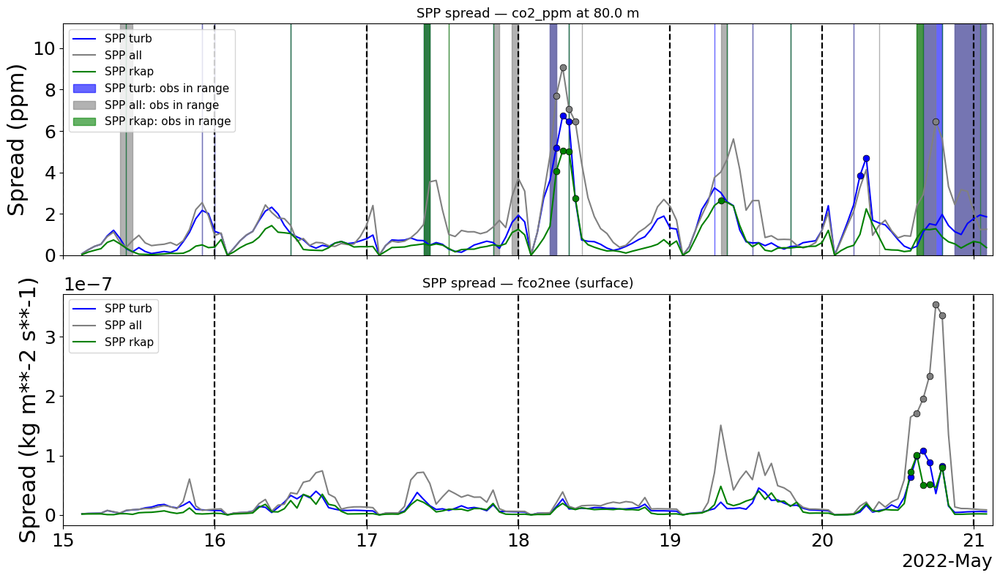

In [127]:
# Spread timeseries of SPP members (max - min) for two variables:
#   Panel 1: a 3D variable from IFS_nemo['slab']['z']   (e.g. co2_ppm at a given height)
#   Panel 2: a surface variable from IFS_nemo['slab']['srf'] (e.g. fco2nee)
#   Coloured shading on panel 1: for each experiment, hours where ANY Cabauw
#   tower height falls inside that experiment's ensemble [min, max].

plot_spp_exps = ['SPP_turb', 'SPP_all', 'SPP_rkap']

# --- panel 1: 3D variable ---
var_3d     = 'co2_ppm'
sel_height = 80        # metres, nearest match

# --- panel 2: surface variable ---
var_srf    = 'fco2nee'  # surface variable in IFS_nemo['slab']['srf']

top_n = 5   # top-N dates to print and highlight

# --- x-axis limits ---
xlim_start = pd.Timestamp('2022-05-15 00:00')
xlim_end   = pd.Timestamp('2022-05-21 03:00')

# Build lookup: exp → (label, color) from nemo_exp_names
nemo_meta = {exp: (label, color)
             for exp, _, label, color in nemo_exp_names
             if exp in plot_spp_exps}

fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

actual_height = None

for spp_exp in plot_spp_exps:
    label, color = nemo_meta.get(spp_exp, (spp_exp, None))

    # ---- Panel 1: 3D variable at sel_height ----
    if spp_exp in IFS_nemo['slab']['z']:
        da_3d = (IFS_nemo['slab']['z'][spp_exp][var_3d]
                 .sel(height=sel_height, method='nearest'))
        actual_height = float(da_3d['height'].values)
        spread_3d = da_3d.max('number') - da_3d.min('number')
        spread_3d.plot(ax=axes[0], color=color, lw=1.5, label=label)

        # top-N highlight and table
        s_sorted  = spread_3d.sortby(spread_3d, ascending=False)
        top_times = s_sorted['time'].values[:top_n]
        top_vals  = s_sorted.values[:top_n]
        axes[0].scatter(top_times, top_vals, color=color, zorder=5, s=40,
                        edgecolors='k', linewidths=0.5)

        print(f"\nTop {top_n} — {label} | {var_3d} at {actual_height} m:")
        print(f"  {'Rank':<5}{'Time':<22}{'Spread'}")
        print(f"  {'-'*40}")
        for rank, (t, s) in enumerate(zip(top_times, top_vals), 1):
            print(f"  {rank:<5}{str(t)[:19]:<22}{s:.4f}")

    # ---- Panel 2: surface variable ----
    if spp_exp in IFS_nemo['slab']['srf']:
        da_srf = IFS_nemo['slab']['srf'][spp_exp][var_srf]
        spread_srf = da_srf.max('number') - da_srf.min('number')
        spread_srf.plot(ax=axes[1], color=color, lw=1.5, label=label)

        s_sorted  = spread_srf.sortby(spread_srf, ascending=False)
        top_times = s_sorted['time'].values[:top_n]
        top_vals  = s_sorted.values[:top_n]
        axes[1].scatter(top_times, top_vals, color=color, zorder=5, s=40,
                        edgecolors='k', linewidths=0.5)

        print(f"\nTop {top_n} — {label} | {var_srf} (surface):")
        print(f"  {'Rank':<5}{'Time':<22}{'Spread'}")
        print(f"  {'-'*40}")
        for rank, (t, s) in enumerate(zip(top_times, top_vals), 1):
            print(f"  {rank:<5}{str(t)[:19]:<22}{s:.4e}")

# --- Cabauw obs within ensemble range — coloured shading per experiment ---
# For each SPP experiment: shade in the experiment's colour at every time step
# where ANY of the 4 Cabauw tower heights is inside that experiment's [min, max].
_cabauw_heights = np.array([27, 67, 127, 207])
# _cabauw_heights = np.array([ 67, 127])

for spp_exp in plot_spp_exps:
    if spp_exp not in IFS_nemo['slab']['z'] or actual_height is None:
        continue

    label, color = nemo_meta.get(spp_exp, (spp_exp, 'grey'))

    da_shad       = IFS_nemo['slab']['z'][spp_exp][var_3d].sel(height=sel_height, method='nearest')
    h_actual_shad = float(da_shad['height'].values)

    # --- bias correction ---
    # Use the nearest Cabauw obs height to the model height,
    # ensemble mean (not just member 0), over overlapping times only.
    nearest_obs_h = _cabauw_heights[np.argmin(np.abs(_cabauw_heights - h_actual_shad))]
    obs_for_bias  = ds_cabauw['Cabauw_CO2_May2022'][f'co2_{nearest_obs_h}m']
    mod_times_idx = pd.DatetimeIndex(da_shad['time'].values)
    obs_aligned   = obs_for_bias.to_series().reindex(mod_times_idx, method='nearest',
                                                     tolerance=pd.Timedelta('31min'))
    valid_mask = obs_aligned.notna()
    if valid_mask.any():
        mod_mean = float(da_shad.mean('number').values[valid_mask.values].mean())
        obs_mean = float(obs_aligned[valid_mask].values.mean())
        da_shad  = da_shad - (mod_mean - obs_mean)
        print(f"Bias correction for {label}: using obs at {nearest_obs_h} m, "
              f"bias = {mod_mean - obs_mean:.4f} ppm ({valid_mask.sum()} common times)")

    mod_min   = da_shad.min('number')
    mod_max   = da_shad.max('number')
    mod_times = pd.DatetimeIndex(mod_min['time'].values)

    any_within = np.zeros(len(mod_times), dtype=bool)
    for h in _cabauw_heights:
        obs_series    = ds_cabauw['Cabauw_CO2_May2022'][f'co2_{h}m'].to_series()
        obs_reindexed = obs_series.reindex(mod_times, method='nearest',
                                           tolerance=pd.Timedelta('31min'))
        in_range = (obs_reindexed.values >= mod_min.values) & \
                   (obs_reindexed.values <= mod_max.values)
        any_within |= in_range

    n_within = int(np.sum(any_within))
    print(f"\nAny Cabauw height inside {label} ({spp_exp}) range: "
          f"{n_within} / {len(mod_times)} time steps")

    axes[0].fill_between(
        mod_times, 0, 1,
        where=any_within,
        transform=axes[0].get_xaxis_transform(),
        color=color, alpha=0.6, zorder=0,
        label=f'{label}: obs in range',
    )

# --- midnight vertical lines ---
midnight = xlim_start.normalize()
while midnight <= xlim_end:
    for ax in axes:
        ax.axvline(midnight, color='k', lw=1.6, ls='--', zorder=0)
    midnight += pd.Timedelta('1D')

# --- axis styling ---
units_3d  = IFS_nemo['']['z'][plot_spp_exps[0]][var_3d].attrs.get('units', 'ppm')
units_srf = IFS_nemo['']['srf'][plot_spp_exps[0]][var_srf].attrs.get('units', '')

axes[0].set_title(f'SPP spread — {var_3d} at {actual_height} m', fontsize=13)
axes[0].set_ylabel(f'Spread ({units_3d})' if units_3d else 'Spread')
axes[0].set_xlabel('')
axes[0].legend(fontsize=11)
axes[0].set_xlim(xlim_start, xlim_end)
axes[0].set_ylim(0, None)

axes[1].set_title(f'SPP spread — {var_srf} (surface)', fontsize=13)
axes[1].set_ylabel(f'Spread ({units_srf})' if units_srf else 'Spread')
axes[1].set_xlabel('')
axes[1].legend(fontsize=11)

plt.tight_layout()
plt.show()


No air samples within 0 days 00:38:00 of 2022-05-18 06:00:00 or leg leg7


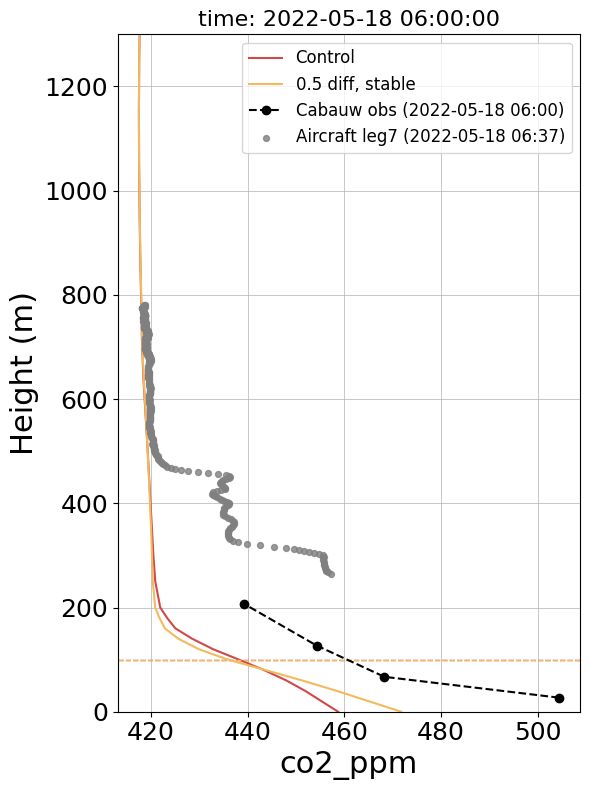

In [93]:
var_nemo = 'co2_ppm'
var_fc  = 'co2'
# var_nemo = 't'
# var_fc  = 'T'
time = 'all'  # or specify a time like '2022-05-16 23:00:00'
time = '2022-05-18 06:00:00'
region = 'slab'  # or 'cabauw' or 'loobos'

# plot_spp_exps = ['SPP_turb', 'SPP_all', 'SPP_rkap']
plot_spp_exps = ['',]

plot_exps     = ['ctrl_49r2b','half_diff_stable']
# plot_exps     = []


box_heights = [20, 500, 1000, 2000]  # heights (m) at which to draw boxplots
box_offset  = 55   # vertical spacing (m) between experiments at same height

plot_memebr0 = False
# --- observation options ---
plot_obs_cabauw   = True   # overlay Cabauw tower CO2 profile (4 heights)
plot_obs_aircraft = True  # overlay Loobos Aircraft_co2_mol (continuous flight)
plot_obs_airsamples = True # overlay Loobos airsamples_vertical_all (discrete flask)
obs_tol = pd.Timedelta('38min')   # tolerance for Cabauw time matching

fig, ax = plt.subplots(figsize=(6, 8))

active_exps = [(exp, label, color)
               for exp, _, label, color in nemo_exp_names
               if exp in plot_spp_exps]
n_exps = len(active_exps)

for i_exp, (exp, label, color) in enumerate(active_exps):
    print(f"plotting {exp} for variable {var_nemo}")

    if time == 'all':
        spp_data = (IFS_nemo[region]['z'][exp][var_nemo]
                    .sel(height=slice(0, 3000))
                    .mean('time'))
    else:
        spp_data = (IFS_nemo[region]['z'][exp][var_nemo]
                    .sel(height=slice(0, 3000))
                    .sel(time=time))

    # --- shaded min/max envelope ---
    spp_min = spp_data.min('number')
    spp_max = spp_data.max('number')
    ax.fill_betweenx(
        spp_min['height'].values,
        spp_min.values,
        spp_max.values,
        color=color, alpha=0.25, label=label,
    )

    # --- member-0 line ---
    member0 = spp_data.sel(number=0)
    if plot_memebr0:
        member0.plot(y='height', c=color, lw=1.5, ax=ax, add_legend=False)
    blh_sel = IFS_nemo[region]['srf'][exp]['blh'].sel(time=time, number=0) if time != 'all' \
                else IFS_nemo[region]['srf'][exp]['blh'].sel(number=0).mean('time')
    ax.axhline(float(blh_sel), color=color, lw=1.5, ls='--')

    # --- horizontal boxplots at predefined heights ---
    heights_arr = spp_data['height'].values
    for h_target in box_heights:
        h_idx    = int(np.argmin(np.abs(heights_arr - h_target)))
        h_actual = float(heights_arr[h_idx])
        members  = spp_data.isel(height=h_idx).values   # (n_members,)

        # offset each experiment so boxes don't overlap
        y_pos = h_actual + (i_exp - (n_exps - 1) / 2) * box_offset

        ax.boxplot(
            members,
            positions=[y_pos],
            vert=False,
            widths=box_offset * 0.75,
            patch_artist=True,
            boxprops=dict(facecolor=color, alpha=0.55),
            medianprops=dict(color='k', lw=2),
            whiskerprops=dict(color=color, lw=1.5),
            capprops=dict(color=color, lw=1.5),
            flierprops=dict(marker='o', markerfacecolor=color,
                            markeredgecolor=color, markersize=3, alpha=0.6),
            manage_ticks=False,
        )

# ------------------------------------------------------------
# Deterministic forecasts
# ------------------------------------------------------------
for exp,_, label, color in exp_names:
    if exp in plot_exps:
        _ctrl = IFS[region]['z'][exp][var_fc].sel(height=slice(0, 3000))
        _srf  = IFS[region]['srf'][exp]
        if time == 'all':
            _ctrl.mean('time').plot(y='height', c=color, label=label, ax=ax)
            ax.axhline(float(_srf['blh'].mean('time')), color=color, lw=1, ls='--')
        else:
            _ctrl.sel(time=time).plot(y='height', c=color, label=label, ax=ax)
            ax.axhline(float(_srf['blh'].sel(time=time)), color=color, lw=1, ls='--')

# ------------------------------------------------------------
# Cabauw tower CO2 observations (4-level tower: 27/67/127/207 m)
# ------------------------------------------------------------
if plot_obs_cabauw:
    obs_ds = ds_cabauw['Cabauw_CO2_May2022']
    _cabauw_heights = np.array([27, 67, 127, 207])

    if time == 'all':
        obs_vals = np.array([float(obs_ds[f'co2_{z}m'].mean('time').values)
                             for z in _cabauw_heights])
        ax.plot(obs_vals, _cabauw_heights, 'ko--', lw=1.5, ms=6,
                label='Cabauw obs (mean)', zorder=6)
    else:
        t_target  = pd.Timestamp(time)
        obs_times = pd.DatetimeIndex(obs_ds['time'].values)
        dt_vals   = np.abs(obs_times - t_target)
        idx       = int(dt_vals.argmin())
        if dt_vals[idx] <= obs_tol:
            obs_vals = np.array([float(obs_ds[f'co2_{z}m'].isel(time=idx).values)
                                 for z in _cabauw_heights])
            ax.plot(obs_vals, _cabauw_heights, 'ko--', lw=1.5, ms=6,
                    label=f'Cabauw obs ({str(obs_times[idx])[:16]})', zorder=6)
        else:
            print(f"No Cabauw obs within {obs_tol} of {time} (nearest: {dt_vals[idx]})")

# ------------------------------------------------------------
# Loobos Aircraft_co2_mol — continuous flight data, selected by leg
#   'all'         → scatter all legs
#   specific time → find the leg whose mid-time is closest; plot that leg
# ------------------------------------------------------------
if plot_obs_aircraft:
    air_ds = ds_loobos['Aircraft_co2_mol']

    if time == 'all':
        for leg in leg_names:
            sel = air_ds.sel(date=slice(legs[leg][0], legs[leg][1]))
            ax.scatter(sel['CO2_7815'].values, sel['Alt'].values,
                       c='grey', s=4, alpha=0.25,
                       label='Loobos aircraft' if leg == leg_names[0] else None,
                       zorder=5)
    else:
        t_target = pd.Timestamp(time)
        dt_legs  = {leg: abs(midd_times[leg] - t_target) for leg in leg_names}
        best_leg = min(dt_legs, key=dt_legs.get)
        best_dt  = dt_legs[best_leg]
        if best_dt <= obs_tol:
            sel = air_ds.sel(date=slice(legs[best_leg][0], legs[best_leg][1]))
            ax.scatter(sel['CO2_7815'].values, sel['Alt'].values,
                       c='grey', s=18, alpha=0.8,
                       label=f'Aircraft {best_leg} ({str(midd_times[best_leg])[:16]})',
                       zorder=5)
        else:
            print(f"No aircraft leg within {obs_tol} of {time} "
                  f"(nearest: {best_leg} at {best_dt})")

# ------------------------------------------------------------
# Loobos airsamples_vertical_all — discrete flask samples
#   columns: time (index), height_m, CO2 (ppm)
#   'all'         → scatter all samples
#   specific time → scatter samples within obs_tol, or nearest leg mid-time
# ------------------------------------------------------------
if plot_obs_airsamples:
    samp_ds = ds_loobos['airsamples_vertical_all']

    if time == 'all':
        ax.scatter(samp_ds['CO2'].values, samp_ds['height_m'].values,
                   marker='D', c='darkorange', s=30, alpha=0.7,
                   label='Air samples (all)', zorder=6)
    else:
        t_target   = pd.Timestamp(time)
        samp_times = pd.DatetimeIndex(samp_ds['time'].values)
        dt_samp    = np.abs(samp_times - t_target)
        mask_samp  = dt_samp <= obs_tol
        if mask_samp.sum() > 0:
            ax.scatter(samp_ds['CO2'].values[mask_samp],
                       samp_ds['height_m'].values[mask_samp],
                       marker='D', c='darkorange', s=50, alpha=0.9,
                       label=f'Air samples (±{obs_tol})', zorder=6)
        else:
            dt_legs  = {leg: abs(midd_times[leg] - t_target) for leg in leg_names}
            best_leg = min(dt_legs, key=dt_legs.get)
            t_leg    = midd_times[best_leg]
            dt_samp2 = np.abs(samp_times - t_leg)
            mask2    = dt_samp2 <= obs_tol
            if mask2.sum() > 0:
                ax.scatter(samp_ds['CO2'].values[mask2],
                           samp_ds['height_m'].values[mask2],
                           marker='D', c='darkorange', s=50, alpha=0.9,
                           label=f'Air samples ({best_leg})', zorder=6)
            else:
                print(f"No air samples within {obs_tol} of {time} or leg {best_leg}")

ax.set_ylim([0, 1300])
ax.set_xlabel(var_nemo)
ax.set_ylabel('Height (m)')
ax.set_title(f'time: {time}', fontsize=16)
ax.legend()
ax.grid(True, which='both', lw=0.5)
plt.tight_layout()
plt.show()


In [ ]:

# --------------------------------------------
# Daytime and nighttime mean tower profiles
# --------------------------------------------
plot_exps = ['ctrl','ctrl_9km','half_diff_stable','half_diff_unstable','ctrl_49r2b']  # experiments to plot
plot_exps = ['half_diff_stable','half_diff_unstable','ctrl_49r2b','9km_49r2b']  # experiments to plot


cabauw_heights = np.array([27, 67, 127, 207])
site_key = 'cabauw'
time_slice = slice('2022-05-14T00:00', '2022-05-22T00:00')

profile_specs = [
    {
        'title': 'Temperature',
        'ifs_var': 'T',
        'obs_kind': 'tower',
        'obs_var': 'TA',
        'scale': 1.0,
        'xlabel': 'Temperature [K]',
    },
    {
        'title': 'Specific humidity',
        'ifs_var': 'q',
        'obs_kind': 'tower',
        'obs_var': 'Q',
        'scale': 1000.0,
        'xlabel': 'Specific humidity [g kg$^{-1}$]',
    },
    {
        'title': 'CO$_2$',
        'ifs_var': 'co2',
        'obs_kind': 'co2',
        'obs_var': None,
        'scale': 1.0,
        'xlabel': 'CO$_2$ [ppm]',
    },
]

periods = [('day', 'Daytime'), ('night', 'Nighttime')]
panel_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

def get_period_mask(times, period):
    day_mask = (times.hour >= 8) & (times.hour < 20)
    if period == 'day':
        return day_mask
    return ~day_mask

def compute_profiles(spec, period):
    obs_profile = []
    ifs_profiles = {exp: [] for exp in plot_exps}

    if spec['obs_kind'] == 'tower':
        obs_data = ds_cabauw['obs_tower_meteo'][spec['obs_var']].sel(time=time_slice)
        obs_times = pd.to_datetime(obs_data['time'].values)
        selected_obs_times = obs_times[get_period_mask(obs_times, period)]

        for sel_z in cabauw_heights:
            obs_vals = obs_data.sel(time=selected_obs_times, z=sel_z, method='nearest').values
            obs_profile.append(np.nanmean(obs_vals))

        for exp, exp_longname, label, color in exp_names:
            if exp not in plot_exps:
                continue

            ifs_data = IFS[site_key]['z'][exp][spec['ifs_var']].sel(time=time_slice)
            ifs_times = pd.to_datetime(ifs_data['time'].values)
            common_times = np.intersect1d(selected_obs_times, ifs_times)

            for sel_z in cabauw_heights:
                if len(common_times) == 0:
                    ifs_profiles[exp].append(np.nan)
                    continue

                closest_height = get_closest_height(ifs_data.height.values, sel_z)
                ifs_vals = ifs_data.sel(time=common_times, height=closest_height, method='nearest').values
                ifs_profiles[exp].append(np.nanmean(ifs_vals))

    else:
        obs_data = ds_cabauw['Cabauw_CO2_May2022'].sel(time=time_slice)
        obs_times = pd.to_datetime(obs_data['time'].values)
        selected_obs_times = obs_times[get_period_mask(obs_times, period)]

        # Compute obs profile over the intersection with IFS times (use first exp as reference)
        # so that obs and IFS are averaged over the same set of timestamps
        first_exp = next(exp for exp, *_ in exp_names if exp in plot_exps)
        ifs_ref_times = pd.to_datetime(IFS[site_key]['z'][first_exp][spec['ifs_var']].sel(time=time_slice)['time'].values)
        common_times = np.intersect1d(selected_obs_times, ifs_ref_times)

        for sel_z in cabauw_heights:
            obs_var = f'co2_{sel_z}m'
            obs_vals = obs_data[obs_var].sel(time=common_times).values
            obs_profile.append(np.nanmean(obs_vals))

        for exp, exp_longname, label, color in exp_names:
            if exp not in plot_exps:
                continue

            ifs_data = IFS[site_key]['z'][exp][spec['ifs_var']].sel(time=time_slice)
            ifs_times = pd.to_datetime(ifs_data['time'].values)
            exp_common_times = np.intersect1d(selected_obs_times, ifs_times)

            for sel_z in cabauw_heights:
                if len(exp_common_times) == 0:
                    ifs_profiles[exp].append(np.nan)
                    continue

                closest_height = get_closest_height(ifs_data.height.values, sel_z)
                ifs_vals = ifs_data.sel(time=exp_common_times, height=closest_height, method='nearest').values
                ifs_profiles[exp].append(np.nanmean(ifs_vals * spec['scale']))

    obs_profile = np.asarray(obs_profile, dtype=float)
    for exp in ifs_profiles:
        ifs_profiles[exp] = np.asarray(ifs_profiles[exp], dtype=float)

    return obs_profile, ifs_profiles

def get_shared_xlim(values, padding_fraction=0.03):
    finite_values = np.asarray(values, dtype=float)
    finite_values = finite_values[np.isfinite(finite_values)]

    if finite_values.size == 0:
        return None

    xmin = finite_values.min()
    xmax = finite_values.max()

    if np.isclose(xmin, xmax):
        padding = max(abs(xmin) * padding_fraction, 1.0)
    else:
        padding = (xmax - xmin) * padding_fraction

    return xmin - padding, xmax + padding

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 16), sharey=True)

for row, spec in enumerate(profile_specs):
    row_profile_values = []

    for col, (period, period_label) in enumerate(periods):
        ax = axes[row, col]
        obs_profile, ifs_profiles = compute_profiles(spec, period)

        row_profile_values.append(obs_profile)
        row_profile_values.extend(list(ifs_profiles.values()))

        ax.plot(obs_profile, cabauw_heights, 'k-o', lw=2.5, ms=6, label='Obs', zorder=3)

        plot_order = [exp for exp in plot_exps if exp != 'ctrl_49r2b']
        if 'ctrl_49r2b' in plot_exps:
            plot_order.append('ctrl_49r2b')

        for exp in plot_order:
            for exp_name, exp_longname, label, color in exp_names:
                if exp_name != exp:
                    continue
                zorder = 6 if exp_name == 'ctrl_49r2b' else 4
                linewidth = 2.8 if exp_name == 'ctrl_49r2b' else 2
                ax.plot(ifs_profiles[exp_name], cabauw_heights, color=color, lw=linewidth, label=label, zorder=zorder)
                break

        if row == 0:
            ax.set_title(period_label, fontsize=19)

        panel_index = row * len(periods) + col
        ax.text(0.93, 0.97, panel_labels[panel_index], transform=ax.transAxes, ha='left', va='top', fontsize=15, fontweight='bold')

        ax.set_xlabel(spec['xlabel'])
        ax.grid(True, alpha=0.4)
        ax.set_ylim(0, 220)

        if col == 0:
            ax.set_ylabel('Height (m)')

    shared_xlim = get_shared_xlim(np.concatenate(row_profile_values))
    if shared_xlim is not None:
        axes[row, 0].set_xlim(shared_xlim)
        axes[row, 1].set_xlim(shared_xlim)

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.01), ncol=5, fontsize=16)
# plt.savefig(f'{dir_out}/co2_profiles_cabauw_day_night.png', dpi=300, bbox_inches='tight')
plt.tight_layout(rect=(0, 0.05, 1, 1))
plt.show()


In [ ]:

# --------------------------------------------
# Settings
# --------------------------------------------
plot_exps = ['half_diff_stable','half_diff_unstable','ctrl_49r2b','9km_49r2b']  # experiments to plot


cabauw_heights = np.array([27, 67, 127, 207])
site_key = 'cabauw'
obs_ds = ds_cabauw['Cabauw_CO2_May2022']

# Time subset
time_slice = slice('2022-05-14T00:00', '2022-05-22T00:00')

obs_time = obs_ds['time'].sel(time=time_slice)
obs_time = pd.to_datetime(obs_time.values)

# Daytime/nighttime masks
day_mask = (obs_time.hour >= 8) & (obs_time.hour < 20)
night_mask = ~day_mask

# Figure: 2 rows (day/night) × 3 columns (CO2, bias, RMSE)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10), sharey=True)
axes = axes.flatten()

# Column labels
col_labels = ['CO₂ Obs & IFS [ppm]', 'Bias (IFS - Obs) [ppm]', 'RMSE [ppm]']
for ax, label in zip(axes[:3], col_labels):
    ax.set_title(f'Daytime - {label}', fontsize=14)
for ax, label in zip(axes[3:], col_labels):
    ax.set_title(f'Nighttime - {label}', fontsize=14)

# Helper function to compute metrics for a mask
def compute_profiles(mask):
    obs_profiles = []
    bias_profiles = {exp: [] for exp in plot_exps}
    rmse_profiles = {exp: [] for exp in plot_exps}
    blh_profiles = {exp: None for exp in plot_exps}

    times_mask = obs_time[mask]

    # Compute obs profile over the intersection with IFS times (use first exp as reference)
    # so that obs and IFS are computed over the same set of timestamps
    first_exp = next(exp for exp, *_ in exp_names if exp in plot_exps)
    ifs_ref_times = pd.to_datetime(IFS[site_key]['z'][first_exp]['co2'].sel(time=time_slice)['time'].values)
    common_times = np.intersect1d(times_mask, ifs_ref_times)

    for sel_z in cabauw_heights:
        obs_var = f'co2_{sel_z}m'
        obs_vals = obs_ds[obs_var].sel(time=common_times).values
        obs_profiles.append(obs_vals.mean())

    obs_profiles = np.array(obs_profiles)

    for (exp, exp_longname, label, color) in exp_names:
        if exp not in plot_exps:   # skip if not in chosen list
            continue
        ifs_data = IFS[site_key]['z'][exp]['co2'].sel(time=time_slice)
        ifs_times = pd.to_datetime(ifs_data['time'].values)
        exp_common_times = np.intersect1d(times_mask, ifs_times)

        bias_list = []
        rmse_list = []

        for sel_z in cabauw_heights:
            obs_var = f'co2_{sel_z}m'
            obs_vals = obs_ds[obs_var].sel(time=exp_common_times).values

            # Select IFS values at closest model height
            closest_height = get_closest_height(ifs_data.height.values, sel_z)
            ifs_common = ifs_data.sel(time=exp_common_times, height=closest_height, method='nearest').values

            bias_list.append((ifs_common - obs_vals).mean())
            rmse_list.append(np.sqrt(((ifs_common - obs_vals)**2).mean()))

        bias_profiles[exp] = np.array(bias_list)
        rmse_profiles[exp] = np.array(rmse_list)

        # Compute mean BLH over the same common times
        ifs_blh_times = pd.to_datetime(IFS[site_key]['srf'][exp]['blh']['time'].values)
        common_blh_times = np.intersect1d(exp_common_times, ifs_blh_times)

        if len(common_blh_times) > 0:
            # boolean mask to select BLH values at common times
            mask_blh = np.isin(ifs_blh_times, common_blh_times)
            ifs_blh = IFS[site_key]['srf'][exp]['blh'].values[mask_blh]
            blh_profiles[exp] = np.mean(ifs_blh)
        else:
            blh_profiles[exp] = None

    return obs_profiles, bias_profiles, rmse_profiles, blh_profiles

# Compute day and night profiles
day_obs, day_bias, day_rmse, day_blh = compute_profiles(day_mask)
night_obs, night_bias, night_rmse, night_blh = compute_profiles(night_mask)

# --------------------------------------------
# Plot daytime (row 0)
# --------------------------------------------
# CO2 Obs & IFS
ax = axes[0]
ax.plot(day_obs, cabauw_heights, 'k-o', label='Obs')
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(day_obs + day_bias[exp], cabauw_heights, color=color, label=f'{label}')
    # if day_blh[exp] is not None:
    #     ax.axhline(day_blh[exp], color=color, lw=1.5, ls=':')
ax.set_ylabel('Height (m)')
ax.grid(True)
ax.set_xlim(423, 446)

# Bias
ax = axes[1]
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(day_bias[exp], cabauw_heights, color=color, label=f'{label}')
ax.axvline(0, color='k', linestyle='--')
ax.grid(True)


# RMSE
ax = axes[2]
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(day_rmse[exp], cabauw_heights, color=color, label=f'{label}')
ax.grid(True)

# --------------------------------------------
# Plot nighttime (row 1)
# --------------------------------------------
# CO2 Obs & IFS
ax = axes[3]
ax.plot(night_obs, cabauw_heights, 'k-o', label='Obs')
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(night_obs + night_bias[exp], cabauw_heights, color=color, label=f'{label}')
    # if night_blh[exp] is not None:
    #     ax.axhline(night_blh[exp], color=color, lw=1.5, ls=':')
ax.set_ylabel('Height (m)')
ax.set_xlabel('CO₂ [ppm]')
ax.grid(True)
ax.set_xlim(423, 446)

# Bias
ax = axes[4]
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(night_bias[exp], cabauw_heights, color=color, label=f'{label}')
ax.axvline(0, color='k', linestyle='--')
ax.set_xlabel('Bias [ppm]')
ax.grid(True)

# RMSE
ax = axes[5]
for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
    if exp not in plot_exps:   # skip if not in chosen list
        continue
    ax.plot(night_rmse[exp], cabauw_heights, color=color, label=f'{label}')
ax.set_xlabel('RMSE [ppm]')
ax.grid(True)

# Legend
axes[3].legend(fontsize=15, loc='upper right')

plt.tight_layout()
plt.show()


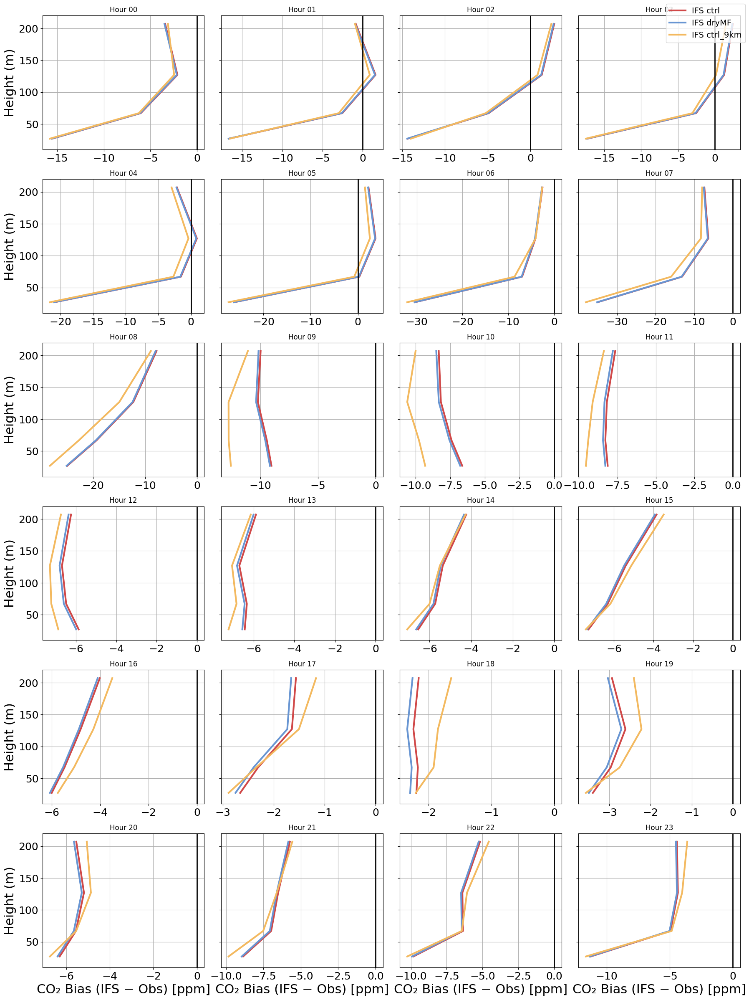

In [ ]:
#####  Vertical profiles of CO2 Bias (IFS - Cabauw) #####
# --------------------------------------------
# Settings
# --------------------------------------------
exps = ['ctrl', 'dryMF','ctrl_9km']
cabauw_heights = np.array([27, 67, 127, 207])
site_key = 'cabauw'
obs_ds = ds_cabauw['Cabauw_CO2_May2022']

# Time array for interpolation (subset of days)
cabauw_time = obs_ds['time'].sel(time=slice('2022-05-16T02:00', '2022-05-21T00:00'))

# --------------------------------------------
# Prepare figure: 6 rows × 4 columns for 24 hours
# --------------------------------------------
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(18, 24), sharex=False, sharey=True)
axes = axes.flatten()

# --------------------------------------------
# Loop over hours
# --------------------------------------------
for hour in range(24):
    ax = axes[hour]

    # Select times at the current hour
    times_hour = cabauw_time[cabauw_time.dt.hour == hour]

    # --------------------------------------------
    # Get mean observations for this hour
    # --------------------------------------------
    obs_means = []
    for sel_z in cabauw_heights:
        obs_var = f'co2_{sel_z}m'
        mean_obs = obs_ds[obs_var].sel(time=times_hour).mean(dim='time').values
        obs_means.append(mean_obs)
    obs_means = np.array(obs_means)

    # --------------------------------------------
    # Plot experiments as bias lines (IFS - Obs)
    # --------------------------------------------
    for exp, exp_longname, label, color in exp_names:
        if exp not in exps:   # skip if not in chosen list
            continue
        # Interpolate to Cabauw observation times if needed
        ifs_values_hour = IFS[site_key]['z'][exp]['co2'].sel(time=times_hour)
        mean_ifs = ifs_values_hour.mean(dim='time').sel(height=slice(0, 250))

        # Interpolate model values to Cabauw heights
        ifs_interp = np.interp(cabauw_heights, mean_ifs.height.values, mean_ifs.values)

        # Compute bias
        bias = ifs_interp - obs_means

        # Plot bias
        ax.plot(bias, cabauw_heights, label=f'IFS {label}', c=color, lw=3)

    # --------------------------------------------
    # Formatting
    # --------------------------------------------
    ax.axvline(0, color='k', linestyle='-', lw=2)  # zero line
    ax.set_title(f'Hour {hour:02d}', fontsize=12)
    ax.grid(True)
    ax.set_ylim(10, 220)

# Set common labels
for ax in axes[-4:]:
    ax.set_xlabel('CO₂ Bias (IFS − Obs) [ppm]')
for ax in axes[::4]:
    ax.set_ylabel('Height (m)')

# Adjust layout and add legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize=14)
plt.tight_layout()
plt.show()


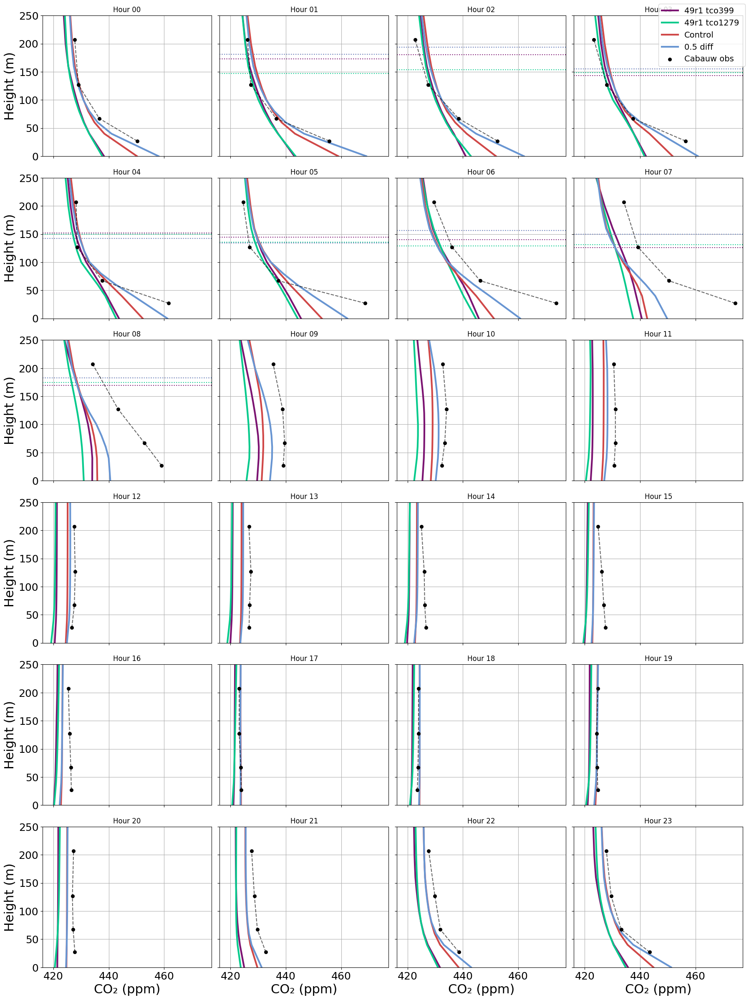

In [60]:
#####  Vertical profiles of CO2 at Cabauw one per hour #####
# --------------------------------------------
# Settings
# --------------------------------------------
plot_exps = ['ctrl','ctrl_9km','ctrl_49r2b','half_diffusion']    # experiments to plot

cabauw_heights = np.array([27, 67, 127, 207])
site_key = 'cabauw'
st_time = '2022-05-16T02:00'
en_time = end_time
# st_time = '2022-05-18T02:00'
# en_time = '2022-05-19T02:00'
obs_ds = ds_cabauw['Cabauw_CO2_May2022'].sel(time=slice(st_time, en_time))

# Time array for interpolation (subset of days)
cabauw_time = obs_ds['time'].sel(time=slice('2022-05-16T02:00', '2022-05-21T00:00'))

# --------------------------------------------
# Prepare figure: 6 rows × 4 columns for 24 hours
# --------------------------------------------
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(18, 24), sharex=True, sharey=True)
axes = axes.flatten()

# --------------------------------------------
# Loop over hours
# --------------------------------------------
for hour in range(24):
    ax = axes[hour]

    # Select times at the current hour
    times_hour = cabauw_time[cabauw_time.dt.hour == hour]

    # --------------------------------------------
    # Plot experiments as lines
    # --------------------------------------------
    for ii, (exp, exp_longname, label, color) in enumerate(exp_names):
        if exp not in plot_exps:   # skip if not in chosen list
            continue
        # Interpolate to Cabauw observation times if needed
        ifs_values_hour = IFS[site_key]['z'][exp]['co2'].sel(time=times_hour)
        # Mean over time
        mean_ifs = ifs_values_hour.mean(dim='time').sel(height=slice(0, 250))
        # Plot line connecting heights
        ax.plot(mean_ifs,mean_ifs.height,label=f'{label}',c=color,lw=3)
        # --------------------------------------------
        # Plot mean BLH from IFS
        # --------------------------------------------
        # Interpolate to Cabauw observation times if needed
        ifs_srf_hour = IFS[site_key]['srf'][exp]['blh'].sel(time=~IFS[site_key]['srf'][exp]['blh'].get_index('time').duplicated()).sel(time=times_hour)
        # Mean over time
        mean_ifs_blh = ifs_srf_hour.mean(dim='time')
        # Plot line connecting heights
        ax.axhline(mean_ifs_blh,c=color,lw=1.5,ls=':')


    # --------------------------------------------
    # Plot observations as dots (composite)
    # --------------------------------------------
    obs_means = []
    for sel_z in cabauw_heights:
        obs_var = f'co2_{sel_z}m'
        mean_obs = obs_ds[obs_var].sel(time=times_hour).mean(dim='time').values
        obs_means.append(mean_obs)
    obs_means = np.array(obs_means)

    ax.scatter(obs_means, cabauw_heights, color='k', label='Cabauw obs', zorder=5, s=30)
    ax.plot(obs_means, cabauw_heights, color='k', linestyle='--', alpha=0.6)


    # --------------------------------------------
    # Formatting
    # --------------------------------------------
    ax.set_title(f'Hour {hour:02d}', fontsize=12)
    ax.grid(True)
    ax.set_ylim(0, 250)

# Set common labels
for ax in axes[-4:]:
    ax.set_xlabel('CO₂ (ppm)')
for ax in axes[::4]:
    ax.set_ylabel('Height (m)')

# Adjust layout and add legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize=14)
plt.tight_layout()
plt.show()


In [27]:
### Diurnal cycle of concentration and surface sources ###
#############################################

# --- Common times between IFS and Cabauw obs ---
def drop_duplicate_times(ds):
    """Remove duplicate timestamps from an xarray Dataset or DataArray."""
    _, unique_idx = np.unique(ds['time'], return_index=True)
    return ds.isel(time=np.sort(unique_idx))


IFS_ctrl_srf = drop_duplicate_times(IFS['cabauw']['srf']['ctrl'])
IFS_ctrl_z   = drop_duplicate_times(IFS['cabauw']['z']['ctrl'])

obs_ds = drop_duplicate_times(obs_ds)


common_times = np.intersect1d(IFS_ctrl_srf.time.values, obs_ds.time.values)

IFS_ctrl_srf = IFS_ctrl_srf.sel(time=common_times)
IFS_ctrl_z = IFS_ctrl_z.sel(time=common_times)
obs_ds = obs_ds.sel(time=common_times)


# --- Compute BLH and selected height ---
blh = IFS_ctrl_srf['blh']
h_sel = xr.where(blh < 200, blh, 200)

# Compute absolute differences between BLH/200 and each Cabauw height
diffs = np.abs(h_sel.expand_dims(cabauw_height=cabauw_heights_da) - cabauw_heights_da)

# Get index of nearest Cabauw level for each time
idx_min = diffs.argmin(dim="cabauw_height")

# Convert indices to actual heights
closest_obs_height = xr.DataArray(
    cabauw_heights_da[idx_min].values,
    coords={"time": h_sel["time"]},
    dims="time"
)

# --- Interpolate IFS CO₂ to h_sel or nearest obs height ---
co2_profile = IFS_ctrl_z['co2']
co2_at_h = co2_profile.interp(height=closest_obs_height)

# --- Select corresponding observation variable dynamically ---
obs_var_list = [f"co2_{int(h)}m" for h in cabauw_heights]

# Build an observation series matched in time
obs_matched = xr.full_like(co2_at_h, np.nan)
for t in obs_ds.time:
    h_now = float(closest_obs_height.sel(time=t))
    obs_var = f"co2_{int(h_now)}m"
    if obs_var in obs_ds:
        obs_matched.loc[dict(time=t)] = obs_ds[obs_var].sel(time=t)

# --- Get NEE ---
nee = -IFS_ctrl_srf['fco2nee']
antropogenic_flux = input['co2_antrop_emission']
ifs_tot_co2_flx = (-IFS_ctrl_z['co2flx_diff']).sel(height=0)
obs_tot_co2_flx = ds_cabauw['obs_surf_flx']['FC']

# --- Plot ---
fig, axs = plt.subplots(2, 1, figsize=(12, 9), sharex=True)

# === CO₂ concentration ===
ax = axs[0]
co2_at_h.groupby('time.hour').mean().plot(ax=ax, lw=2.3, color='tab:blue', label='IFS CO₂')
obs_matched.groupby('time.hour').mean().plot(ax=ax, lw=2.3, color='tab:orange', label='Cabauw obs')
ax.set_title('CO₂ concentration at min(BLH, 200 m) or nearest observed height')
ax.set_ylabel('CO₂ (ppm)')
ax.set_xlim(-0.1, 24.1)
ax.grid(); ax.legend()

# === NEE ===
ax = axs[1]
# nee.groupby('time.hour').mean().plot(ax=ax, lw=1.5,ls='--', color='tab:green', label='IFS NEE')
# antropogenic_flux.groupby('time.hour').mean().plot(ax=ax, lw=1.5,ls='--', color='tab:red', label='Anthropogenic emission (wrong units!)')
ifs_tot_co2_flx.groupby('time.hour').mean().plot(ax=ax, lw=1.5,ls='--', color='tab:red', label='Total emission ')
obs_tot_co2_flx.groupby('time.hour').mean().plot(ax=ax, lw=2.3, color='tab:orange', label='Cabauw obs')
ax.set_title('Sources of CO₂ at the surface')
ax.set_ylabel('Flux (μmol m⁻² s⁻¹)')
ax.set_xlabel('Hour of day')
ax.axhline(0, color='k', lw=1)
ax.set_xlim(-0.1, 24.1)
ax.grid(); ax.legend()

plt.tight_layout()
plt.show()


NameError: name 'obs_ds' is not defined

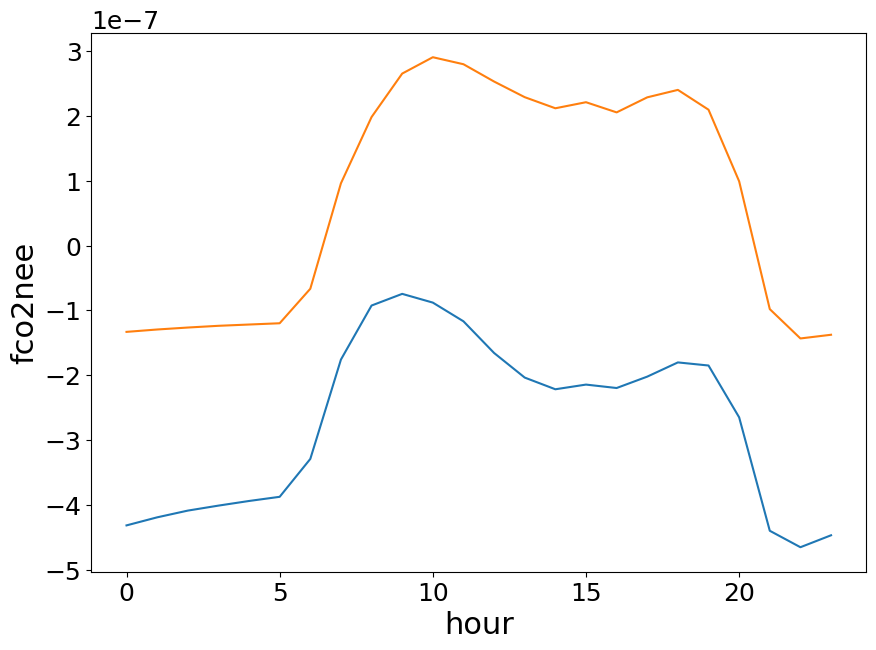

In [32]:
(IFS_nemo['slab']['srf']['SPP_all']['fco2nee']).mean('number').groupby('time.hour').mean().plot()
IFS_ctrl_srf['fco2nee'].groupby('time.hour').mean().plot()

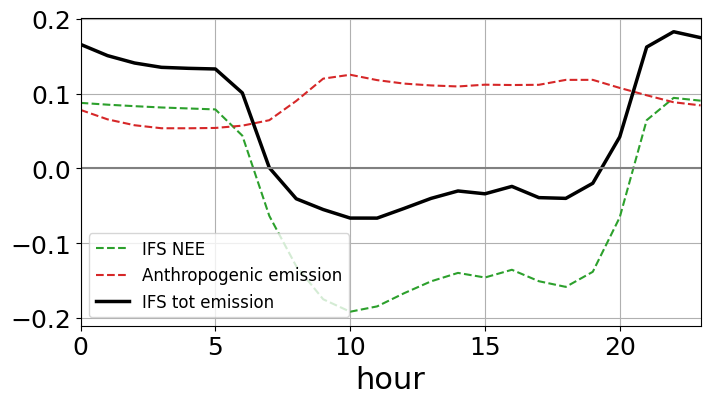

In [57]:
nee = -IFS_ctrl_srf['fco2nee']
antropogenic_flux = mfun.concentration_to_ppm('co2',input['co2_antrop_emission'])
plt.figure(figsize=(8,4))
nee.groupby('time.hour').mean().plot( lw=1.5,ls='--', color='tab:green', label='IFS NEE')
antropogenic_flux.groupby('time.hour').mean().plot(lw=1.5,ls='--', color='tab:red', label='Anthropogenic emission')
(nee.groupby('time.hour').mean()+antropogenic_flux.groupby('time.hour').mean()).plot( lw=2.5,ls='-', color='k', label='IFS tot emission')
plt.axhline(0,c='grey')
plt.grid()
plt.xlim(0,23)
plt.legend()

Text(0.5, 1.0, '2D output ')

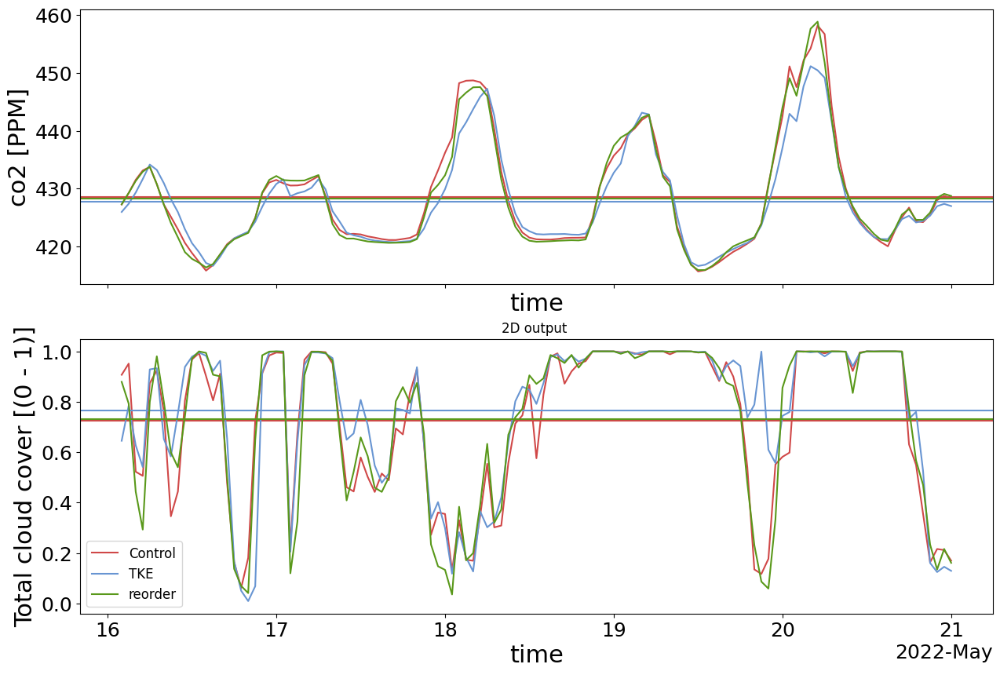

In [ ]:
vars = ['co2','tcc']
plot_exps = ['ctrl','TKE','reorder']  # experiments to plot

fig, axes = plt.subplots(nrows=len(vars), figsize=(15,len(vars)*5), sharex=True)
# loop through experiments
for ii, var in enumerate(vars):
    for ie, (exp, exp_longname, label,color) in enumerate(exp_names):
        if exp not in plot_exps:   # skip if not in chosen list
            continue
        IFS['slab']['srf'][exp][var].plot(ax=axes[ii],label=label,c=color)
        axes[ii].axhline(IFS['slab']['srf'][exp][var].mean('time'),c=color)
plt.legend()
plt.title(f"2D output ")

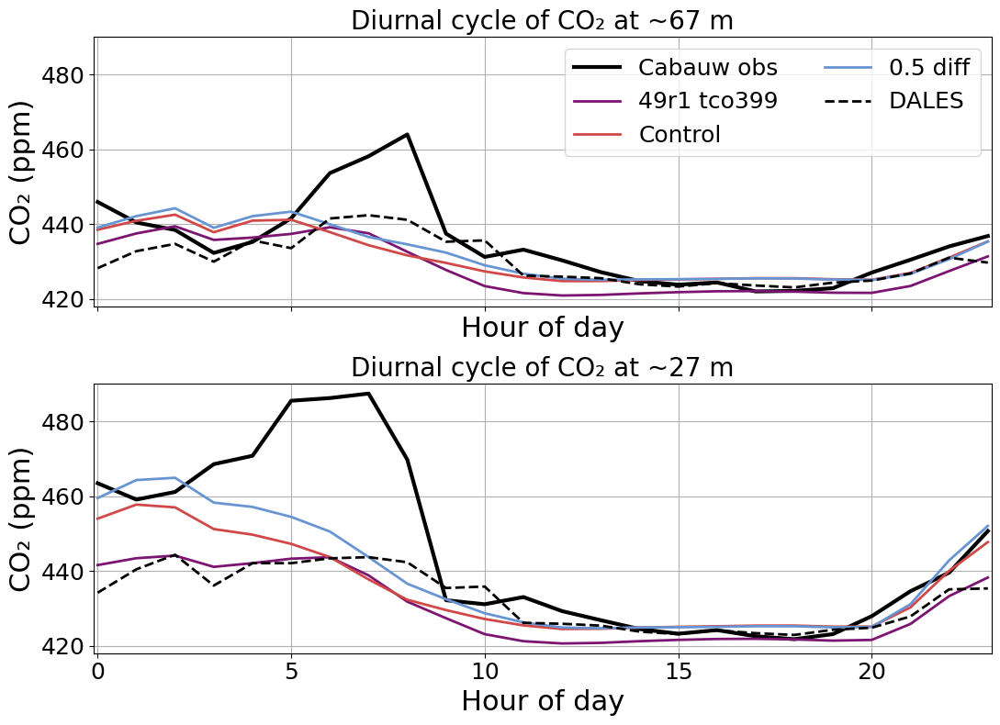

In [96]:
### Diurnal cycle of concentration at Cabauw (two heights)
# --------------------------------------------
# Settings
# --------------------------------------------
plot_exps = ['ctrl','ctrl_49r2b','half_diffusion']
cabauw_heights = np.array([27, 67, 127, 207])
site_key = 'cabauw'

obs_ds = ds_cabauw['Cabauw_CO2_May2022']
cabauw_time = obs_ds['time'].sel(time=slice('2022-05-16T02:00', '2022-05-21T00:00'))
obs_ds = obs_ds.sel(time=cabauw_time)

# Target heights: top=200 m (uses nearest obs level), bottom=27 m
target_heights = [67, 27]

# Use only times common to all datasets we plot
common_times = cabauw_time.values
dales_ds = globals().get('dales_cabauw', None)
dales_co2_var = None
if dales_ds is not None:
    for cand in ['sv004_ppm', 'co2_ppm', 'co2']:
        if cand in dales_ds.data_vars:
            dales_co2_var = cand
            break
    if dales_co2_var is not None:
        common_times = np.intersect1d(common_times, dales_ds['time'].values)

# --------------------------------------------
# Prepare figure: 2 subplots (top ~200 m, bottom 27 m)
# --------------------------------------------
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(11, 8), sharex=True)

for ax, z_target in zip(axes, target_heights):
    # Observations: pick nearest available tower level
    z_obs = float(cabauw_heights[np.argmin(np.abs(cabauw_heights - z_target))])
    obs_var = f'co2_{int(z_obs)}m'
    obs_diurnal = obs_ds[obs_var].sel(time=common_times).groupby('time.hour').mean('time')
    obs_diurnal.plot(x='hour', ax=ax, label=f'Cabauw obs', color='k', lw=3)

    # IFS experiments
    for ie, (exp, exp_longname, label, color) in enumerate(exp_names):
        if exp not in plot_exps:
            continue
        ifs_da = IFS[site_key]['z'][exp]['co2'].sel(time=common_times)
        # Prefer interpolation to requested height (e.g., 200 m)
        ifs_at_z = ifs_da.interp(height=float(z_target))
        ifs_diurnal = ifs_at_z.groupby('time.hour').mean('time')
        ifs_diurnal.plot(x='hour', ax=ax, label=f'{label}', color=color, lw=2)

    # DALES (optional)
    if (dales_ds is not None) and (dales_co2_var is not None):
        dales_da = dales_ds[dales_co2_var].sel(time=common_times)
        if 'zt' in dales_da.dims or 'zt' in dales_da.coords:
            dales_at_z = dales_da.sel(zt=float(z_target), method='nearest')
        else:
            dales_at_z = dales_da
        dales_diurnal = dales_at_z.groupby('time.hour').mean('time')
        dales_diurnal.plot(x='hour', ax=ax, label=f'DALES ', color='k', lw=2,ls='--')

    ax.set_xlim(-0.1, 23.1)
    ax.set_ylim(418,490)
    ax.grid(True)
    ax.set_xlabel('Hour of day')
    ax.set_ylabel('CO₂ (ppm)')
    ax.set_title(f'Diurnal cycle of CO₂ at ~{int(z_target)} m',fontsize=20)

# One legend (top axis)
axes[0].legend(ncol=2, fontsize=18)
plt.tight_layout()
plt.show()

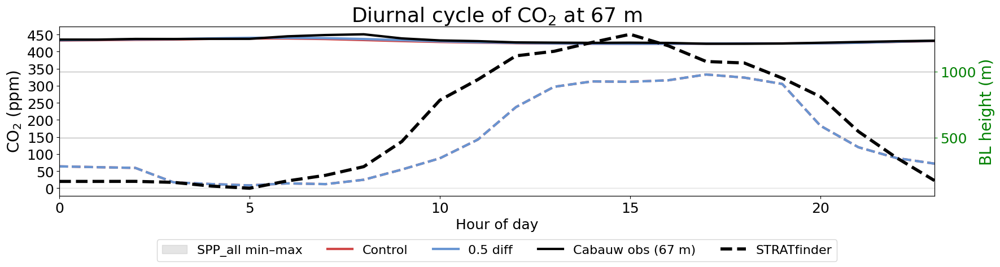

In [54]:
plot_exps = ['ctrl','ctrl_49r2b','TKEv2']  # experiments to plot
plot_exps = ['ctrl_49r2b','half_diffusion']

var = 'co2'
site_key = 'cabauw'
z_target = 67.0  # 2nd Cabauw tower level (m)

ds_z = IFS[site_key]['z']
ds_srf = IFS[site_key]['srf']
unit_conc = IFS['slab']['z'][plot_exps[0]][var].attrs.get('units', '')  # Default to an empty string if 'units' is missing

# Observations: Cabauw CO2 at 67 m
obs_ds = ds_cabauw['Cabauw_CO2_May2022']
cabauw_time = obs_ds['time'].sel(time=slice('2022-05-15T02:00', '2022-05-21T00:00'))
obs_ds = obs_ds.sel(time=cabauw_time)
obs_var = 'co2_67m'

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 5), sharex=True)
ax2 = axes.twinx()

# --------------------------------------------
# NEMO/ensemble envelope (min-max) at 67 m
# --------------------------------------------
try:
    nemo_exp = nemo_exp_names[0][0]  # e.g. 'SPP_all'
    nemo_color = nemo_exp_names[0][3] if len(nemo_exp_names[0]) >= 4 else 'grey'
    nemo_ds_z = IFS_nemo.get(site_key, {}).get('z', {}).get(nemo_exp, None)
    if nemo_ds_z is not None and var in nemo_ds_z:
        nemo_da = nemo_ds_z[var]
        if 'height' in nemo_da.dims or 'height' in nemo_da.coords:
            nemo_at_z = nemo_da.interp(height=z_target)
        else:
            nemo_at_z = nemo_da
        nemo_hr = nemo_at_z.groupby('time.hour').mean('time', skipna=True)
        if 'number' in nemo_hr.dims:
            nemo_min = nemo_hr.min('number', skipna=True)
            nemo_max = nemo_hr.max('number', skipna=True)
            axes.fill_between(
                nemo_hr['hour'].values,
                nemo_min.values,
                nemo_max.values,
                color=nemo_color,
                alpha=0.20,
                label=f"{nemo_exp} min–max",
            )
except Exception as e:
    print(f"Skipping NEMO min–max envelope: {e}")

# --------------------------------------------
# Model experiments (IFS)
# --------------------------------------------
for exp, _, exp_lab, color in exp_names:
    if exp not in plot_exps:
        continue
    ifs_da = ds_z[exp][var]
    if 'height' in ifs_da.dims or 'height' in ifs_da.coords:
        ifs_at_z = ifs_da.interp(height=z_target)
    else:
        ifs_at_z = ifs_da
    hourly_co2 = ifs_at_z.groupby('time.hour').mean(dim='time', skipna=True)
    hourly_srf = ds_srf[exp].groupby('time.hour').mean(dim='time', skipna=True)

    hourly_co2.plot(ax=axes, x='hour', label=exp_lab, c=color, lw=3)
    if 'blh' in hourly_srf:
        hourly_srf['blh'].plot(ax=ax2, x='hour', lw=3, c=color, ls='--')

# --------------------------------------------
# Observations (CO2 + BLH proxy)
# --------------------------------------------
if obs_var in obs_ds:
    obs_diurnal = obs_ds[obs_var].groupby('time.hour').mean('time', skipna=True)
    obs_diurnal.plot(ax=axes, x='hour', label='Cabauw obs (67 m)', color='k', lw=3)
else:
    print(f"Observation variable '{obs_var}' not found in Cabauw_CO2_May2022")

# BLH observation/proxy (STRATfinder)
blh_cabauw['MLH'].groupby('time.hour').mean(dim='time').sel(station_name='CABAUW,NETHERLANDS            ').plot(ax=ax2, c='k', ls='--', lw=4, label='STRATfinder')

# --------------------------------------------
# Cosmetics
# --------------------------------------------
axes.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
axes.set_xlim([0, 23])
axes.set_xlabel('Hour of day', fontsize=18)
axes.set_ylabel(f"CO$_2$ ({unit_conc.lower()})", fontsize=20)
ax2.set_ylabel('BL height (m)', fontsize=20, c='g')
ax2.tick_params(axis='y', colors='g')

# Remove any titles accidentally set by xarray on either axis
axes.set_title('')
ax2.set_title('')
ax2.grid()
axes.set_title(rf"Diurnal cycle of CO$_2$ at {int(z_target)} m", fontsize=26)

# Combined legend (CO2 + BLH) outside at the bottom
h1, l1 = axes.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
leg = axes.legend(
    h1 + h2,
    l1 + l2,
    fontsize=16,
    ncol=5,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.22),
    frameon=True,
 )
fig.subplots_adjust(bottom=0.28)

In [26]:
IFS_nemo['cabauw']['srf'][exp]

<xarray.Dataset> Size: 592kB
Dimensions:     (number: 9, time: 144)
Coordinates:
  * number      (number) int32 36B 0 1 2 3 4 5 6 7 8
  * time        (time) datetime64[ns] 1kB 2022-05-15T03:00:00 ... 2022-05-21T...
Data variables: (12/57)
    vis         (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    i10fg       (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    sst         (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    dsrp        (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    tcco2       (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    tclw        (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    ...          ...
    pev         (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    mucape      (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    mucin       (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    ptype       (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    kx          (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>
    co2flx_tot  (time, number) float64 10kB dask.array<chunksize=(144, 9), meta=np.ndarray>

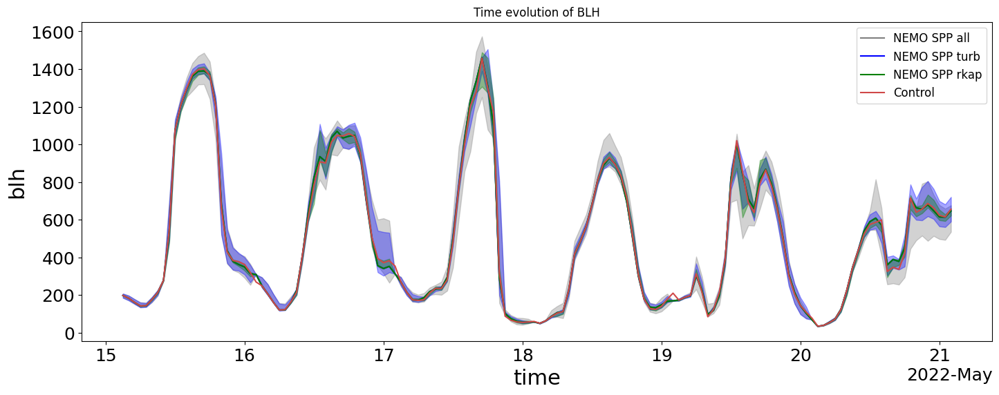

In [21]:
var = 'blh'
plot_exps = ['ctrl_49r2b']  # experiments to plot
plot_spp_exps = ['SPP_all','SPP_rkap','SPP_turb']
plt.figure(figsize=(17, 6))
for exp, _, exp_lab, color in nemo_exp_names:
    if exp not in plot_spp_exps:
        continue
    else:
        blh_nemo = IFS_nemo['cabauw']['srf'][exp][var]
        plt.fill_between(blh_nemo['time'], blh_nemo.min('number'), blh_nemo.max('number'), alpha=0.35, color=color)
        blh_nemo.sel(number=0).plot(c=color, label=f"NEMO {exp_lab}")
for exp, _, exp_lab, color in exp_names:
    if exp not in plot_exps:
        continue
    else:
        IFS['cabauw']['srf'][exp][var].plot(c=color, label=exp_lab)
plt.title(f'Time evolution of {var.upper()}')
plt.legend()
plt.show()


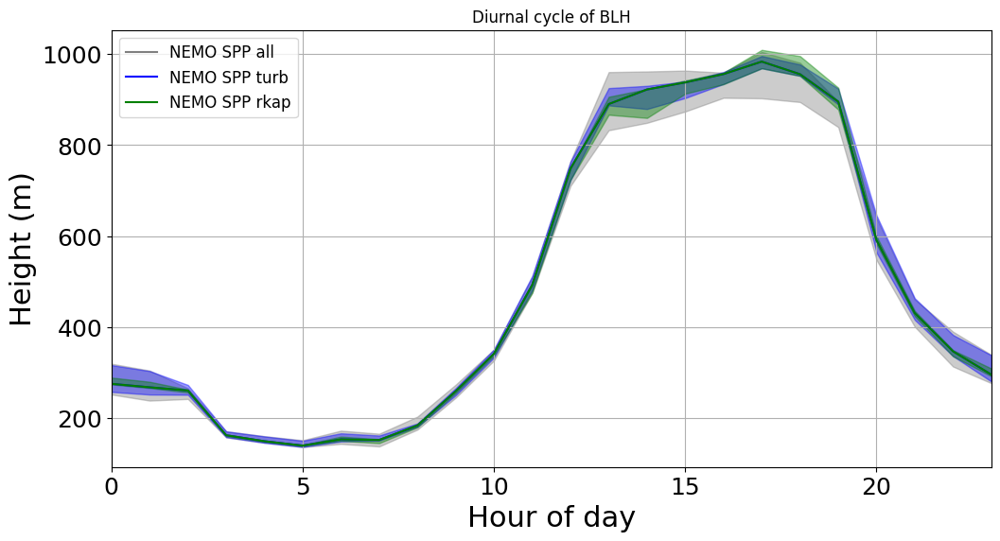

In [24]:
var = 'blh'
plot_exps = ['half_diffusion','ctrl_49r2b']  # experiments to plot
plot_exps = ['']  # experiments to plot
plot_spp_exps = ['SPP_turb','SPP_all','SPP_rkap']

plt.figure(figsize=(12, 6))
for exp, _, exp_lab, color in nemo_exp_names:
    if exp not in plot_spp_exps:
        continue
    else:
        hourly_nemo = IFS_nemo['cabauw']['srf'][exp][var].groupby('time.hour').mean('time')
        plt.fill_between(hourly_nemo['hour'], hourly_nemo.min('number'), hourly_nemo.max('number'), alpha=0.4,color=color)
        hourly_nemo.sel(number=0).plot(c=color, label=f"NEMO {exp_lab}")
for exp, _, exp_lab, color in exp_names:
    if exp not in plot_exps:
        continue
    else:
        IFS['cabauw']['srf'][exp][var].groupby('time.hour').mean('time').plot(c=color, label=exp_lab)
plt.grid()
plt.xlim(0, 23)
plt.ylabel('Height (m)')
plt.xlabel('Hour of day')
plt.title(f'Diurnal cycle of {var.upper()}')
plt.legend()
plt.show()

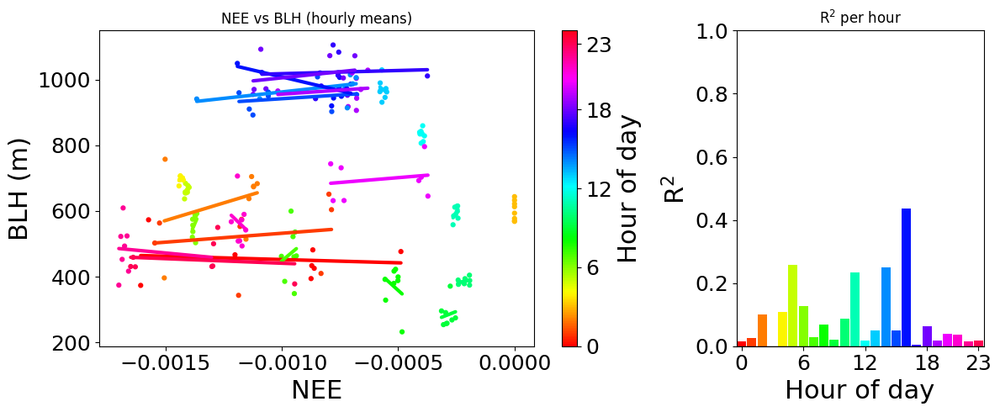

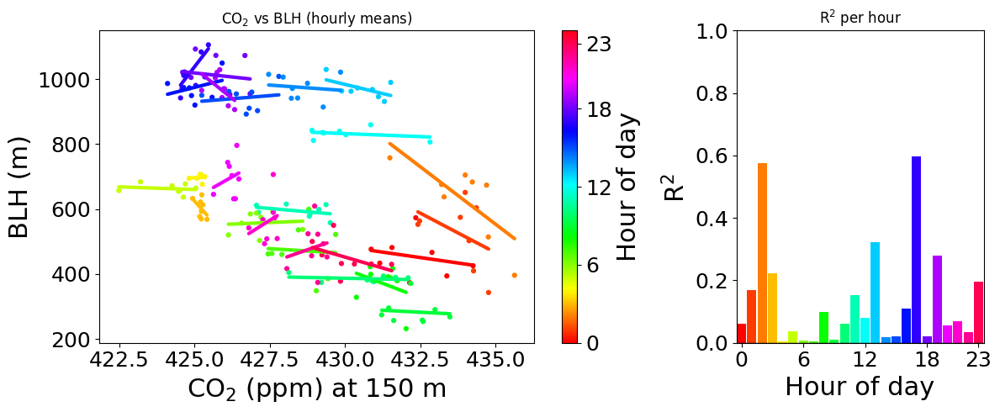

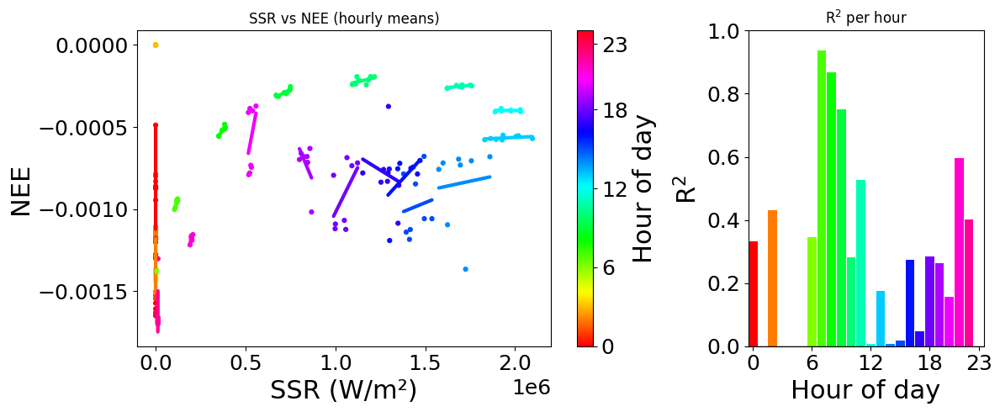

In [50]:
# correlation between NEE / CO2 and BLH (grouped by hour-of-day, colored by hour)

cmap = plt.get_cmap("hsv")  # cyclic
norm = mcolors.Normalize(vmin=0, vmax=24)  # make 0 and 24 the same color

nee = IFS_nemo['slab']['srf']['SPP_all']['aco2nee'].diff('time')
blh = IFS_nemo['slab']['srf']['SPP_all']['blh']
co2_150 = mfun.concentration_to_ppm('co2',IFS_nemo['slab']['z']['SPP_all']['co2'].sel(height=150, method='nearest'))
ssr = IFS_nemo['slab']['srf']['SPP_all']['ssr'].diff('time')

nee_hr = nee.groupby('time.hour').mean('time', skipna=True)
blh_hr = blh.groupby('time.hour').mean('time', skipna=True)
co2_hr = co2_150.groupby('time.hour').mean('time', skipna=True)
ssr_hr = ssr.groupby('time.hour').mean('time', skipna=True)

ssr_hr = ssr_hr.where(ssr_hr['hour'] != 3, 0)
nee_hr = nee_hr.where(nee_hr['hour'] != 3, 0)


# Reduce any leftover dims but KEEP ensemble member dim ('number') if present
keep_dims = {"hour", "number"}
for d in list(nee_hr.dims):
    if d not in keep_dims:
        nee_hr = nee_hr.mean(d, skipna=True)
for d in list(blh_hr.dims):
    if d not in keep_dims:
        blh_hr = blh_hr.mean(d, skipna=True)
for d in list(co2_hr.dims):
    if d not in keep_dims:
        co2_hr = co2_hr.mean(d, skipna=True)
for d in list(ssr_hr.dims):
    if d not in keep_dims:
        ssr_hr = ssr_hr.mean(d, skipna=True)

# Align shapes (broadcast if BLH has no 'number', etc.)
nee_hr, blh_hr = xr.broadcast(nee_hr, blh_hr)
co2_hr, blh_hr2 = xr.broadcast(co2_hr, blh_hr)
ssr_hr, blh_hr3 = xr.broadcast(ssr_hr, blh_hr)

hours = nee_hr["hour"].values

def _r2_per_hour(x_mat: np.ndarray, y_mat: np.ndarray) -> np.ndarray:
    """R^2 per hour from linear fit across ensemble members."""
    n_hours = x_mat.shape[1]
    r2 = np.full(n_hours, np.nan, dtype="float64")
    for ih in range(n_hours):
        xh = x_mat[:, ih]
        yh = y_mat[:, ih]
        m = np.isfinite(xh) & np.isfinite(yh)
        if m.sum() < 2:
            continue
        xh = xh[m]
        yh = yh[m]
        if float(np.std(yh)) == 0.0:
            continue
        if float(np.std(xh)) == 0.0:
            # no x-variation -> best fit is constant mean(y); R^2 = 0 by definition here
            r2[ih] = 0.0
            continue
        slope, intercept = np.polyfit(xh, yh, deg=1)
        yhat = slope * xh + intercept
        ss_res = float(np.sum((yh - yhat) ** 2))
        ss_tot = float(np.sum((yh - np.mean(yh)) ** 2))
        if ss_tot == 0.0:
            continue
        r2[ih] = 1.0 - (ss_res / ss_tot)
    return r2

def _scatter_and_trends(ax, x_da, y_da, title, xlabel, ylabel):
    if "number" in x_da.dims:
        x_mat = x_da.transpose("number", "hour").values
        y_mat = y_da.transpose("number", "hour").values
        x = x_mat.reshape(-1)
        y = y_mat.reshape(-1)
        c = np.tile(hours, x_da.sizes["number"])
    else:
        x_mat = x_da.values[None, :]
        y_mat = y_da.values[None, :]
        x = x_da.values
        y = y_da.values
        c = hours

    sc = ax.scatter(x, y, c=c, cmap=cmap, norm=norm, s=12)
    n_hours = x_mat.shape[1]
    for ih in range(n_hours):
        xh = x_mat[:, ih]
        yh = y_mat[:, ih]
        m = np.isfinite(xh) & np.isfinite(yh)
        if m.sum() < 2:
            continue
        xh = xh[m]
        yh = yh[m]
        x_min = float(np.min(xh))
        x_max = float(np.max(xh))
        if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
            continue
        slope, intercept = np.polyfit(xh, yh, deg=1)
        y_min = slope * x_min + intercept
        y_max = slope * x_max + intercept
        hour_val = float(hours[ih])
        ax.plot([x_min, x_max], [y_min, y_max], color=cmap(norm(hour_val)), lw=3, solid_capstyle="round")

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return sc, x_mat, y_mat

def _plot_scatter_plus_r2(x_da, y_da, title, xlabel, ylabel):
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"width_ratios": [2.2, 1]})
    sc, x_mat, y_mat = _scatter_and_trends(ax0, x_da, y_da, title, xlabel, ylabel)
    cb = fig.colorbar(sc, ax=ax0, ticks=[0, 6, 12, 18, 23])
    cb.set_label("Hour of day")

    r2 = _r2_per_hour(x_mat, y_mat)
    bar_colors = [cmap(norm(float(h))) for h in hours]
    ax1.bar(hours, r2, color=bar_colors, width=0.9)
    ax1.axhline(0, color="k", lw=1)
    ax1.set_ylim(0, 1)
    ax1.set_xlim(-0.5, 23.5)
    ax1.set_xticks([0, 6, 12, 18, 23])
    ax1.set_xlabel("Hour of day")
    ax1.set_ylabel("R$^2$ ")
    ax1.set_title("R$^2$ per hour")

    fig.tight_layout()
    return

# --- NEE vs BLH ---
_plot_scatter_plus_r2(nee_hr, blh_hr, "NEE vs BLH (hourly means)", "NEE", "BLH (m)")

# --- CO2 vs BLH ---
_plot_scatter_plus_r2(co2_hr, blh_hr2, "CO$_2$ vs BLH (hourly means)", "CO$_2$ (ppm) at 150 m", "BLH (m)")

# --- SSR vs NEE ---
_plot_scatter_plus_r2(ssr_hr, nee_hr, "SSR vs NEE (hourly means)", "SSR (W/m²)", "NEE")

In [ ]:
####################################

In [58]:
## needed for next plot
var = 'co2'
times = IFS['slab']['srf']['ctrl'].time
tot_tend_abl, conv_tend_abl, diff_tend_abl, dyn_tend_abl = [], [], [], []
tot_tend_blh,  conv_tend_blh,  diff_tend_blh,  dyn_tend_blh  = [], [], [], []
tot_tend_ft,  conv_tend_ft,  diff_tend_ft,  dyn_tend_ft  = [], [], [], []

correct_blh = 100

for it in times:
    it_blh = IFS['slab']['srf']['ctrl']['blh'].sel(time=it)

    tot_tend_abl.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_tot'].sel(time = it,
                                height=slice(0, max(0,it_blh-correct_blh))).mean('height'))
    tot_tend_blh.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_tot'].sel(time = it,
                                height=slice(max(0,it_blh-correct_blh),it_blh)).mean('height'))
    tot_tend_ft.append(IFS['slab']['z']['ctrl']
                       [f'd{var}dt_tot'].sel(time = it,
                                height=slice(it_blh+correct_blh, it_blh+500)).mean('height'))

    conv_tend_abl.append(IFS['slab']['z']['ctrl']
                         [f'd{var}dt_conv'].sel(time = it,
                                height=slice(0, max(0,it_blh-correct_blh))).mean('height'))
    conv_tend_blh.append(IFS['slab']['z']['ctrl']
                         [f'd{var}dt_conv'].sel(time = it,
                                height=slice(max(0,it_blh-correct_blh),it_blh)).mean('height'))
    conv_tend_ft.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_conv'].sel(time = it,
                                height=slice(it_blh+correct_blh, it_blh+500)).mean('height'))

    diff_tend_abl.append(IFS['slab']['z']['ctrl']
                         [f'd{var}dt_diff'].sel(time = it,
                                height=slice(0, max(0,it_blh-correct_blh))).mean('height'))
    diff_tend_blh.append(IFS['slab']['z']['ctrl']
                         [f'd{var}dt_diff'].sel(time = it,
                                height=slice(max(0,it_blh-correct_blh),it_blh)).mean('height'))
    diff_tend_ft.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_diff'].sel(time = it,
                                height=slice(it_blh+correct_blh, it_blh+500)).mean('height'))

    dyn_tend_abl.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_dyn'].sel(time = it,
                                height=slice(0, max(0,it_blh-correct_blh))).mean('height'))
    dyn_tend_blh.append(IFS['slab']['z']['ctrl']
                        [f'd{var}dt_dyn'].sel(time = it,
                                height=slice(max(0,it_blh-correct_blh),it_blh)).mean('height'))
    dyn_tend_ft.append(IFS['slab']['z']['ctrl']
                       [f'd{var}dt_dyn'].sel(time = it,
                                height=slice(it_blh+correct_blh, it_blh+500)).mean('height'))

# concatenate over time
tot_tend_abl = xr.concat(tot_tend_abl, dim=times)
conv_tend_abl = xr.concat(conv_tend_abl, dim=times)
diff_tend_abl = xr.concat(diff_tend_abl, dim=times)
dyn_tend_abl  = xr.concat(dyn_tend_abl,  dim=times)

tot_tend_blh = xr.concat(tot_tend_blh, dim=times)
conv_tend_blh = xr.concat(conv_tend_blh, dim=times)
diff_tend_blh = xr.concat(diff_tend_blh, dim=times)
dyn_tend_blh  = xr.concat(dyn_tend_blh,  dim=times)

tot_tend_ft = xr.concat(tot_tend_ft, dim=times)
conv_tend_ft = xr.concat(conv_tend_ft, dim=times)
diff_tend_ft = xr.concat(diff_tend_ft, dim=times)
dyn_tend_ft  = xr.concat(dyn_tend_ft,  dim=times)

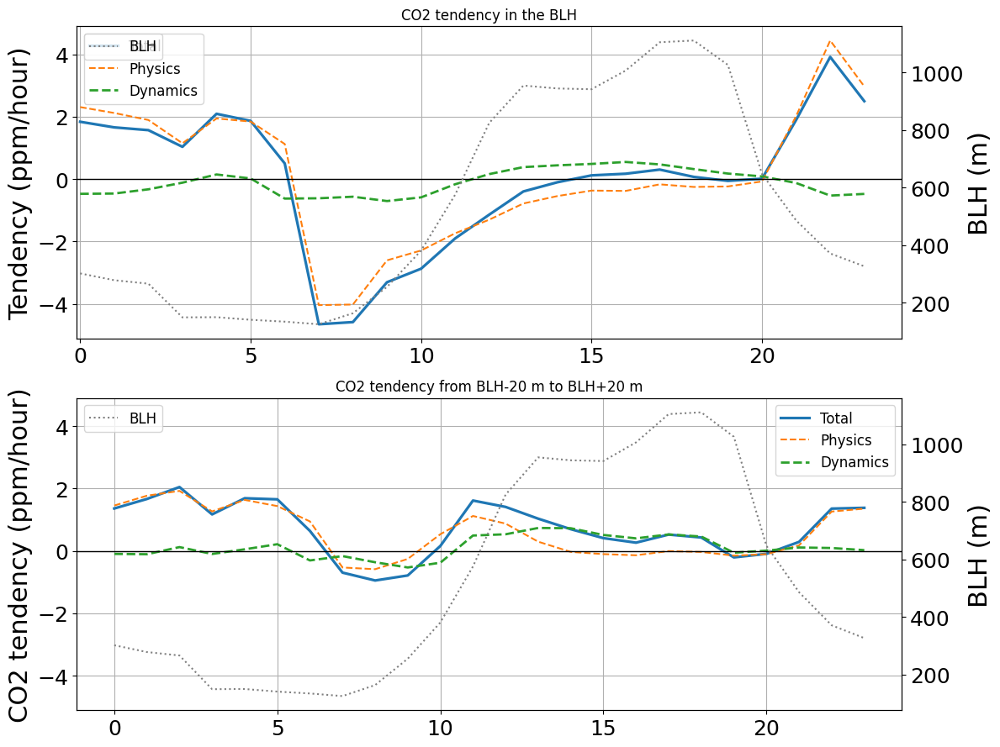

In [60]:
# Needs previous cell
# plot
fig, axs = plt.subplots(2, 1, figsize=(12,9), sharey=True)

# BLH
ax = axs[0]
tot_tend_abl.groupby('time.hour').mean().plot(ax=ax, label='Total', lw=2.3)
(diff_tend_abl + conv_tend_abl).groupby('time.hour').mean().plot(ax=ax, label='Physics', ls='--')
# diff_tend_abl.groupby('time.hour').mean().plot(ax=ax, label='Diffusion', ls='--',lw =2)
# conv_tend_abl.groupby('time.hour').mean().plot(ax=ax, label='Convection', ls='--',lw =2)
dyn_tend_abl.groupby('time.hour').mean().plot(ax=ax, label='Dynamics', ls='--',lw =2)
ax.set_title('CO2 tendency in the BLH')
ax.set_ylabel('Tendency (ppm/hour)')
ax.set_xlabel('')
ax.axhline(0, color='k', lw=1)
ax.legend(); ax.grid()
ax.set_xlim(-0.1,24.1)

# BLH±20
ax = axs[1]
tot_tend_blh.groupby('time.hour').mean().plot(ax=ax, label='Total', lw=2.3)
(diff_tend_blh + conv_tend_blh).groupby('time.hour').mean().plot(ax=ax, label='Physics', ls='--')
# diff_tend_blh.groupby('time.hour').mean().plot(ax=ax, label='Diffusion', ls='--',lw =2)
# conv_tend_blh.groupby('time.hour').mean().plot(ax=ax, label='Convection', ls='--',lw =2)
dyn_tend_blh.groupby('time.hour').mean().plot(ax=ax, label='Dynamics', ls='--',lw =2)
ax.set_title('CO2 tendency from BLH-20 m to BLH+20 m')
ax.set_ylabel('CO2 tendency (ppm/hour)')
ax.set_xlabel('')
ax.axhline(0, color='k', lw=1)
ax.legend(); ax.grid()

# # BLH–BLH+500
# ax = axs[1]
# tot_tend_ft.groupby('time.hour').mean().plot(ax=ax, label='Total', lw=2)
# (diff_tend_ft + conv_tend_ft).groupby('time.hour').mean().plot(ax=ax, label='Physics', ls='--')
# # diff_tend_ft.groupby('time.hour').mean().plot(ax=ax, label='Diffusion', ls='--')
# # conv_tend_ft.groupby('time.hour').mean().plot(ax=ax, label='Convection', ls='--')
# dyn_tend_ft.groupby('time.hour').mean().plot(ax=ax, label='Dynamics', ls='--')
# ax.set_title('CO2 tendency from BLH to BLH+500 m')
# ax.set_ylabel('Tendency (ppm/hour)')
# ax.set_xlabel('Hour of day')
# ax.axhline(0, color='k', lw=1)
# ax.legend(); ax.grid()
# ax.set_xlim(-0.1,24.1)


# on secondry y-axis, plot the mean BLH diurnal cycle
for iax in range(2):
    ax2 = axs[iax].twinx()
    mean_blh = IFS['slab']['srf']['ctrl']['blh'].groupby('time.hour').mean()
    mean_blh.plot(ax=ax2, color='grey', ls=':',lw  =1.5, label='BLH') 
    ax2.set_ylabel('BLH (m)')
    ax2.legend(loc='upper left', fontsize=12)

plt.tight_layout()
plt.show()


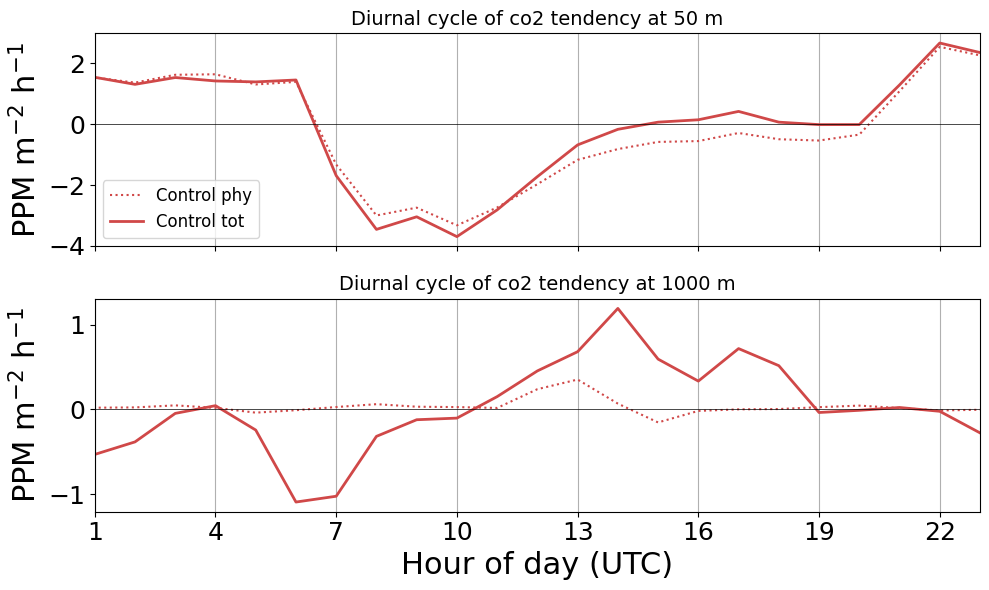

In [ ]:
### Diurnal cycle of CO₂ fluxes at Cabauw ###
heights = [50, 1000]   # heights in metres
plot_exps = ['ctrl',]       # experiments to plot
var = 'co2'
plot_flx = False
plot_tend =True

fig, axes = plt.subplots(len(heights), 1, figsize=(10, 3*len(heights)), sharex=True)

if len(heights) == 1:
    axes = [axes]

for i, h in enumerate(heights):
    ax = axes[i]

    for exp, exp_longname, label, color in exp_names:
        if exp not in plot_exps:
            continue

        ds = IFS['slab']['z'][exp]

        # select height
        if plot_flx:
            conv = ds[f'{var}flx_conv'].sel(height=h, method='nearest')
            diff = ds[f'{var}flx_diff'].sel(height=h, method='nearest')
            dyn  = ds[f'{var}flx_dyn'].sel(height=h, method='nearest')
            tot  = conv + diff + dyn
        elif plot_tend:
            conv = ds[f'd{var}dt_conv'].sel(height=h, method='nearest')
            diff = ds[f'd{var}dt_diff'].sel(height=h, method='nearest')
            dyn  = ds[f'd{var}dt_dyn'].sel(height=h, method='nearest')
            tot  = conv + diff + dyn
            

        # --- group by hour of day ---
        conv_diurnal = conv.groupby('time.hour').mean()
        diff_diurnal = diff.groupby('time.hour').mean()
        dyn_diurnal  = dyn.groupby('time.hour').mean()
        tot_diurnal  = tot.groupby('time.hour').mean()
        phy_diurnal  = (conv+diff).groupby('time.hour').mean()

        # plot
        phy_diurnal.plot(ax=ax, label=f'{label} phy', color=color, linestyle=':', lw=1.5)
        # conv_diurnal.plot(ax=ax, label=f'{label} conv', color=color, linestyle=':', lw=1.5)
        # diff_diurnal.plot(ax=ax, label=f'{label} diff', color=color, linestyle='--', lw=2)
        # dyn_diurnal.plot(ax=ax, label=f'{label} dyn', color=color, linestyle='--', lw=1.5)
        tot_diurnal.plot(ax=ax, label=f'{label} tot', color=color, linestyle='-', lw=2)

    ax.axhline(0, c='k', lw=0.5)
    unit_flx = ds[f'{var}flx_conv'].attrs.get("units", "")
    ax.set_ylabel(unit_flx)
    if plot_flx:
        ax.set_title(f'Diurnal cycle of {var} fluxes at {h} m', fontsize=14)
    elif plot_tend:
        ax.set_title(f'Diurnal cycle of {var} tendency at {h} m', fontsize=14)

    ax.grid(axis='x')
    ax.set_xlabel("")
    ax.set_xticks(range(1,24,3))  # ticks every 3 hours
    # ax.set_ylim(-0.003, 0.005)
    ax.set_xlim(1, 23)

    if i == 0:
        ax.legend(fontsize=12)
ax.set_xlabel("Hour of day (UTC)")

plt.tight_layout()
plt.show()

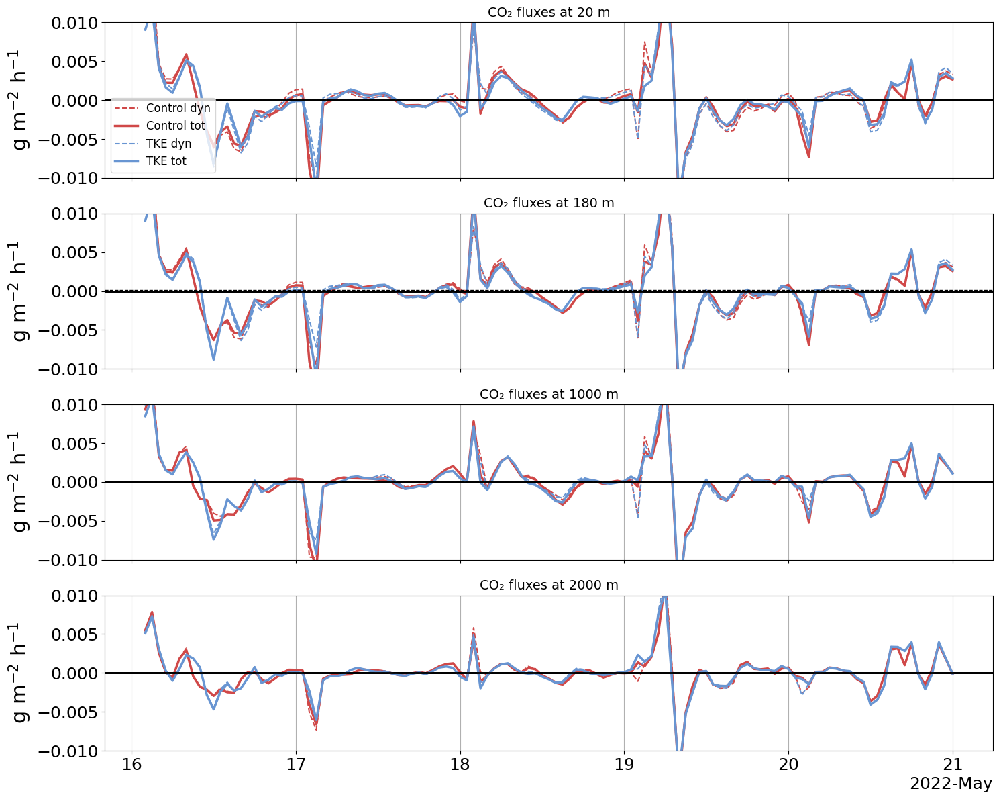

In [ ]:
### Time evolution of CO₂ fluxes at Cabauw ###
heights = [20,180, 1000, 2000]   # heights in metres
plot_exps = ['ctrl','TKE']    # experiments to plot
var = 'co2'

fig, axes = plt.subplots(len(heights), 1, figsize=(15, 3*len(heights)), sharex=True)

if len(heights) == 1:
    axes = [axes]

for i, h in enumerate(heights):
    ax = axes[i]

    for ii, (exp, exp_longname, label,color) in enumerate(exp_names):
        if exp not in plot_exps:
            continue

        ds = IFS['slab']['z'][exp]

        # --- CO₂ fluxes at chosen height ---
        # ds[f'{var}flx_conv'].sel(height=h, method='nearest').plot(
        #     x='time', ax=ax, label=f'{label} conv', color=color, linestyle='-', lw=2
        # )
        # ds[f'{var}flx_diff'].sel(height=h, method='nearest').plot(
        #     x='time', ax=ax, label=f'{label} diff', color=color, linestyle='--', lw=2
        # )
        ds[f'{var}flx_dyn'].sel(height=h, method='nearest').plot(
            x='time', ax=ax, label=f'{label} dyn', color=color, linestyle='--', lw=1.5
        )
        (ds[f'{var}flx_conv']+ds[f'{var}flx_diff']+ds[f'{var}flx_dyn']).sel(height=h, method='nearest').plot(
            x='time', ax=ax, label=f'{label} tot', color=color, linestyle='-', lw=2.5
        )
    

    # # --- Add observations where available ---
    # if h == 20 and 'WC005' in obs_tower_flx_roll:
    #     (mfun.concentration_to_ppm('co2',obs_tower_flx_roll['WC005']/10000000)).plot(
    #         x='time', ax=ax, color='black', lw=2, label='OBS 5m'
    #     )
    # if h == 100 and 'WC100' in obs_tower_flx_roll:
    #     (mfun.concentration_to_ppm('co2',obs_tower_flx_roll['WC100']/10000000)).plot(
    #         x='time', ax=ax, color='black', lw=2, label='OBS 60m'
    #     )
    # if h == 180 and 'WC180' in obs_tower_flx_roll:
    #     (mfun.concentration_to_ppm('co2',obs_tower_flx_roll['WC180']/10000000)).plot(
    #         x='time', ax=ax, color='black', lw=2, label='OBS 180m'
    #     )
    # Styling
    ax.axhline(0, c='k', lw=0.5)
    unit_flx = ds[f'{var}flx_conv'].attrs.get("units", "")
    ax.set_ylabel(unit_flx)
    ax.set_title(f'CO₂ fluxes at {h} m', fontsize=14)
    ax.grid(axis='x')
    ax.set_xlabel("")
    ax.set_ylim(-0.01, 0.01)

    if i == 0:
        ax.legend(fontsize=12)

# common x-label
# axes[-1].set_xlabel("Time")

plt.tight_layout()
plt.show()

In [24]:
var = 'blh'
plot_exps = ['ctrl_49r2b', '9km_49r2b', 'half_diff_stable']


ctrl_var = IFS['slab']['srf'][plot_exps[0]][var]


fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
for exp, exp_longname, label, color in exp_names:
    if exp not in plot_exps:
        continue
    grouped = IFS['slab']['srf'][exp][var].groupby('time.hour')
    grouped_norm = (IFS['slab']['srf'][exp][var] / ctrl_var).groupby('time.hour')
    diurnal = grouped.mean()
    diurnal_norm = grouped_norm.mean()
    # Panel 1: absolute values
    axes[0].plot(diurnal, label=exp, color=color)

# Formatting
axes[0].set_title(f"Diurnal cycle of {var}")
axes[1].set_title(f"Normalised diurnal cycle of {var}")
for ax in axes:
    ax.grid()

axes[0].legend()
axes[1].legend()
plt.xlabel("Hour of day")
plt.tight_layout()

[('ctrl_49r2b', 'iyw7_ctrl_49r2b', 'Control', '#D04848'),
 ('9km_49r2b', 'j1rw_9km_49r2b', 'tco1279', '#07AD78'),
 ('half_diffusion', 'j1kz_half_ZCFC_everywhere_49r2b', '0.5 diff', '#6895D2'),
 ('half_diff_stable',
  'j1m9_half_ZCFC_everywhere_stable',
  '0.5 diff, stable',
  '#F3B95F')]

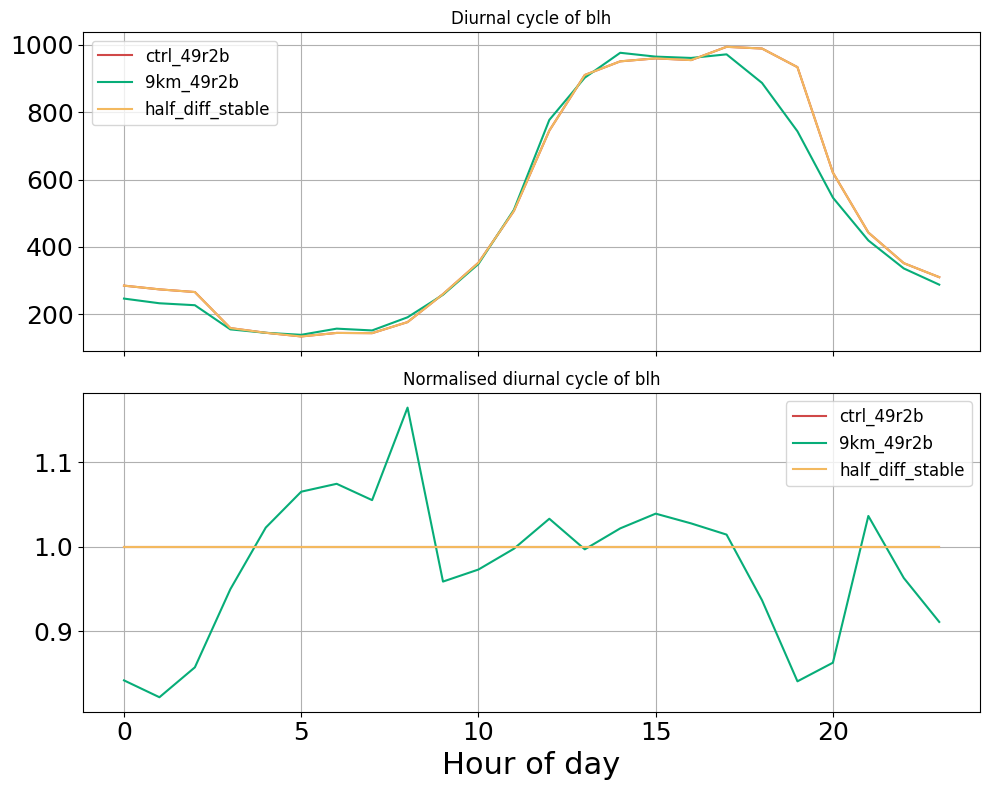

In [27]:
var = 'blh'
plot_exps = ['ctrl_49r2b', '9km_49r2b', 'half_diff_stable']

ctrl_var = IFS['slab']['srf'][plot_exps[0]][var]


fig, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
for exp, exp_longname, label, color in exp_names:
    if exp not in plot_exps:
        continue
    grouped = IFS['slab']['srf'][exp][var].groupby('time.hour')
    grouped_norm = (IFS['slab']['srf'][exp][var] / ctrl_var).groupby('time.hour')
    diurnal = grouped.mean()
    diurnal_norm = grouped_norm.mean()
    # Panel 1: absolute values
    axes[0].plot(diurnal, label=exp, color=color)
    # Panel 2: normalised values
    axes[1].plot(diurnal_norm, label=exp, color=color)

# Formatting
axes[0].set_title(f"Diurnal cycle of {var}")
axes[1].set_title(f"Normalised diurnal cycle of {var}")
for ax in axes:
    ax.grid()

axes[0].legend()
axes[1].legend()
plt.xlabel("Hour of day")
plt.tight_layout()



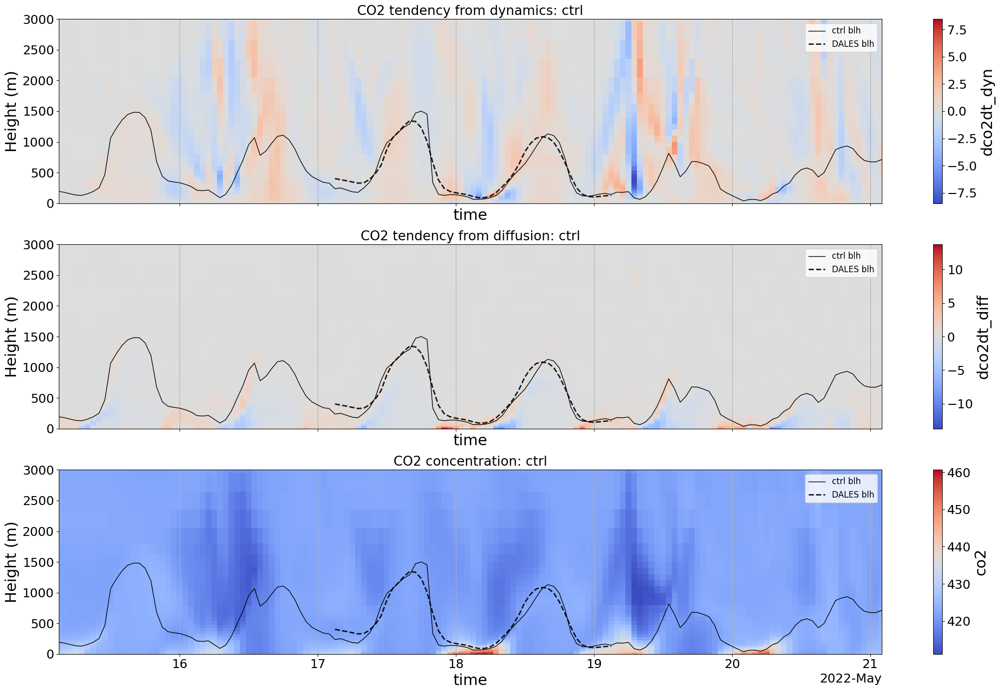

In [32]:
#####   3D fields of experiments  #####
##############################################
# Experiments to compare
exp = 'ctrl'
location ='cabauw'

# Variables to plot: (variable_name, plot title)
vars_to_plot = [
    ('dco2dt_dyn',  'CO2 tendency from dynamics'),
    # ('dco2dt_conv', 'CO2 tendency from convection'),
    ('dco2dt_diff', 'CO2 tendency from diffusion'),
    ('co2', 'CO2 concentration'),
    # ('clwc', 'cloud liquid water'),
    # ('T', 'Temperature'),
]

# Colormap limits (set to None for automatic scaling)
vmin = None
vmax = None

# Create a figure with rows equal to number of variables
fig, axes = plt.subplots(nrows=len(vars_to_plot), ncols=1, figsize=(22, len(vars_to_plot)*4+2), sharex=True)

# Make sure axes is always iterable
if len(vars_to_plot) == 1:
    axes = [axes]

# Loop through each variable
for ax, (var, title) in zip(axes, vars_to_plot):
    data = IFS[location]['z'][exp][var]
    # Plot 
    data.plot(
        ax=ax,
        y='height',
        cmap='coolwarm',
        vmin=vmin,
        vmax=vmax
    )

    # Add boundary layer height lines for both experiments
    IFS[location]['srf'][exp]['blh'].plot(ax=ax, x='time', c='k', lw=1, label=f'{exp} blh')
    # blh from DALES
    pblh.plot(ax=ax,x='time',label='DALES blh',lw=2,ls='--',c='k',alpha=0.9)

    # Formatting
    ax.set_ylim(0, 3000)
    ax.set_xlim(
        datetime.datetime.strptime(str_time, "%Y-%m-%dT%H:%M"),
        datetime.datetime.strptime(end_time, "%Y-%m-%dT%H:%M")
    )
    ax.set_ylabel('Height (m)')
    ax.set_title(f'{title}: {exp}', fontsize=19)
    ax.legend()
    ax.grid(axis='x')

# Adjust layout for readability
plt.tight_layout()


Text(0.5, 1.0, 'CO2 flux from convection')

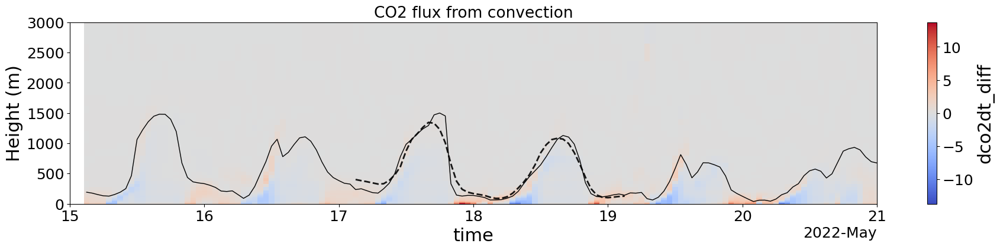

In [90]:

# var = 'co2' 
var = 'dco2dt_diff'
str_time = '2022-05-15'
end_time = '2022-05-21'
plt.figure(figsize=(22,4))
(IFS['cabauw']['z']['ctrl'][var]).plot( y='height',
                               cmap='coolwarm',
                # vmin=-3, vmax=3
                )
IFS['cabauw']['srf']['ctrl']['blh'].plot(x='time',c='k',lw=1)

# blh from DALES
pblh.plot(x='time',label='DALES',lw=2,ls='--',c='k',alpha=0.9)


plt.ylim((0,3000))
plt.xlim((datetime.datetime.strptime(str_time, "%Y-%m-%d"),datetime.datetime.strptime(end_time, "%Y-%m-%d")))
plt.ylabel('Height (m)')
# plt.title('CO2 concentration: dryMF - control',fontsize = 19)
plt.title('CO2 flux from convection',fontsize = 19)

## Terms for concentration 

$ C = C_0^{FT} + \frac{\overline{w'c_s'}}{h} + \frac{\gamma_c}{2h} (h-h_0)^2 + (C_0 - C_0^{FT})\frac{h_0}{h} + ADVECTION + CONVECTION$

$ C - C_0^{FT}=  \frac{\overline{w'c_s'}}{h} \Delta{t} + \frac{\gamma_c}{2h} (h-h_0)^2 + (C_0 - C_0^{FT})\frac{h_0}{h} $

In [25]:
# units: PPM
# Surface term should be integrated over time 
exp = 'ctrl'
times = IFS['slab']['z'][exp]['time']
times_night = times.sel(time=slice('2022-05-15T04:00', '2022-05-15T06:00'))



# Get references for convenience
co2 = IFS['slab']['z'][exp]['co2']
blh = IFS['slab']['srf'][exp]['blh']
# Prepare empty arrays with same time coordinate
C = xr.zeros_like(times, dtype=float).rename('C')
C_FT = xr.zeros_like(times, dtype=float).rename('C_FT')
C_h = xr.zeros_like(times, dtype=float).rename('C_h')

for it in IFS['slab']['z']['ctrl']['time']:
    # extract scalar blh for this time
    blh_t = blh.sel(time=it)
   
    # C: mean concentration in the boundary layer
    C.loc[dict(time=it)] = co2.sel(
        time=it,
        height=slice(0, blh_t)
    ).mean('height')

    # C_FT: concentration 100 m above the BL top
    C_FT.loc[dict(time=it)] = co2.sel(
        time=it,
        height=blh_t + 100,
        method='nearest'
    )

    # C_h: concentration at the BL top
    C_h.loc[dict(time=it)] = co2.sel(
        time=it,
        height=blh_t,
        method='nearest'
    )

h   = blh

# ---- Post-processing ----
# C_0    = C.shift(time=1)
# C_0_FT = C_FT.shift(time=1)
# h_0 = h.shift(time=1)
C_0 = C.sel(time=slice(times_night[0],times_night[-1])).mean('time')
C_0_FT = C_FT.sel(time=slice(times_night[0],times_night[-1])).mean('time')
h_0 = h.sel(time=slice(times_night[0],times_night[-1])).mean('time')


# surface flux (NEE + antropogenic fluxes)
# NEE and antropogenic should have been divided by rho before converting to PPM (see first processing step)
ds = IFS['slab']['srf'][exp]
ds = ds.sel(time=~ds['time'].to_index().duplicated())
cw_s = (-ds['fco2nee']) + mfun.concentration_to_ppm('co2', input['co2_antrop_emission'])

# integrate over time to get ppm
srf_term = cw_s / h.sel(time=~h['time'].to_index().duplicated()) * 3600  # ppm
# gamma_c = gradient of CO2 concentration above the boundary layer (PPM/m)
gamma_c = (C_FT - C_h) / 100  # PPM/m
bl_growth_term = gamma_c / (2 * h) * (h - h_0)**2

# initial profile term
profile_term = (C_0 - C_0_FT) * (h_0 / h)




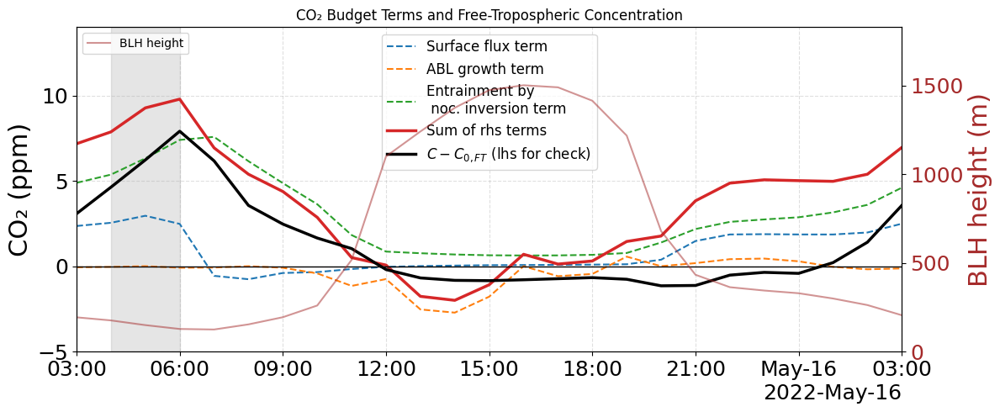

In [72]:
# compute total tendency term
sum_terms = srf_term.sel(time=~srf_term['time'].to_index().duplicated()) + \
            bl_growth_term.sel(time=~bl_growth_term['time'].to_index().duplicated()) +\
            profile_term.sel(time=~profile_term['time'].to_index().duplicated()) # + C_0_FT 

# create figure and axes
fig, ax = plt.subplots(figsize=(12, 5))

# plot each contribution
srf_term.plot(ax=ax, label='Surface flux term', color='tab:blue', linestyle='--')
bl_growth_term.plot(ax=ax, label='ABL growth term', color='tab:orange', linestyle='--')
profile_term.plot(ax=ax, label='Entrainment by \n noc. inversion term', color='tab:green', linestyle='--')
# C_0_FT.plot(ax=ax, label=r'$C_{0,FT}$', color='tab:pink', linestyle='--')

# plot the sum of the three terms
sum_terms.plot(ax=ax, label='Sum of rhs terms', color='tab:red', linewidth=2.5)

(C - C_0_FT ).plot(ax=ax, label=r'$C - C_{0,FT}$ (lhs for check)', color='k', linestyle='-',lw=2.5)
# (C - C_0_FT - profile_term ).plot(ax=ax, label=r"$C - C_{0,FT}$ - Initial profile term (lhs for check)", color='k', linestyle='-',lw=1.3)

# shaded vertical areas for night periods (between min times_night and max times_night)
ax.axvspan(times_night[0].values, times_night[-1].values, color='gray', alpha=0.2)

# plot h on secondary y-axis
ax2 = ax.twinx()
h.plot(ax=ax2, color='brown', linestyle='-', label='BLH height',alpha=0.5)
ax2.set_ylabel('BLH height (m)', color='brown')
ax2.tick_params(axis='y', labelcolor='brown')
# set limits and labels for ax2
ax2.set_ylim(0, h.max().values * 1.2)
ax2.legend(loc='upper left', fontsize=10)

# style
ax.set_title('CO₂ Budget Terms and Free-Tropospheric Concentration')
ax.set_ylabel('CO₂ (ppm)')
ax.set_xlabel('')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.4)
ax.set_ylim(-5, 14)
# ax.set_xlim(t0 , t0+ timedelta(hours=24*4) )
ax.set_xlim(t0 + timedelta(hours=24*0) , t0+ timedelta(hours=24*1) )
ax.axhline(0,color='k', linewidth=1)

plt.tight_layout()
plt.show()


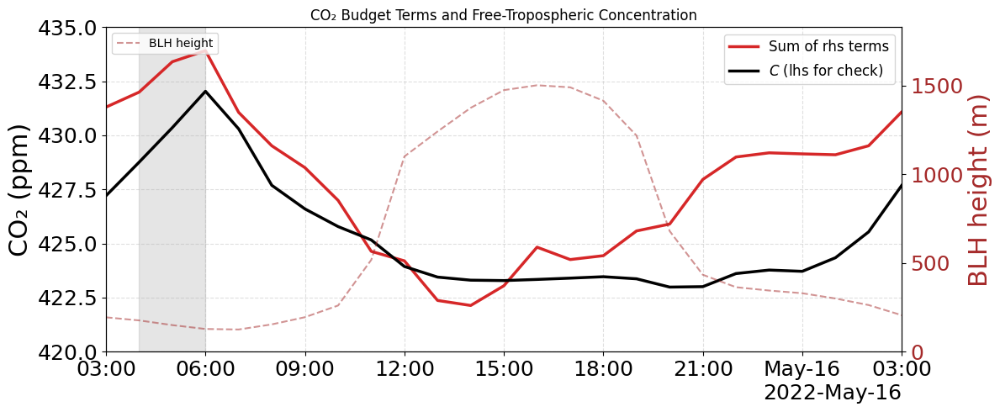

In [34]:
# compute total tendency term
sum_terms = srf_term.sel(time=~srf_term['time'].to_index().duplicated()) + \
            bl_growth_term.sel(time=~bl_growth_term['time'].to_index().duplicated()) +\
            profile_term.sel(time=~profile_term['time'].to_index().duplicated()) + C_0_FT 

# create figure and axes
fig, ax = plt.subplots(figsize=(12, 5))

# plot each contribution
# srf_term.plot(ax=ax, label='Surface flux term', color='tab:blue', linestyle='--')
# bl_growth_term.plot(ax=ax, label='ABL growth term', color='tab:orange', linestyle='--')
# profile_term.plot(ax=ax, label='Entrainment by \n noc. inversion term', color='tab:green', linestyle='--')
# C_0_FT.plot(ax=ax, label=r'$C_{0,FT}$', color='tab:pink', linestyle='--')

# plot the sum of the three terms
sum_terms.plot(ax=ax, label='Sum of rhs terms', color='tab:red', linewidth=2.5)

(C).plot(ax=ax, label=r'$C$ (lhs for check)', color='k', linestyle='-',lw=2.5)
# (C - C_0_FT - profile_term ).plot(ax=ax, label=r"$C - C_{0,FT}$ - Initial profile term (lhs for check)", color='k', linestyle='-',lw=1.3)

# shaded vertical areas for night periods (between min times_night and max times_night)
ax.axvspan(times_night[0].values, times_night[-1].values, color='gray', alpha=0.2)

# plot h on secondary y-axis
ax2 = ax.twinx()
h.plot(ax=ax2, color='brown', linestyle='--', label='BLH height',alpha=0.5)
ax2.set_ylabel('BLH height (m)', color='brown')
ax2.tick_params(axis='y', labelcolor='brown')
# set limits and labels for ax2
ax2.set_ylim(0, h.max().values * 1.2)
ax2.legend(loc='upper left', fontsize=10)

# style
ax.set_title('CO₂ Budget Terms and Free-Tropospheric Concentration')
ax.set_ylabel('CO₂ (ppm)')
ax.set_xlabel('')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.4)
ax.set_ylim(420, 435)
# ax.set_xlim(t0 , t0+ timedelta(hours=24*4) )
ax.set_xlim(t0 + timedelta(hours=24*0) , t0+ timedelta(hours=24*1) )
# ax.axhline(0,color='k', linewidth=1)

plt.tight_layout()
plt.show()


In [56]:
# Duplicate-safe CSV → xarray loader for Loobos aircraft CO2 (hardened parsing)
import pandas as pd
import xarray as xr
import numpy as np

def _to_numeric_strict(series: pd.Series) -> pd.Series:
    # Convert to string, strip, normalize decimal commas, and extract numeric substring
    s = series.astype(str).str.strip()
    s = s.replace({"": np.nan, "nan": np.nan, "NaN": np.nan})
    s = s.str.replace(",", ".", regex=False)
    # Extract numbers including optional sign and scientific notation
    s_num = s.str.extract(r"([-+]?\d*\.?\d+(?:[eE][-+]?\d+)?)", expand=False)
    return pd.to_numeric(s_num, errors="coerce")

def csv_to_xarray_unique(path: str, agg: str = "mean") -> xr.Dataset:
    """
    Read a CSV where:
      - Row 1 is header
      - Col 1 ignored
      - Col 2 is date (dimension 'date')
      - Col 3 is height Alt (dimension 'Alt')
      - Col 4 is the data variable (uses its header as the variable name)
    Aggregates duplicate (date, Alt) pairs to ensure a unique MultiIndex.

    Parameters
    ----------
    path : str
        Path to the CSV file.
    agg : str
        Aggregation for duplicates: one of {'mean','median','first','last'}.

    Returns
    -------
    xr.Dataset
        Dataset with dims ('date','Alt') and a single variable.
    """
    # Read full CSV to keep the real header names
    df = pd.read_csv(path, header=0)
    var_name = df.columns[3]

    # Keep only columns 2,3,4 and normalize names
    df = df.iloc[:, [1, 2, 3]].copy()
    df.columns = ['date', 'Alt', var_name]

    # Parse date
    df['date'] = pd.to_datetime(df['date'], errors='coerce')

    # Robust numeric parsing for Alt and variable
    alt_num = pd.to_numeric(df['Alt'], errors='coerce')
    if alt_num.isna().all():
        alt_num = _to_numeric_strict(df['Alt'])
    df['Alt'] = alt_num

    val_num = pd.to_numeric(df[var_name], errors='coerce')
    if val_num.isna().all():
        val_num = _to_numeric_strict(df[var_name])
    df[var_name] = val_num

    # Drop rows with missing dimension coords
    df = df.dropna(subset=['date', 'Alt'])

    # Aggregate duplicates to ensure unique (date, Alt) pairs
    gb = df.groupby(['date', 'Alt'])[var_name]
    if agg == 'mean':
        s = gb.mean()
    elif agg == 'median':
        s = gb.median()
    elif agg == 'first':
        s = gb.first()
    elif agg == 'last':
        s = gb.last()
    else:
        raise ValueError("Unsupported agg; choose from 'mean','median','first','last'.")

    # Convert aggregated Series (unique MultiIndex) to xarray
    da = s.to_xarray()
    ds = da.to_dataset(name=var_name)
    return ds

# Quick test on the provided file + summary of non-NaN count
csv_path = "/perm/paaa/observations/Loobos/Loobos_Aircraft_co2_mol.csv"
ds_co2 = csv_to_xarray_unique(csv_path, agg='mean')
varname = list(ds_co2.data_vars)[0]
print(f"Loaded variable: {varname}")
print("Non-NaN values:", int(ds_co2[varname].count()))
ds_co2

Loaded variable: CO2_7815
Non-NaN values: 11163


<xarray.Dataset> Size: 997MB
Dimensions:   (date: 11163, Alt: 11163)
Coordinates:
  * date      (date) datetime64[ns] 89kB 2022-05-17T06:30:47 ... 2022-05-18T1...
  * Alt       (Alt) float64 89kB 3.916 3.922 3.938 ... 1.972e+03 1.972e+03
Data variables:
    CO2_7815  (date, Alt) float64 997MB nan nan nan nan nan ... nan nan nan nan

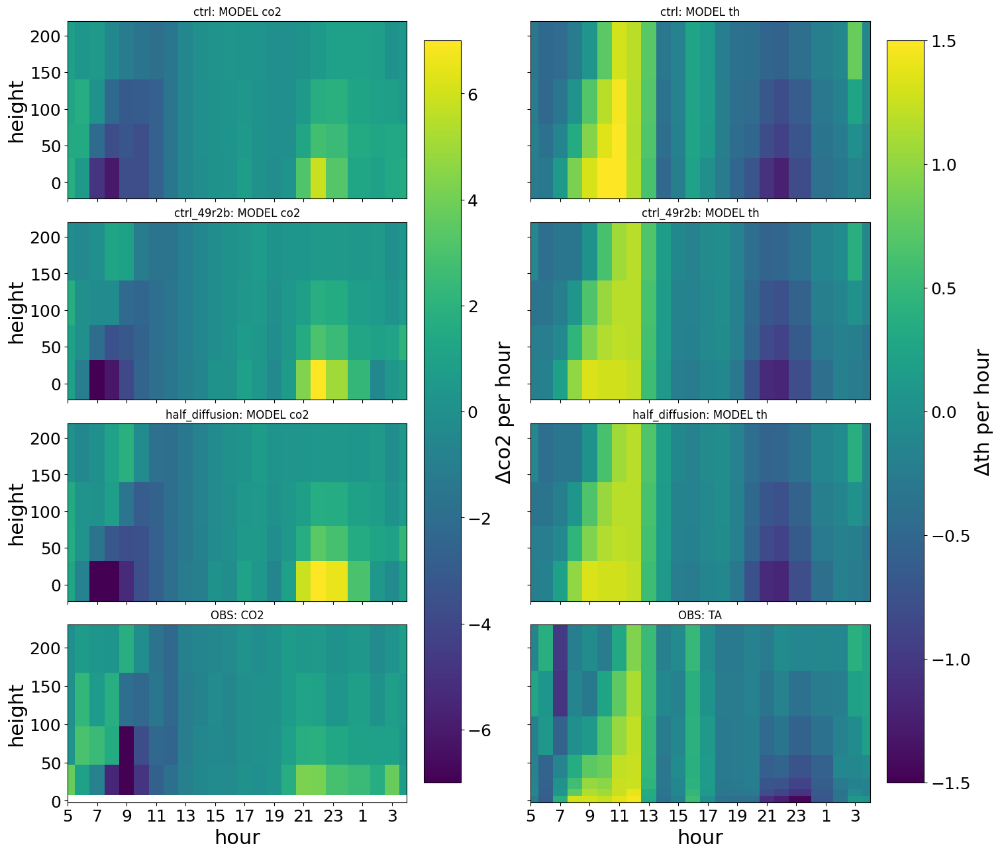

In [97]:

## Plot theta and co2 temporal variation at cabauw tower heights (multi-experiment)
var1 = 'co2'
var2 = 'th'

# Experiments to plot (one row per experiment)
plot_exps = ['ctrl','ctrl_49r2b', 'half_diffusion']  # <- edit this list

heights_tower = [27, 67, 127, 207]  # obs heights [m]
heights_model = [5, 60, 100, 180]    # model heights [m]

hour0 = 5  # start hour on x-axis

def _shift_hour_axis(da: xr.DataArray) -> xr.DataArray:
    hour_shifted = xr.where(da['hour'] < hour0, da['hour'] + 24, da['hour'])
    return da.assign_coords(hour_shifted=hour_shifted).sortby('hour_shifted')

def _resolve_model_var(ds: xr.Dataset, var_name: str) -> tuple[str, str]:
    if var_name in ds:
        return var_name, var_name
    aliases = {
        'theta': 'th',  # potential temperature name in IFS output
    }
    if var_name in aliases and aliases[var_name] in ds:
        return aliases[var_name], f"{var_name} ({aliases[var_name]})"
    raise KeyError(f"Model variable '{var_name}' not found; available: {list(ds.data_vars)[:15]} ...")

# --- Observations (bottom row, computed once) ---
ds_obs_co2 = ds_cabauw['Cabauw_CO2_May2022']
co2_vars = [v for v in ds_obs_co2.data_vars if re.fullmatch(r"co2_\d+m", v)]
if len(co2_vars) == 0:
    co2_vars = [v for v in ds_obs_co2.data_vars if v.startswith('co2_') and v.endswith('m')]
if len(co2_vars) == 0:
    raise KeyError(
        "No CO2 tower variables found in Cabauw_CO2_May2022. "
        f"Available: {list(ds_obs_co2.data_vars)[:15]} ..."
)

co2_heights = np.array([int(re.search(r"co2_(\d+)m", v).group(1)) for v in co2_vars])
order = np.argsort(co2_heights)
co2_vars = [co2_vars[i] for i in order]
co2_heights = co2_heights[order]

da_o1 = xr.concat([ds_obs_co2[v] for v in co2_vars], dim='height')
da_o1 = da_o1.assign_coords(height=('height', co2_heights)).sortby('height')
da_o1.name = 'CO2 (obs)'

da_o1h = _shift_hour_axis(da_o1.groupby('time.hour').mean().diff('hour'))
if set(da_o1h.dims) == {'height', 'hour'}:
    da_o1h = da_o1h.transpose('height', 'hour')

da_o2 = ds_cabauw['obs_tower_meteo']['TA']
if 'z' in da_o2.dims:
    da_o2 = da_o2.rename({'z': 'height'})
da_o2.name = 'TA (obs)'

da_o2h = _shift_hour_axis(da_o2.groupby('time.hour').mean().diff('hour'))
if set(da_o2h.dims) == {'height', 'hour'}:
    da_o2h = da_o2h.transpose('height', 'hour')

# --- Plot grid: one row per experiment, plus bottom obs row ---
n_model = len(plot_exps)
nrows = n_model + 1

fig, axes = plt.subplots(
    nrows=nrows, ncols=2, sharex=True, sharey='row',
    figsize=(15, 3.2 * nrows), constrained_layout=True
 )

mappable_col0 = None
mappable_col1 = None

for r, exp in enumerate(plot_exps):
    ds_model = IFS['cabauw']['z'][exp]
    m1_key, m1_title = _resolve_model_var(ds_model, var1)
    m2_key, m2_title = _resolve_model_var(ds_model, var2)

    da_m1 = (
        ds_model[m1_key]
.sel(height=heights_model, method='nearest')
.groupby('time.hour').mean()
.diff('hour')
)
    da_m2 = (
ds_model[m2_key]
.sel(height=heights_model, method='nearest')
.groupby('time.hour').mean()
.diff('hour')
)

    da_m1s = _shift_hour_axis(da_m1)
    da_m2s = _shift_hour_axis(da_m2)

    # Plot without per-axis colorbars (we add shared colorbars per column)
    m0 = da_m1s.plot(x='hour_shifted', y='height', ax=axes[r, 0], vmin=-7, vmax=7, add_colorbar=False)
    m1 = da_m2s.plot(x='hour_shifted', y='height', ax=axes[r, 1], vmin=-1.5, vmax=1.5, add_colorbar=False)
    if mappable_col0 is None:
        mappable_col0 = m0
    if mappable_col1 is None:
        mappable_col1 = m1

    axes[r, 0].set_title(f"{exp}: MODEL {m1_title}")
    axes[r, 1].set_title(f"{exp}: MODEL {m2_title}")

# Bottom row: observations
obs_r = nrows - 1
_ = da_o1h.plot(x='hour_shifted', y='height', ax=axes[obs_r, 0], vmin=-7, vmax=7, add_colorbar=False)
_ = da_o2h.plot(x='hour_shifted', y='height', ax=axes[obs_r, 1], vmin=-1.5, vmax=1.5, add_colorbar=False)
axes[obs_r, 0].set_title("OBS: CO2")
axes[obs_r, 1].set_title("OBS: TA")

# Shared x formatting
ticks = np.arange(hour0, hour0 + 24, 2)
for ax_i in axes.ravel():
    ax_i.set_xticks(ticks)
    ax_i.set_xticklabels([str(int(t % 24)) for t in ticks])
    ax_i.set_xlim(hour0, hour0 + 23)
    ax_i.grid(False)

# Remove y-labels from the right-most column
for r in range(nrows):
    axes[r, 1].set_ylabel('')

# Keep x-labels only on the bottom row
for r in range(nrows - 1):
    axes[r, 0].set_xlabel('')
    axes[r, 1].set_xlabel('')
axes[obs_r, 0].set_xlabel('hour')
axes[obs_r, 1].set_xlabel('hour')

# Shared colorbars per column
if mappable_col0 is not None:
    cbar0 = fig.colorbar(mappable_col0, ax=axes[:, 0], shrink=0.95)
    cbar0.set_label(f"Δ{var1} per hour")
if mappable_col1 is not None:
    cbar1 = fig.colorbar(mappable_col1, ax=axes[:, 1], shrink=0.95)
    cbar1.set_label(f"Δ{var2} per hour")

In [ ]:
## Correlation profile between two flux variables

exp = 'ctrl_49r2b'

# ── Choose which flux variables to correlate ──────────────────────────────────
#   x_var_prefix  : prefix for the x-axis flux  (e.g. 'co2flx')
#   y_var_prefix  : prefix for the y-axis flux  (e.g. 'Tflx', 'qflx', 'uflx')
#   Labels are used in the figure title and suptitle only.
x_var_prefix = 'co2flx'
y_var_prefix = 'qflx'

x_var_label  = 'CO$_2$ flux'
y_var_label  = 'Humidity flux'   # change to e.g. 'Humidity flux' when y_var_prefix='qflx'

# ── Process suffixes and their visual style ───────────────────────────────────
#   Each entry: (suffix, label, color, linestyle)
process_styles = [
    ('diff', 'Turbulence', '#D04848', '-'),
    ('conv', 'Convection', '#07AD78', '--'),
]

# Build flux_pairs automatically from the prefixes above
flux_pairs = [
    (f'{x_var_prefix}_{sfx}', f'{y_var_prefix}_{sfx}', lbl, col, ls)
    for sfx, lbl, col, ls in process_styles
]

# ── Day / Night masks (based on ds_z time axis) ───────────────────────────────
ds_z    = IFS['slab']['z'][exp]
_times  = pd.to_datetime(ds_z['time'].values)

day_mask_bool   = (_times.hour >= day_hours[0]) & (_times.hour < day_hours[1])
night_mask_bool = ~day_mask_bool


def compute_profile_correlation(da_x, da_y, time_mask):
    """
    Compute Pearson r and p-value at each height level across time,
    ignoring NaN values.

    Parameters
    ----------
    da_x, da_y : xr.DataArray  (dims: time × height)
    time_mask  : 1-D boolean array aligned with the 'time' dimension

    Returns
    -------
    r_prof  : np.ndarray  shape (n_heights,)
    p_prof  : np.ndarray  shape (n_heights,)
    heights : np.ndarray  shape (n_heights,)
    """
    x_sub   = da_x.isel(time=time_mask)
    y_sub   = da_y.isel(time=time_mask)
    heights = x_sub['height'].values.astype(float)

    r_prof = np.full(len(heights), np.nan)
    p_prof = np.full(len(heights), np.nan)

    for ih in range(len(heights)):
        xh    = x_sub.isel(height=ih).values.astype(float)
        yh    = y_sub.isel(height=ih).values.astype(float)
        valid = np.isfinite(xh) & np.isfinite(yh)
        if valid.sum() < 3:
            continue
        r, p = scipy.stats.pearsonr(xh[valid], yh[valid])
        r_prof[ih] = r
        p_prof[ih] = p

    return r_prof, p_prof, heights


def plot_profile_correlations(ds_z, flux_pairs, day_mask, night_mask,
                               x_label='X flux', y_label='Y flux',
                               exp_label='', max_height=3000, sig_level=0.05):
    """
    Two-panel publication-quality figure showing vertical profiles of
    Pearson r(x flux, y flux) for daytime (left) and nighttime (right).

    Filled circles mark heights where the correlation is statistically
    significant (p < sig_level).
    """
    # Build total DataArrays by summing available components
    x_total, y_total = None, None
    for x_v, y_v, *_ in flux_pairs:
        if x_v in ds_z and y_v in ds_z:
            x_total = ds_z[x_v] if x_total is None else x_total + ds_z[x_v]
            y_total = ds_z[y_v] if y_total is None else y_total + ds_z[y_v]

    fig, axes = plt.subplots(
        1, 2, figsize=(9, 8), sharey=True,
        constrained_layout=True,
    )

    col_configs = [
        (axes[0], day_mask,
         f'Day  ({day_hours[0]:02d}–{day_hours[1]:02d} h LT)'),
        (axes[1], night_mask,
         f'Night  (h < {night_hours[0]:02d} or h ≥ {night_hours[1]:02d} LT)'),
    ]

    for ax, tmask, title in col_configs:
        n_time = int(tmask.sum())

        # ── Individual pairs ─────────────────────────────────────────────────
        for x_var, y_var, label, color, ls in flux_pairs:
            if x_var not in ds_z or y_var not in ds_z:
                print(f"  Skipping '{x_var}' or '{y_var}': not found in dataset.")
                continue
            r_prof, p_prof, heights = compute_profile_correlation(
                ds_z[x_var], ds_z[y_var], tmask)

            hmask  = heights <= max_height
            h_plot = heights[hmask]
            r_plot = r_prof[hmask]
            p_plot = p_prof[hmask]

            ax.plot(r_plot, h_plot, color=color, lw=2, ls=ls, label=label)
            sig = (p_plot < sig_level) & np.isfinite(r_plot)
            if sig.any():
                ax.scatter(r_plot[sig], h_plot[sig], color=color,
                           s=28, zorder=5, edgecolors='none')

        # ── Total (sum of available components) ──────────────────────────────
        # if x_total is not None and y_total is not None:
        #     r_tot, p_tot, heights = compute_profile_correlation(x_total, y_total, tmask)
        #     hmask  = heights <= max_height
        #     h_plot = heights[hmask]
        #     ax.plot(r_tot[hmask], h_plot, color='#333333', lw=2.5, ls='-.', label='Total')
        #     sig = (p_tot[hmask] < sig_level) & np.isfinite(r_tot[hmask])
        #     if sig.any():
        #         ax.scatter(r_tot[hmask][sig], h_plot[sig], color='#333333',
        #                    s=28, zorder=5, edgecolors='none')

        # ── Decorations ──────────────────────────────────────────────────────
        ax.axvline(0, color='k', lw=1.0, ls='--', alpha=0.55)
        ax.set_xlim(-1, 1)
        ax.set_ylim(0, max_height)
        ax.set_xlabel('Pearson $r$', fontsize=13)
        ax.set_title(title, fontsize=13, fontweight='bold')
        ax.grid(True, lw=0.5, alpha=0.45)
        ax.tick_params(labelsize=11)
        ax.text(0.97, 0.02, f'$n = {n_time}$',
                transform=ax.transAxes, fontsize=10,
                ha='right', va='bottom', color='#777777')

    axes[0].set_ylabel('Height (m)', fontsize=13)

    # Shared legend on left panel (include sig-marker explanation)
    _h, _l = axes[0].get_legend_handles_labels()
    _sig_handle = plt.scatter([], [], color='k', s=28, edgecolors='none',
                              label=f'$p < {sig_level}$')
    axes[0].legend(
        handles=_h + [_sig_handle],
        labels=_l + [f'$p < {sig_level}$'],
        fontsize=11, loc='best', framealpha=0.85, edgecolor='0.75',
    )

    fig.suptitle(
        f'{x_label} vs. {y_label} — Pearson correlation profiles\n'
        f'Exp: {exp_label}',
        fontsize=13, fontweight='bold',
    )
    return fig


# ── Run ────────────────────────────────────────────────────────────────────────
fig_corr = plot_profile_correlations(
    ds_z       = ds_z,
    flux_pairs = flux_pairs,
    x_label    = x_var_label,
    y_label    = y_var_label,
    day_mask   = day_mask_bool,
    night_mask = night_mask_bool,
    exp_label  = exp,
    max_height = 2500,
    sig_level  = 0.05,
)
plt.show()


In [18]:
## SCORECARD